In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
import pandas as pd
#import uproot
import uproot3
from scipy import optimize as op

*Bin Conversions*
Available Functions:
Note: All functions return new arrays rather than altering the previous array
	New_Merged_Size(array_,merge_size_) returns what the size of the new merged array will be
	Merge_Bin_Edges(edges_,merge_size) merges the bin edges 
	Merge_Bins(array_,merge_size_) adds together every <merge_size_> values in an array
	Merge_Vals(yarray_,merge_size_) adds together every <merge_size_> ybin together in an array
	Merge_Bins(xarray_,merge_size_) averages every <merge_size_> xbins together in an array
	Count_Non_Zero(array_) counts the number of nonzero values in an array
	Count_Zero(array_) counts the number of zeros in an array
	Remove_Zeros(array_) remove zeros from an array
	Remove_Zeros_Y(yarray_) removes zero values from yarray
	Remove_Zeros_X(xarray_,yarray_) removes xbins where the corresponding y value was zero
	Count_InBounds(yarray_,low_,high_) counts the number of values that fall between bounds (or equal to)
	Count_OutBounds(yarray_,low_,high_) co

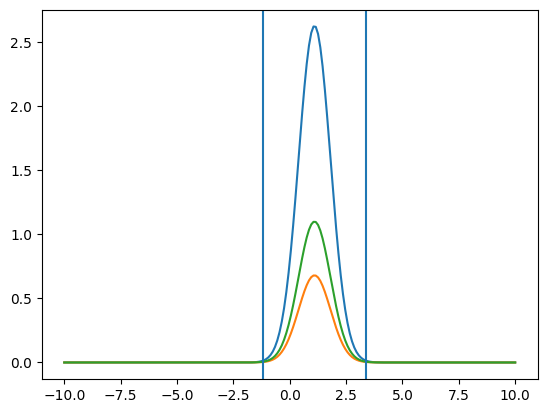

*Extracting Pieces for TH1*
Available Functions:
	Num_Xbins(TH1_) returns number of X bins for a TH1
	XEdges_1d(TH1_) returns edges of x bins for a TH1
	Center_Xbins(TH1_) returns center values for x bins for a TH1
	Values_1d(TH1_) returns the y values for a TH1
	Errors_1d(TH1_) returns the error values for TH1
	Errors2_1d(TH1_) returns the squared error values for TH1
Enjoy using TH1s

You have access to information regarding all bin numbers, bin maxes, bin mins
Each goes _VAR_max_ min, bins, res, etc. 
All the names of them as well as edges.
Q2_Bin_Name[ 5 ]
W_Bin_Name[ 29 ]
MM1_Bin_Name[ 14 ]
MM2_Bin_Name[ 14 ]
theta_Bin_Name[ 10 ]
alpha_Bin_Name[ 10 ]
phi_Bin_Name[ 10 ]
_var_set_name_ [i]
_Xij_name_[i][j]
Also _mm1_name_ etc. for all Xijs
def Q2_Corr(Q2bin_) corrects the cross section for simulation so far as Q2 is concerned


In [2]:
#Gain access to functions used to change some of the aspects regarding arrays and the things in them
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Bin\ Conversions.ipynb

#Gain Access to functions used to work with momentum binning
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Momentum\ Bins.ipynb

#Gain Access to functions used to work with Fitting Functions
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Fitting\ Functions.ipynb

#Gain Access to functions used for TH2s 
#uproot or uproo4
#%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH2\ Functions.ipynb
#uproot3
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH1\ Functions-uproot3.ipynb

#Gain Access to the proper binning for the the various variables
%run /Users/cmc/analysis_phd/fitting/single_diff/Friend\ Binning\ Values.ipynb

In [9]:
#date="06-13-2022"
date="07-15-2024"
par="pip"
SLURM_ID="13866486"
top="m"+par
dir="/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_e16/"+date
#root_file=dir+"/exp_mm_"+par+"_e16_"+date+"_"+SLURM_ID+".root"
root_file=dir+"/sim_e16_clas6_mm_"+par+"_"+date+".root"
file=uproot3.open(root_file)


color_order = ['b','g','r']
cut_names=['tight','mid','loose']
cut_sig = [2.5,3,3.5]
sign2 = [-1,1]

In [10]:
Particle=''
if par == "pro":
    Particle = "Proton"
elif par == "pip":
    Particle = "\u03C0+"
elif par == "pim":
    Particle = "\u03C0-"

In [11]:
#The Various layers of TDirectories to get to the histograms
layer0='MM'
layer1='MM_'+top
layer2=layer1+"_no-cut"
layer3=[layer2+"_sec"+str(i+1) for i in range(6)]
layer4=[layer3[i]+"_clean" for i in range(6)]
layer51=[layer4[i]+"_W_dep" for i in range(6)]
layer52=[layer4[i]+"_W_Range" for i in range(6)]
dir_loc=[([layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer51[i]],[layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer52[i]]) for i in range(6)]
names1=[["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:"+W_Bin_Name[j] for j in range(_W_bins_)] for i in range(6)]
names2=["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:in_range" for i in range(6)]
#Histogram Names
hist_name=[[[file[dir_loc[i][0][0]][names1[i][j]] for j in range(_W_bins_)],file[dir_loc[i][1][0]][names2[i]]] for i in range(6)]
           

In [12]:
def fit_function(x_, bkgd_, n_, pars_):
    if bkgd_:
        gaus_pars = np.zeros(3)
        for i in range(3):
            gaus_pars[i] = pars_[i]
        poly_pars = np.zeros(n_+1)
        for i in range(n_+1):
            poly_pars[i] = pars_[i+3]
        return Gaus(x,*gaus_pars)+Poly(x,*poly_pars)
    else:
        return Gaus(x,*pars_)

In [13]:
x_tmp = Center_Xbins(hist_name[0][1])
print(x_tmp[50])
print(x_tmp[90])


0.025500001320615417
0.06550000266171993


Value Error1.1
	Just skip it for now


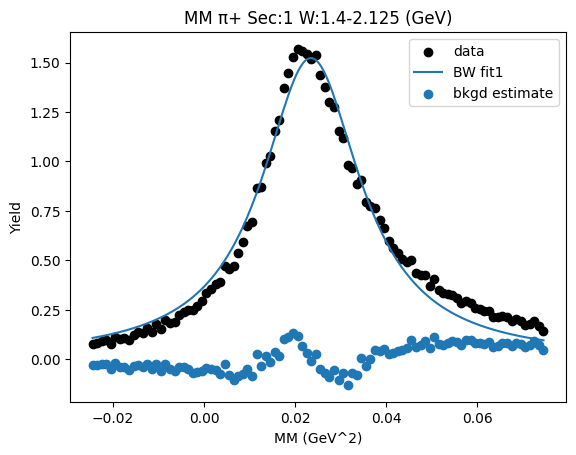

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.00537801 0.0034313  0.00192017]
 [0.0488016  0.05553961 0.06271319]]
Cut Bounds Err [[8.59352885e-07 8.22170159e-07 7.16735459e-07]
 [2.58867708e-06 3.30775820e-06 4.09608416e-06]]


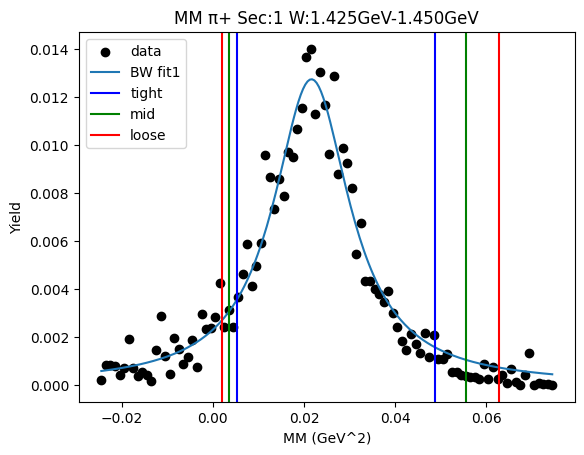

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.00455778 0.0027136  0.00134491]
 [0.0491521  0.05622678 0.06377696]]
Cut Bounds Err [[7.43267347e-07 6.86945370e-07 5.63585221e-07]
 [2.44084040e-06 3.12695136e-06 3.88100649e-06]]


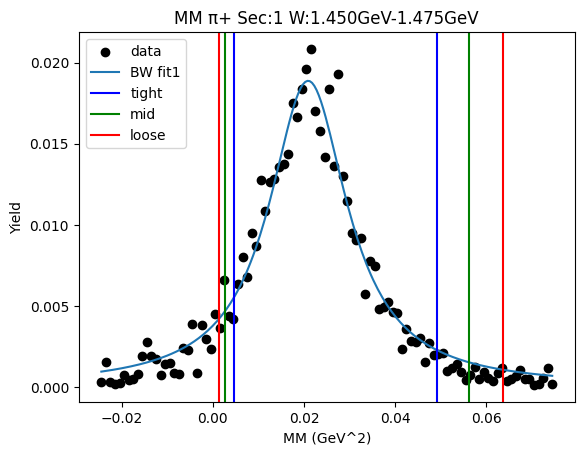

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.00526515 0.00336756 0.00189225]
 [0.04746672 0.05400944 0.06097444]]
Cut Bounds Err [[6.93904389e-07 6.64690920e-07 5.80638637e-07]
 [2.08347693e-06 2.66193251e-06 3.29602995e-06]]


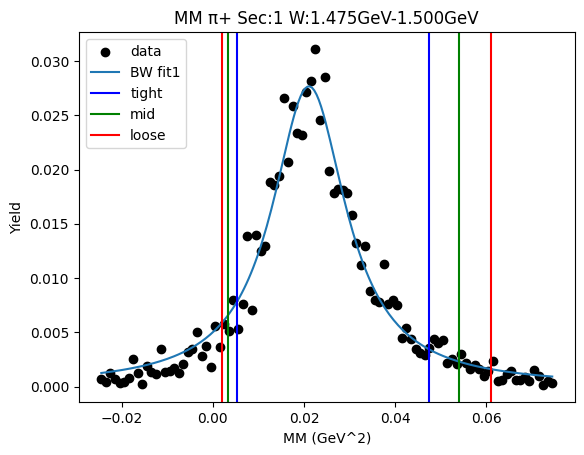

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.00545586 0.00345696 0.00191214]
 [0.05041941 0.05741322 0.06486111]]
Cut Bounds Err [[6.88807380e-07 6.56734088e-07 5.69196520e-07]
 [2.09394416e-06 2.67638426e-06 3.31508521e-06]]


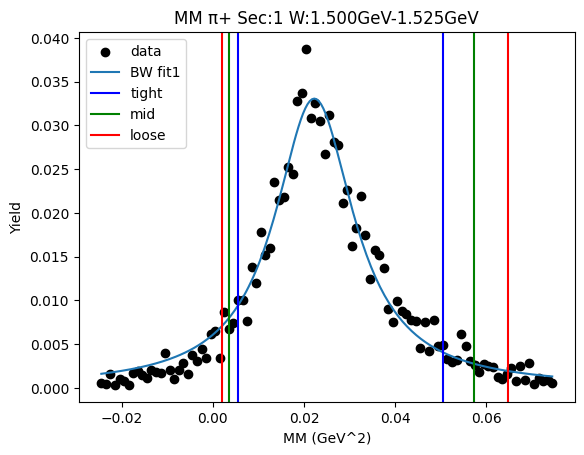

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.00555205 0.00348071 0.00189077]
 [0.05274251 0.06010927 0.06795742]]
Cut Bounds Err [[8.52511359e-07 8.08520758e-07 6.94450600e-07]
 [2.62756786e-06 3.35991256e-06 4.16332391e-06]]


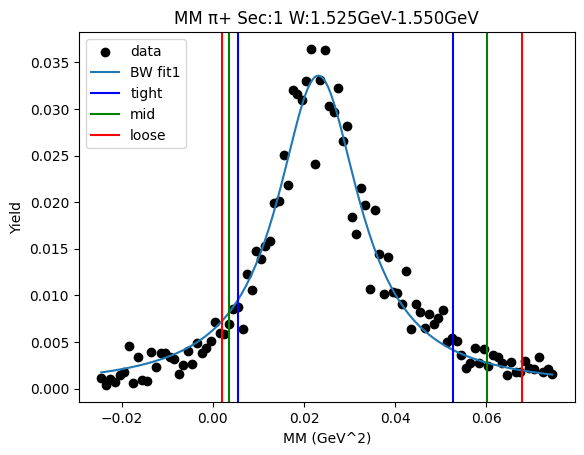

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.00481787 0.00277531 0.00129251]
 [0.05603049 0.06423045 0.07299018]]
Cut Bounds Err [[1.36526525e-06 1.24122062e-06 9.87159667e-07]
 [4.65587812e-06 5.97122747e-06 7.41825850e-06]]


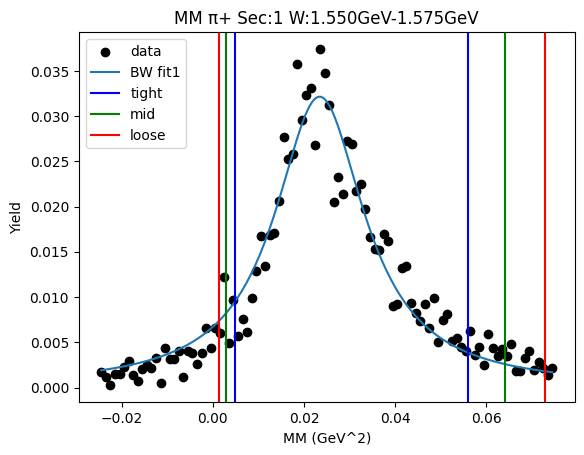

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.0048008  0.00280581 0.00134337]
 [0.05404086 0.06189388 0.07027945]]
Cut Bounds Err [[1.15145143e-06 1.05442142e-06 8.50266032e-07]
 [3.86322277e-06 4.95231977e-06 6.14994246e-06]]


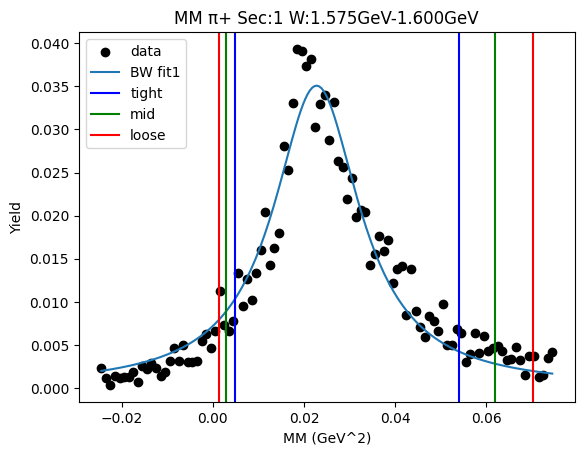

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.00401174 0.00205183 0.00074289]
 [0.05941402 0.06853457 0.07830609]]
Cut Bounds Err [[1.47010707e-06 1.25944717e-06 8.83204353e-07]
 [5.65753572e-06 7.27887811e-06 9.06771691e-06]]


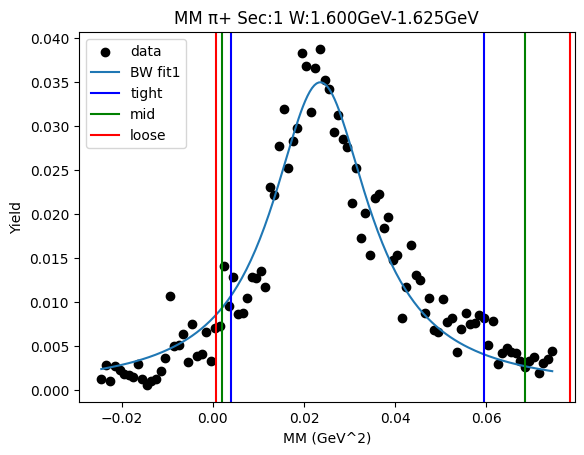

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.00536563 0.0033361  0.00178654]
 [0.05205938 0.0593686  0.06715779]]
Cut Bounds Err [[8.93493914e-07 8.43886077e-07 7.19672649e-07]
 [2.78311193e-06 3.55993942e-06 4.41241624e-06]]


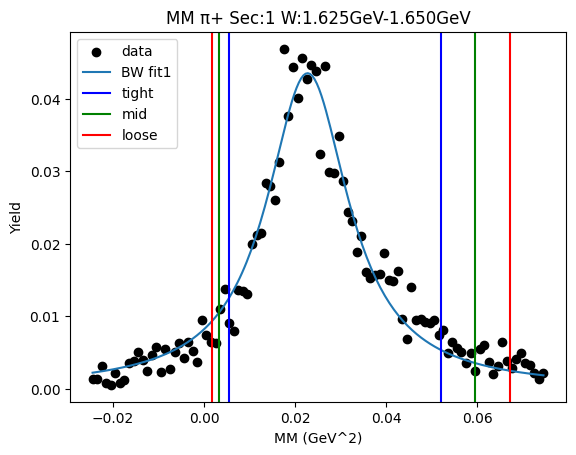

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.00548415 0.00345794 0.00189691]
 [0.05133078 0.0584739  0.06608219]]
Cut Bounds Err [[9.42290721e-07 8.96227556e-07 7.73560113e-07]
 [2.88283037e-06 3.68544917e-06 4.56576322e-06]]


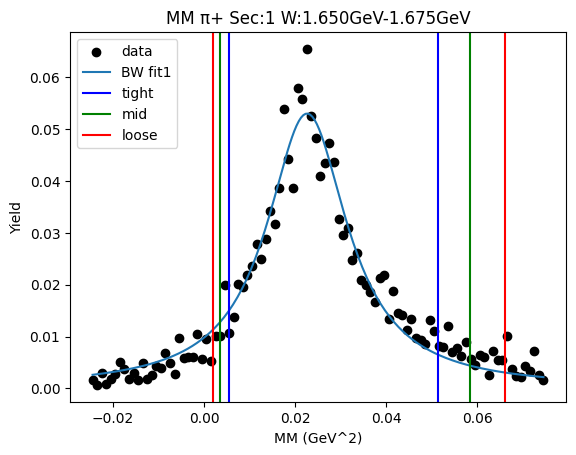

W bin: 11 1.675GeV-1.700GeV
Cut Bounds [[0.00430286 0.00237031 0.00100967]
 [0.05508433 0.06330807 0.07210373]]
Cut Bounds Err [[1.44521743e-06 1.28487953e-06 9.77301517e-07]
 [5.17092694e-06 6.64033035e-06 8.25879899e-06]]


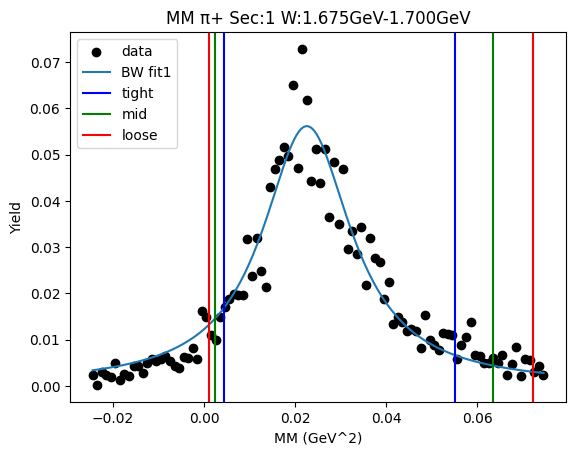

W bin: 12 1.700GeV-1.725GeV
Cut Bounds [[0.00548231 0.00343703 0.00186709]
 [0.05207816 0.05935206 0.06710129]]
Cut Bounds Err [[8.85161322e-07 8.39488284e-07 7.21055758e-07]
 [2.72815195e-06 3.48851499e-06 4.32266464e-06]]


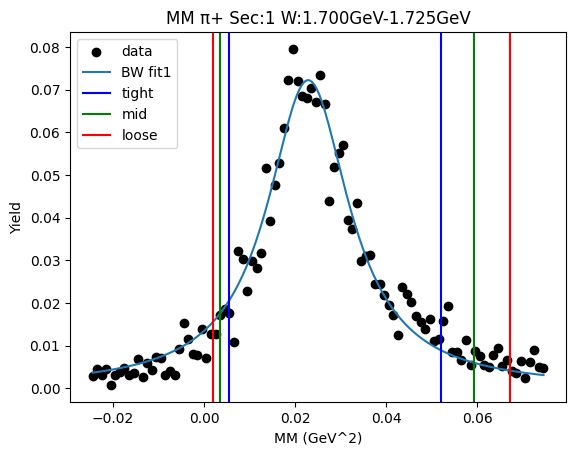

W bin: 13 1.725GeV-1.750GeV
Cut Bounds [[0.0054603  0.00331399 0.00170079]
 [0.05624494 0.06425555 0.07279928]]
Cut Bounds Err [[1.10696293e-06 1.03299470e-06 8.62424140e-07]
 [3.55276487e-06 4.54860375e-06 5.64234313e-06]]


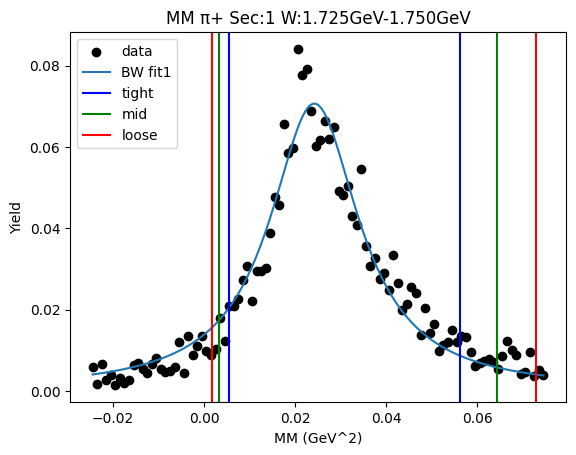

W bin: 14 1.750GeV-1.775GeV
Cut Bounds [[0.00402934 0.00204161 0.00072314]
 [0.06071602 0.07006562 0.08008449]]
Cut Bounds Err [[1.48595472e-06 1.26708873e-06 8.78872137e-07]
 [5.76819886e-06 7.42289224e-06 9.24887009e-06]]


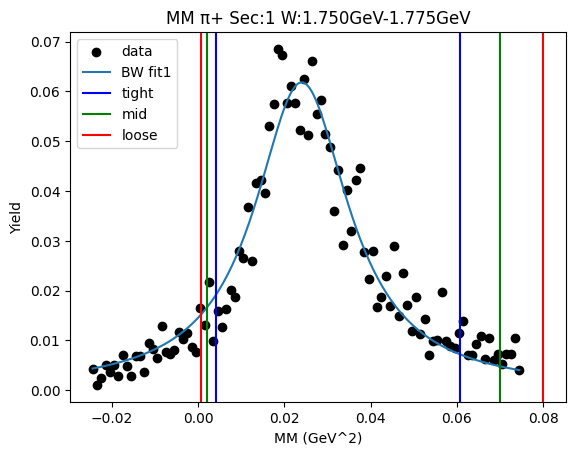

W bin: 15 1.775GeV-1.800GeV
Cut Bounds [[0.00339107 0.00152282 0.00039258]
 [0.0626647  0.07265117 0.08337566]]
Cut Bounds Err [[1.74760642e-06 1.40296751e-06 8.30218065e-07]
 [7.51253824e-06 9.69047901e-06 1.20989445e-05]]


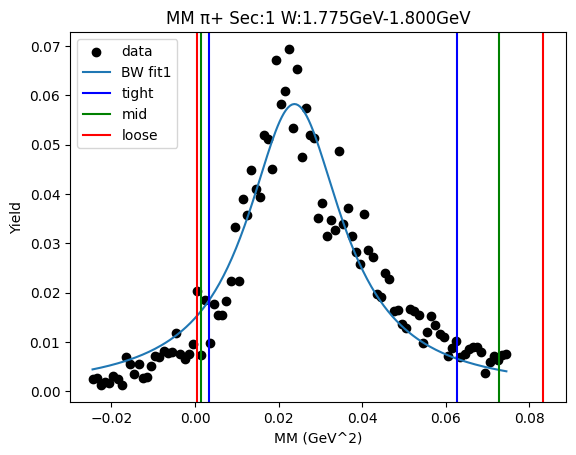

W bin: 16 1.800GeV-1.825GeV
Cut Bounds [[0.00458493 0.00257327 0.00113857]
 [0.05643453 0.06479278 0.073728  ]]
Cut Bounds Err [[1.10284256e-06 9.89685931e-07 7.67207981e-07]
 [3.86918595e-06 4.96613310e-06 6.17376948e-06]]


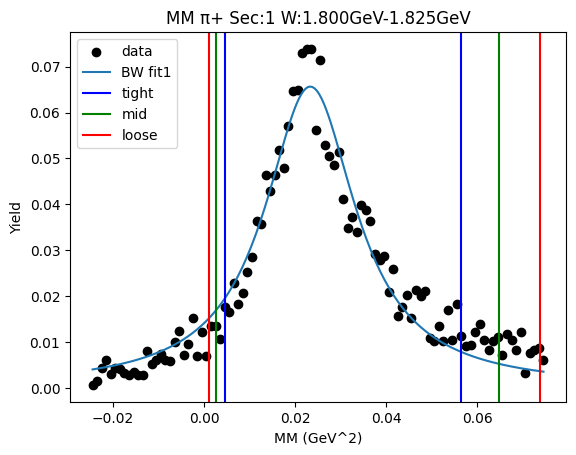

W bin: 17 1.825GeV-1.850GeV
Cut Bounds [[0.00375728 0.00181078 0.00056691]
 [0.06186689 0.07154232 0.08192037]]
Cut Bounds Err [[1.62851572e-06 1.35434220e-06 8.83184203e-07]
 [6.60821957e-06 8.51289431e-06 1.06167251e-05]]


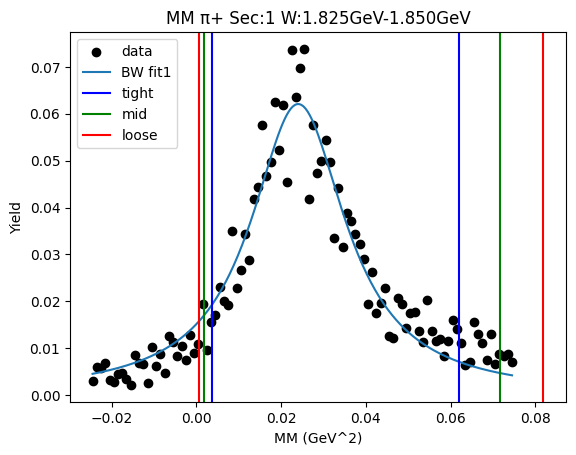

W bin: 18 1.850GeV-1.875GeV
Cut Bounds [[0.00402378 0.00197998 0.00065335]
 [0.06390596 0.07383859 0.0844884 ]]
Cut Bounds Err [[1.55646686e-06 1.30797516e-06 8.75676753e-07]
 [6.20287942e-06 7.98749486e-06 9.95794682e-06]]


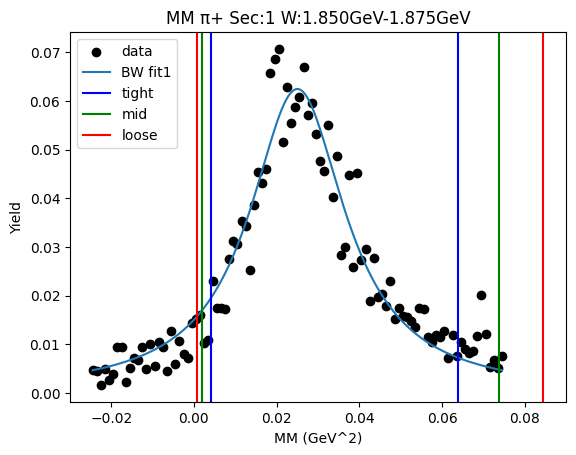

W bin: 19 1.875GeV-1.900GeV
Cut Bounds [[0.00313633 0.00131963 0.00027724]
 [0.06389045 0.07422456 0.08533299]]
Cut Bounds Err [[1.44103422e-06 1.11981695e-06 5.98213883e-07]
 [6.50400794e-06 8.39836231e-06 1.04951488e-05]]


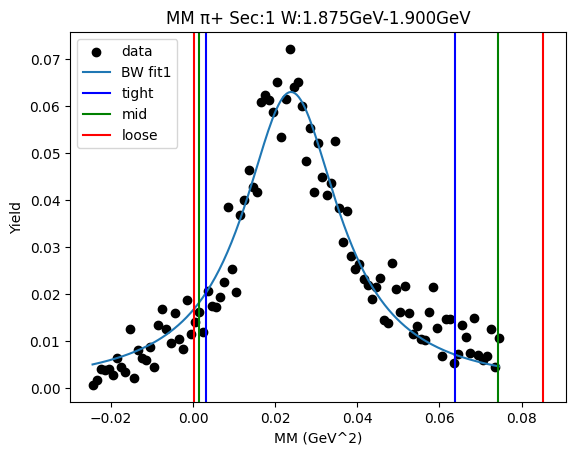

W bin: 20 1.900GeV-1.925GeV
background fit [0.01051254 1.         0.06       0.00314582 1.4        0.2       ]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0025531786108748122 0.04148088598740586
Breit-Wigner Peak [0.00699639 0.14838137 0.08054782]
Gaus2 [0.24094198 0.89873092 0.13785964]
Gaus3 [0.01062322 0.04372266 0.0210086 ]
Cut Bounds [[0.00393031 0.0020752  0.0008075 ]
 [0.05478902 0.06310565 0.07200969]]
Cut Bounds Err [[2.91347509e-05 2.54032552e-05 1.84869550e-05]
 [1.08778867e-04 1.40085582e-04 1.74578076e-04]]


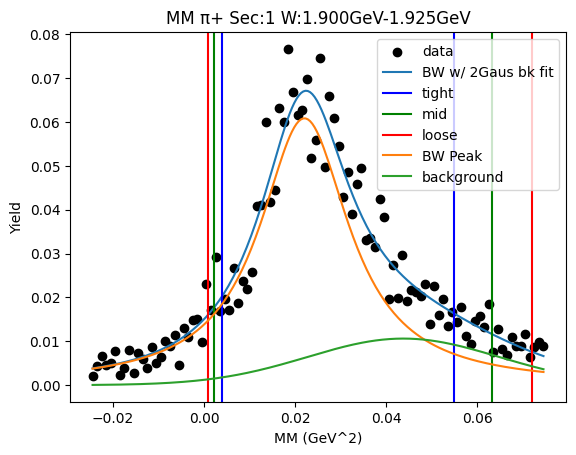

W bin: 21 1.925GeV-1.950GeV
background fit [0.21470095 1.56879403 0.20078095 0.00610308 0.0562489  0.00728107]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.011563947779023032 0.03486360833414362
Breit-Wigner Peak [0.00490192 0.15236068 0.06231594]
Gaus2 [0.01994733 0.03       0.02285414]
Gaus3 [0.00341077 0.06783988 0.01422242]
Cut Bounds [[0.00740755 0.00530107 0.00354617]
 [0.04780968 0.05378362 0.06010914]]
Cut Bounds Err [[2.50547693e-05 2.54318346e-05 2.42660702e-05]
 [6.36518459e-05 8.10067314e-05 9.99056634e-05]]


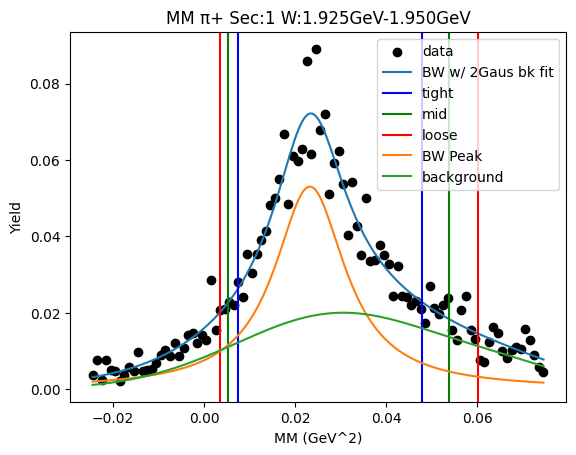

W bin: 22 1.950GeV-1.975GeV
background fit [8.93378489e-03 5.97859974e-02 5.61315005e-03 1.14999309e-02
 2.99916453e+03 4.38842782e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.0015885011796568545 0.04767431385564734
Breit-Wigner Peak [0.0089364  0.1517989  0.09061164]
Gaus2 [0.0092008  0.05973749 0.00860924]
Gaus3 [1.14999309e-02 2.99916453e+03 4.38842782e-02]
Cut Bounds [[0.00306955 0.00130498 0.00028377]
 [0.06160039 0.07154198 0.08222694]]
Cut Bounds Err [[1.14623516e-06 8.95668922e-07 4.86887677e-07]
 [5.13485220e-06 6.63172545e-06 8.28809341e-06]]


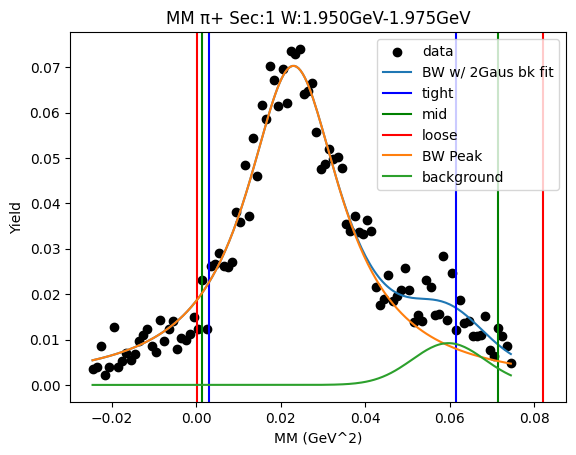

W bin: 23 1.975GeV-2.000GeV
background fit [4.99224681e-03 5.20345544e-02 7.51332087e-03 1.14999309e-02
 2.99916453e+03 4.38842782e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.006928091137277978 0.05291003897947951
Breit-Wigner Peak [0.00872025 0.15162775 0.09986502]
Gaus2 [0.00657057 0.05270444 0.0133174 ]
Gaus3 [1.14999309e-02 2.99916453e+03 4.38842782e-02]
Cut Bounds [[2.06010392e-03 5.82763339e-04 8.36722540e-06]
 [6.64954557e-02 7.79051855e-02 9.02178597e-02]]
Cut Bounds Err [[2.75061038e-06 1.71637403e-06 2.36577375e-07]
 [1.56271757e-05 1.98449042e-05 2.45656768e-05]]


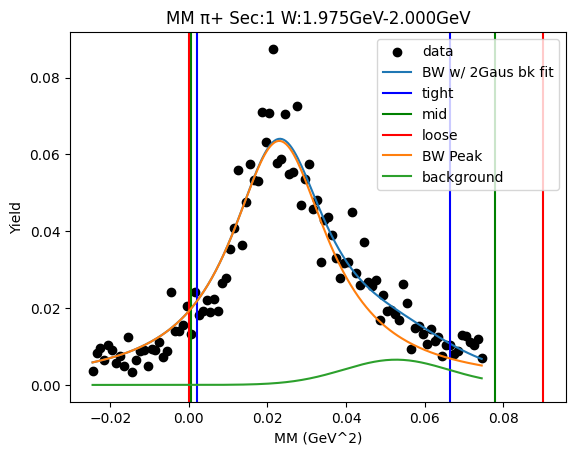

W bin: 24 2.000GeV-2.025GeV
background fit [5.56949532e-03 5.98545552e-02 7.88673769e-03 1.14999309e-02
 2.99916453e+03 4.38842782e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.0007701173020381695 0.04678163600854425
Breit-Wigner Peak [0.00893487 0.1516765  0.08902411]
Gaus2 [0.00649524 0.06090496 0.01914942]
Gaus3 [1.14999309e-02 2.99916453e+03 4.38842782e-02]
Cut Bounds [[0.00324558 0.00144618 0.00036433]
 [0.06070458 0.07039698 0.08080693]]
Cut Bounds Err [[2.15728948e-06 1.71098538e-06 9.95837417e-07]
 [9.32981375e-06 1.19374590e-05 1.48308511e-05]]


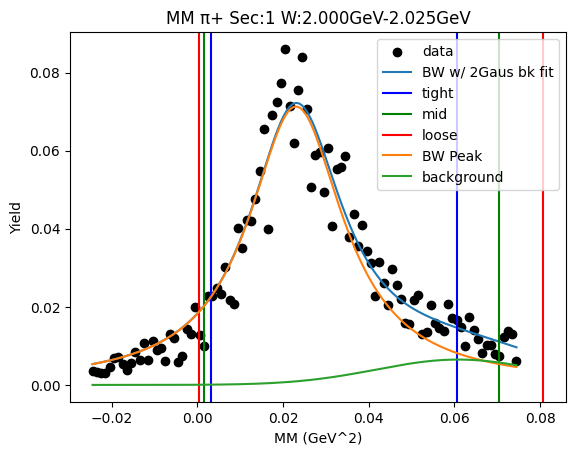

W bin: 25 2.025GeV-2.050GeV
background fit [8.17827071e-03 5.30892353e-02 6.41171010e-03 1.14999309e-02
 2.99916453e+03 4.38842782e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.0070091232592799715 0.0504922334519152
Breit-Wigner Peak [0.009003   0.14745018 0.09789566]
Gaus2 [0.0089628  0.05494574 0.01226881]
Gaus3 [1.14999309e-02 2.99916453e+03 4.38842782e-02]
Cut Bounds [[1.87539782e-03 5.05215554e-04 2.71635752e-06]
 [6.32997890e-02 7.42144850e-02 8.59968640e-02]]
Cut Bounds Err [[1.54942782e-06 9.59479575e-07 8.17920235e-08]
 [9.00172575e-06 1.16289825e-05 1.45532100e-05]]


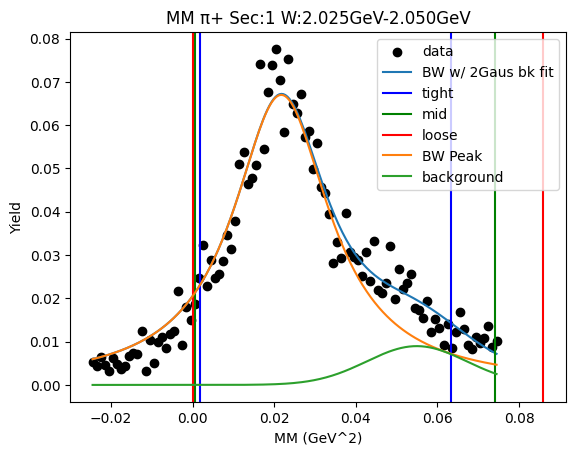

W bin: 26 2.050GeV-2.075GeV
background fit [5.87846211e-03 5.71542507e-02 7.16915631e-03 1.14999309e-02
 2.99916453e+03 4.38842782e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.001396070455200505 0.047536783042627984
Breit-Wigner Peak [0.00873247 0.15188929 0.09030767]
Gaus2 [0.00798375 0.05737797 0.02185776]
Gaus3 [1.14999309e-02 2.99916453e+03 4.38842782e-02]
Cut Bounds [[0.00311557 0.00133977 0.00030236]
 [0.0614848  0.07138284 0.08201928]]
Cut Bounds Err [[1.78857318e-06 1.39927347e-06 7.72778308e-07]
 [7.94550990e-06 1.02137218e-05 1.27277233e-05]]


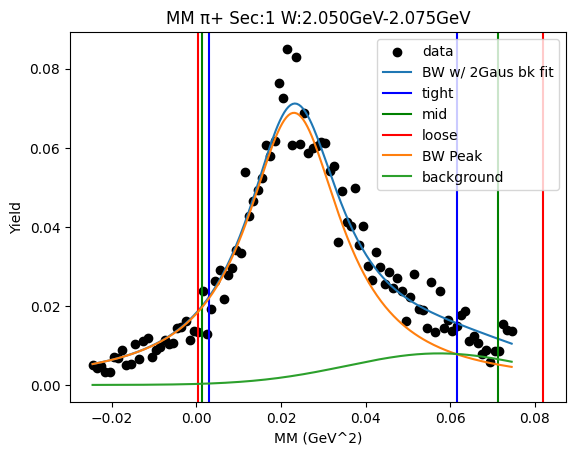

W bin: 27 2.075GeV-2.100GeV
background fit [7.64793829e-03 6.62538814e-02 1.36532711e-02 1.14999309e-02
 2.99916453e+03 4.38842782e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.013222919408200987 0.03142241952296524
Breit-Wigner Peak [0.00489749 0.14940773 0.05507495]
Gaus2 [0.02033928 0.03592274 0.02834068]
Gaus3 [1.14999309e-02 2.99916453e+03 4.38842782e-02]
Cut Bounds [[0.00824779 0.0062567  0.00454023]
 [0.04326321 0.0482752  0.05356181]]
Cut Bounds Err [[4.32692181e-06 4.52161651e-06 4.49328944e-06]
 [9.90990645e-06 1.25598140e-05 1.54331019e-05]]


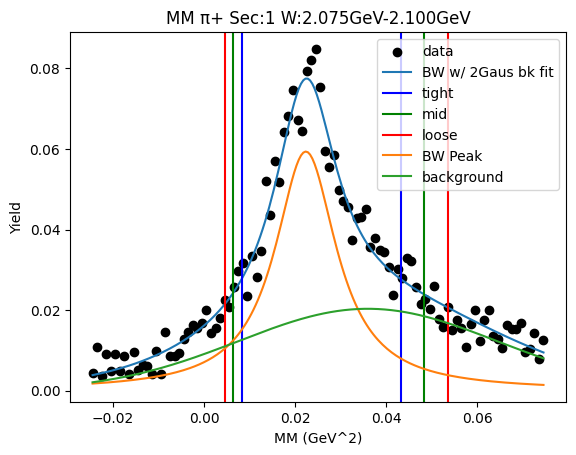

W bin: 28 2.100GeV-2.125GeV
background fit [6.32456181e-03 6.25342541e-02 1.12055827e-02 1.14999309e-02
 2.99916453e+03 4.38842782e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.0007351321657794868 0.046474592126104504
Breit-Wigner Peak [0.00933793 0.15122741 0.08870337]
Gaus2 [0.00760968 0.06316021 0.01621377]
Gaus3 [1.14999309e-02 2.99916453e+03 4.38842782e-02]
Cut Bounds [[0.0032333  0.00144317 0.00036542]
 [0.06031577 0.06994213 0.08028088]]
Cut Bounds Err [[1.98928511e-06 1.58552164e-06 9.27492863e-07]
 [8.59190323e-06 1.10378109e-05 1.37473604e-05]]


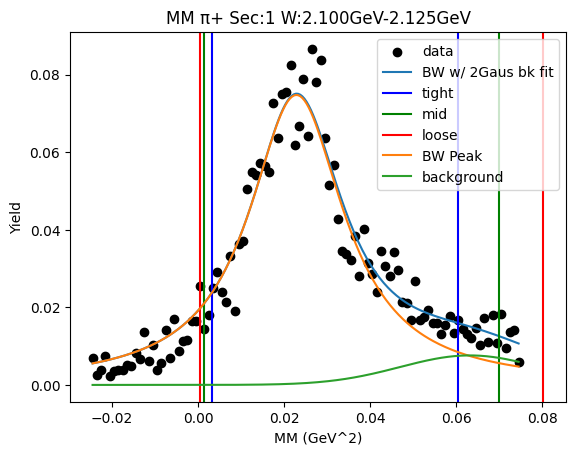

Value Error1.1
	Just skip it for now


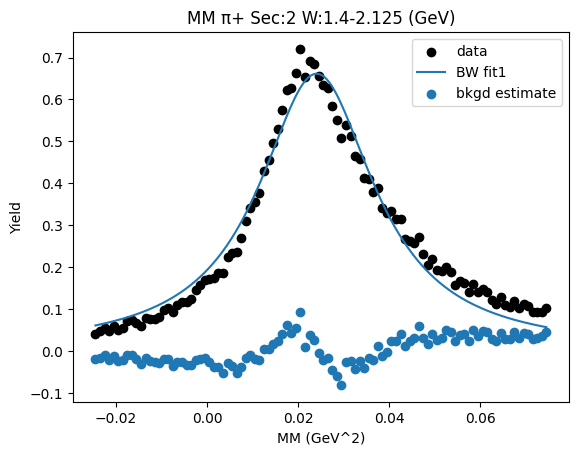

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.00072663 0.0010489  0.00143016]
 [0.00074805 0.00107461 0.00146015]]
Cut Bounds Err [[ 60930.23686338  87846.51909857 119672.87962126]
 [ 61821.72032423  88916.29925159 120920.95646646]]


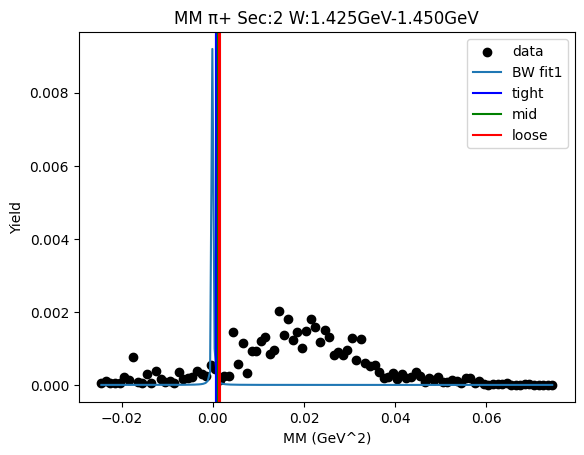

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.00180162 0.00259648 0.00353619]
 [0.00181958 0.00261803 0.00356133]]
Cut Bounds Err [[ 712538.60683781 1026480.59226011 1397567.33236733]
 [ 716080.26028509 1030730.57639685 1402525.64719352]]


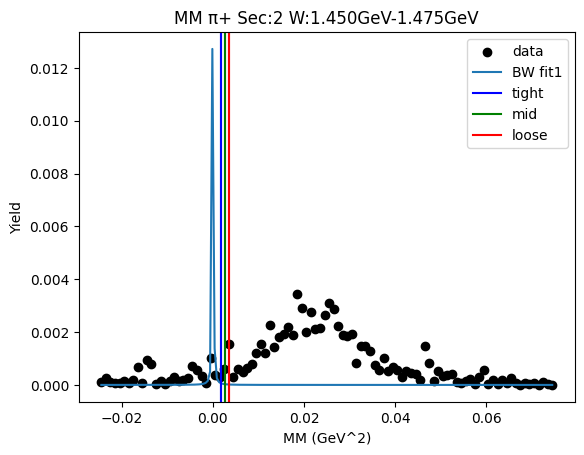

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.0035726  0.00179117 0.00061868]
 [0.05487846 0.06335819 0.07244687]]
Cut Bounds Err [[3.52457512e-06 2.98949065e-06 2.04759249e-06]
 [1.38138652e-05 1.77799225e-05 2.21575250e-05]]


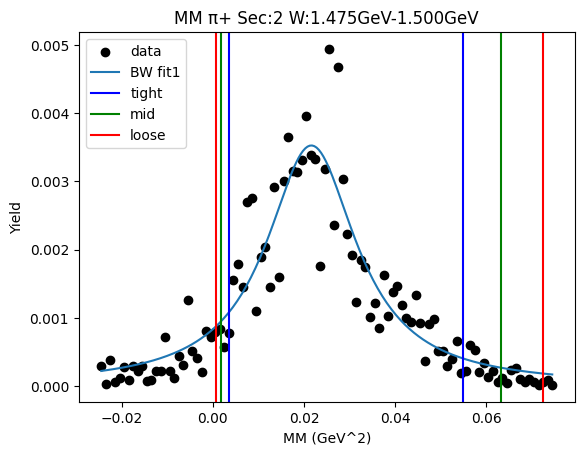

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.00495315 0.00296536 0.00148468]
 [0.05272264 0.06028874 0.06836196]]
Cut Bounds Err [[2.48791023e-06 2.30580175e-06 1.90137572e-06]
 [8.11694203e-06 1.03968462e-05 1.29020537e-05]]


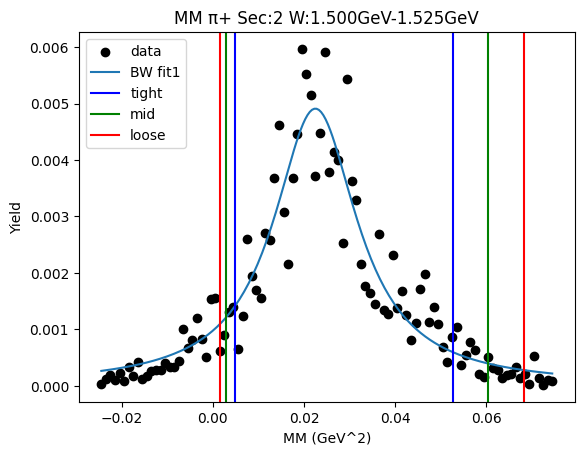

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.00491924 0.00278136 0.0012489 ]
 [0.05959693 0.06839458 0.07779766]]
Cut Bounds Err [[2.74931619e-06 2.47640207e-06 1.93393542e-06]
 [9.56946118e-06 1.22801503e-05 1.52637403e-05]]


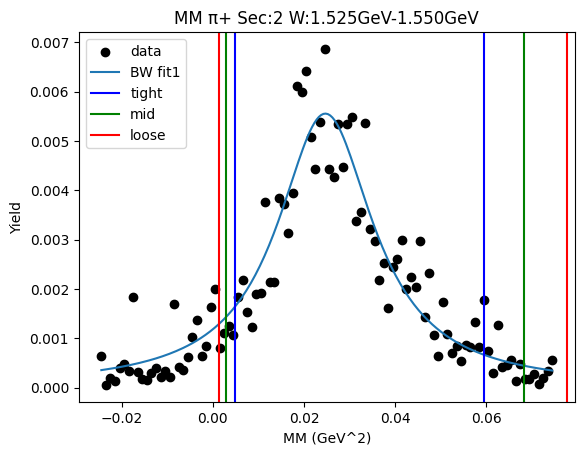

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.00410847 0.00214158 0.00080981]
 [0.0587086  0.06766174 0.07724999]]
Cut Bounds Err [[3.34952742e-06 2.89689977e-06 2.07608437e-06]
 [1.26617660e-05 1.62831209e-05 2.02769851e-05]]


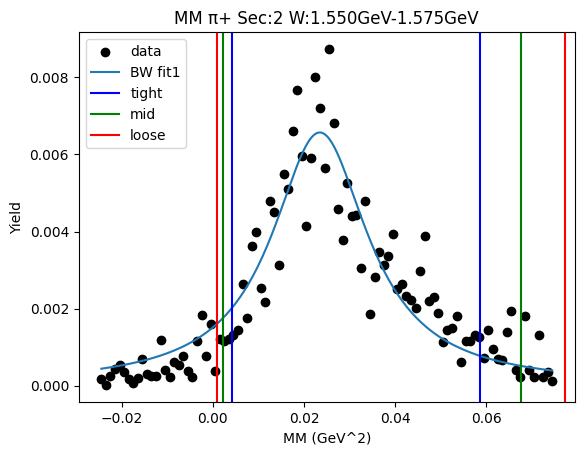

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.00338383 0.00153916 0.00041183]
 [0.06128414 0.07101953 0.08147226]]
Cut Bounds Err [[4.08137674e-06 3.29751677e-06 1.98794051e-06]
 [1.73690766e-05 2.23992993e-05 2.79608752e-05]]


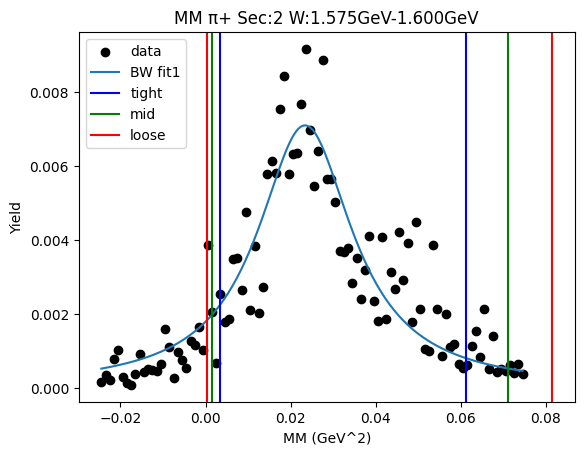

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[1.68873195e-03 3.51825619e-04 1.28174995e-05]
 [6.99421971e-02 8.22559838e-02 9.55676687e-02]]
Cut Bounds Err [[3.90287158e-06 2.13440609e-06 4.74849154e-07]
 [2.51173338e-05 3.26360111e-05 4.10024220e-05]]


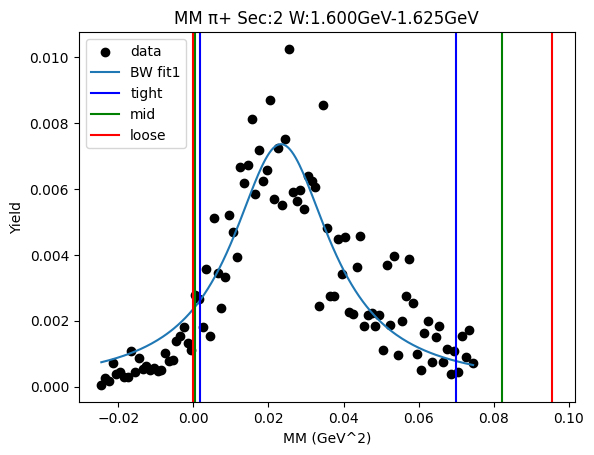

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.00321915 0.00145177 0.00037895]
 [0.05909349 0.06850099 0.07860304]]
Cut Bounds Err [[2.92143086e-06 2.35023065e-06 1.39942833e-06]
 [1.25168450e-05 1.61439353e-05 2.01547223e-05]]


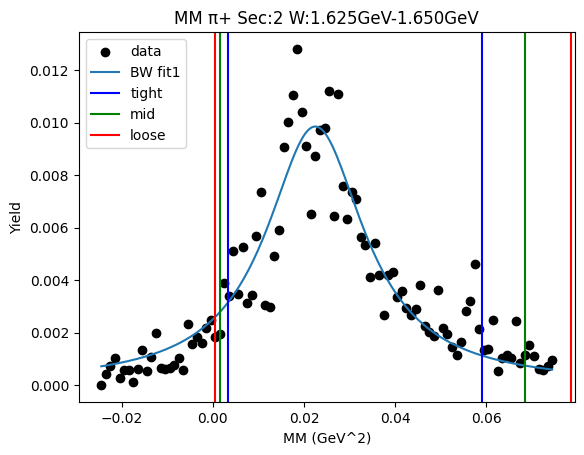

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.00304863 0.0013076  0.00029265]
 [0.06039357 0.07012152 0.08057556]]
Cut Bounds Err [[2.35692288e-06 1.84915839e-06 1.01956145e-06]
 [1.04903123e-05 1.35413702e-05 1.69176320e-05]]


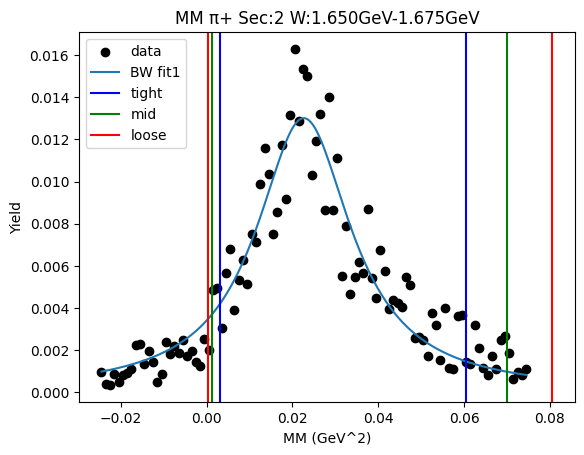

W bin: 11 1.675GeV-1.700GeV
Cut Bounds [[0.00371577 0.00186071 0.00064084]
 [0.05720185 0.06604401 0.07552135]]
Cut Bounds Err [[1.98510020e-06 1.68274579e-06 1.15090636e-06]
 [7.78866559e-06 1.00252717e-05 1.24940050e-05]]


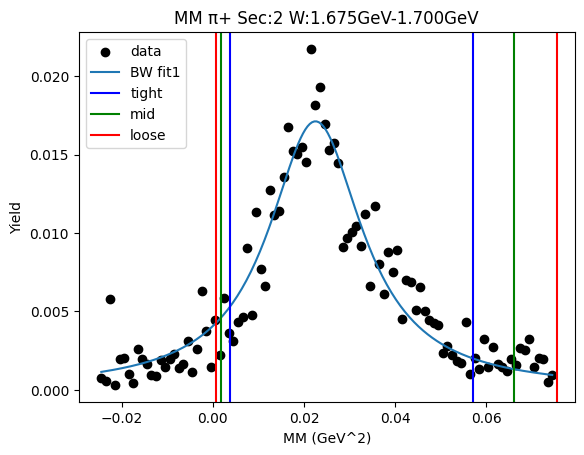

W bin: 12 1.700GeV-1.725GeV
Cut Bounds [[0.00473527 0.00271282 0.00125005]
 [0.05574297 0.06392205 0.07266083]]
Cut Bounds Err [[1.90527558e-06 1.72742422e-06 1.36656262e-06]
 [6.53702678e-06 8.38521216e-06 1.04187435e-05]]


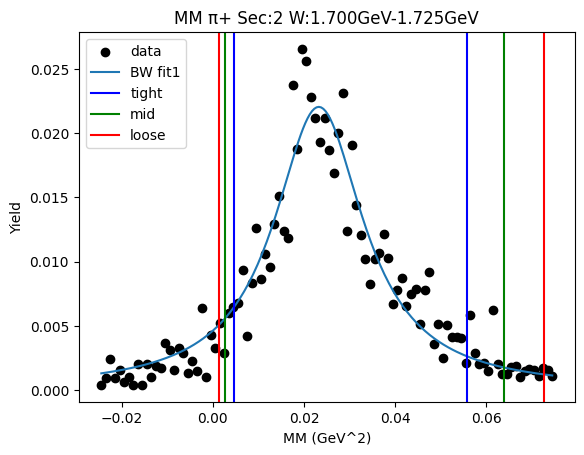

W bin: 13 1.725GeV-1.750GeV
Cut Bounds [[0.004897   0.00277846 0.00125626]
 [0.05888038 0.06755852 0.07683299]]
Cut Bounds Err [[2.03332813e-06 1.83467572e-06 1.43773625e-06]
 [7.05062882e-06 9.04684447e-06 1.12438252e-05]]


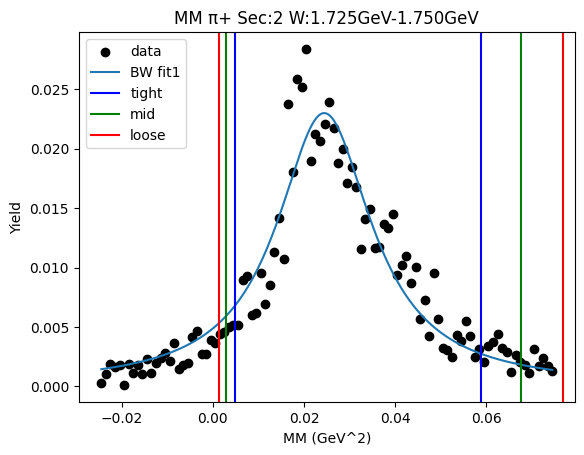

W bin: 14 1.750GeV-1.775GeV
Cut Bounds [[0.00387868 0.00189888 0.00061868]
 [0.06215436 0.0718297  0.08220464]]
Cut Bounds Err [[2.10128652e-06 1.76129659e-06 1.17169703e-06]
 [8.41161313e-06 1.08326743e-05 1.35061177e-05]]


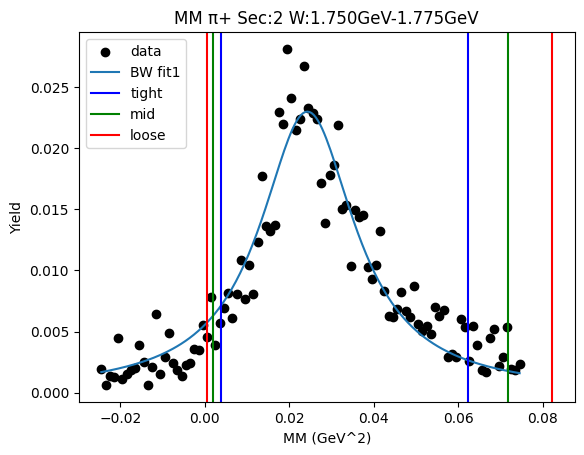

W bin: 15 1.775GeV-1.800GeV
Cut Bounds [[0.00322203 0.00137817 0.00030571]
 [0.06408771 0.07441698 0.08551765]]
Cut Bounds Err [[2.67079828e-06 2.09259214e-06 1.14866662e-06]
 [1.19114220e-05 1.53769288e-05 1.92119124e-05]]


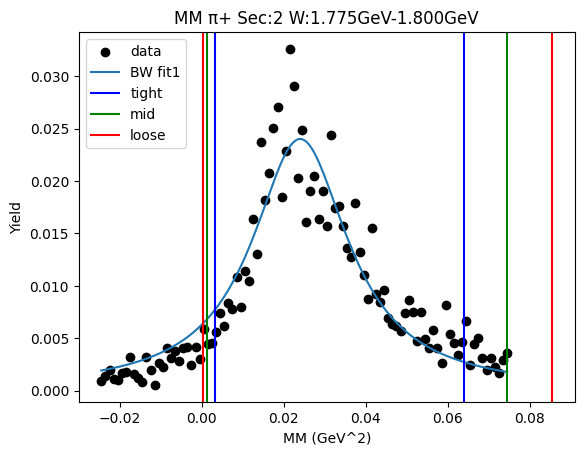

W bin: 16 1.800GeV-1.825GeV
Cut Bounds [[0.00375923 0.0018362  0.00059484]
 [0.06048094 0.06990226 0.08000524]]
Cut Bounds Err [[1.71166096e-06 1.43305548e-06 9.50599059e-07]
 [6.86558829e-06 8.84195956e-06 1.10244612e-05]]


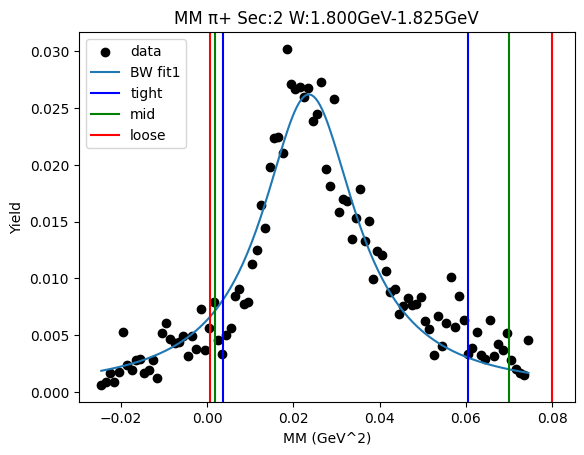

W bin: 17 1.825GeV-1.850GeV
Cut Bounds [[0.0038021  0.00177629 0.00051216]
 [0.06595249 0.07635676 0.08752271]]
Cut Bounds Err [[2.02357700e-06 1.65700321e-06 1.03700095e-06]
 [8.42798130e-06 1.08640060e-05 1.35561487e-05]]


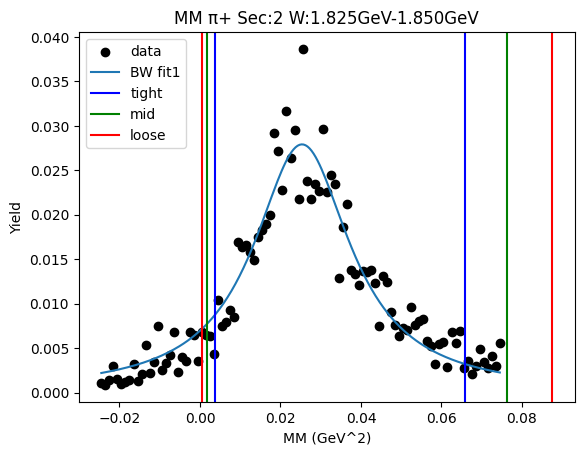

W bin: 18 1.850GeV-1.875GeV
Cut Bounds [[1.60742349e-03 2.95617759e-04 3.25539809e-05]
 [7.24062879e-02 8.52542551e-02 9.91509642e-02]]
Cut Bounds Err [[1.60107462e-06 8.22685918e-07 3.18214088e-07]
 [1.07456962e-05 1.39709788e-05 1.75616704e-05]]


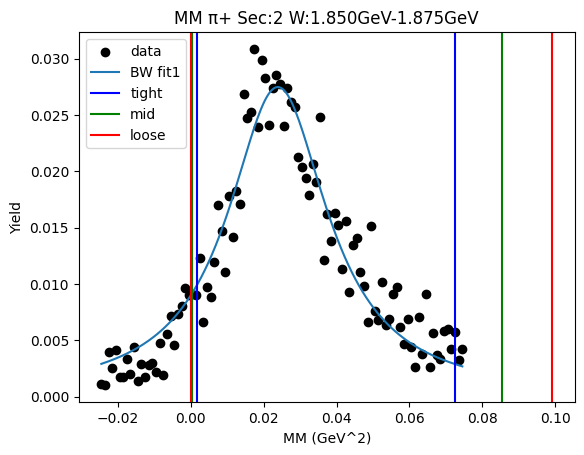

W bin: 19 1.875GeV-1.900GeV
Cut Bounds [[1.91883736e-03 4.47480031e-04 2.24127329e-06]
 [7.30689323e-02 8.58275940e-02 9.96123742e-02]]
Cut Bounds Err [[1.97896169e-06 1.14505049e-06 9.44565370e-08]
 [1.22119407e-05 1.58581046e-05 1.99132093e-05]]


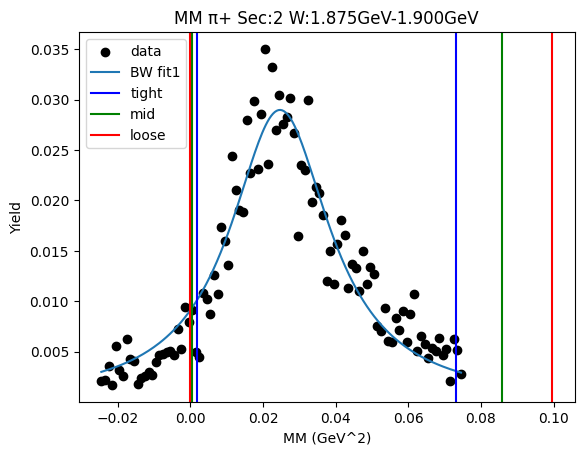

W bin: 20 1.900GeV-1.925GeV
background fit [0.00559673 1.         0.06       0.00212812 1.4        0.2       ]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0074881769703405085 0.04019528933333609
Breit-Wigner Peak [0.00337878 0.15440768 0.07383214]
Gaus2 [1.6294759  1.24894945 0.06813561]
Gaus3 [0.00532138 0.04215647 0.03302645]
Cut Bounds [[0.00575517 0.00361849 0.00197535]
 [0.05426688 0.06183253 0.06989174]]
Cut Bounds Err [[1.19476936e-05 1.13673610e-05 9.79807223e-06]
 [3.66878552e-05 4.69898972e-05 5.82815964e-05]]


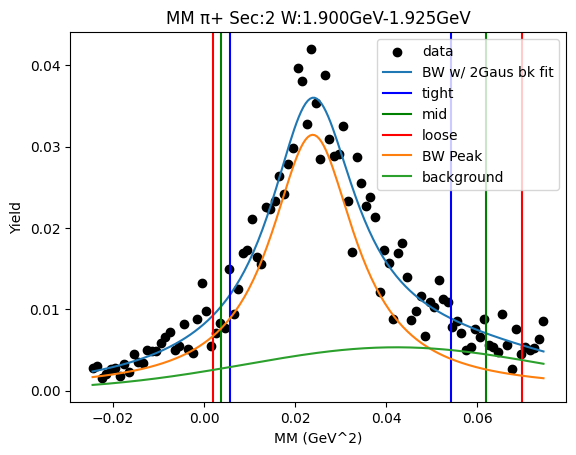

W bin: 21 1.925GeV-1.950GeV
background fit [1.46550644e+00 1.07895181e+01 1.40896413e+00 2.94813963e-03
 6.97592512e-02 1.30190095e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.0016808759823031087 0.04697201319538709
Breit-Wigner Peak [0.00404497 0.15048445 0.09004896]
Gaus2 [4.35549247e+00 2.11462355e+01 1.70191856e-03]
Gaus3 [0.00622872 0.04666551 0.02358501]
Cut Bounds [[0.00299074 0.00126226 0.00026794]
 [0.06065443 0.07045869 0.08099711]]
Cut Bounds Err [[3.25665613e-05 2.53878704e-05 1.36462235e-05]
 [1.46660670e-04 1.89678791e-04 2.37260650e-04]]


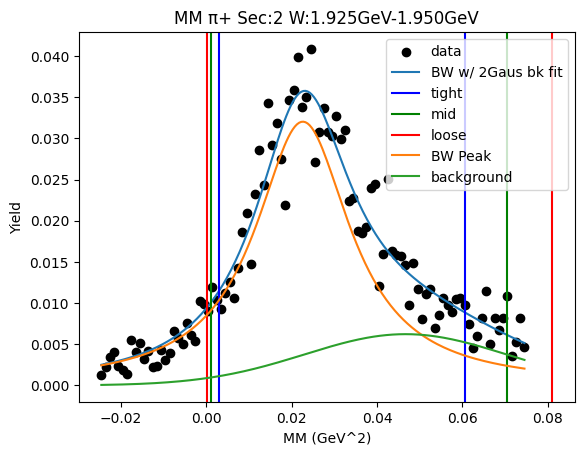

W bin: 22 1.950GeV-1.975GeV
background fit [2.74642619e+00 4.52773232e+01 2.99801411e+00 3.39393401e-03
 6.33263210e-02 5.82767788e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.003578809042173798 0.04767530591758039
Breit-Wigner Peak [0.00417553 0.14848653 0.09242485]
Gaus2 [ 7.22054124 45.08719811  8.18164817]
Gaus3 [0.0070727  0.04528031 0.02299465]
Cut Bounds [[0.00251625 0.00093009 0.00011734]
 [0.06091559 0.0710093  0.08187642]]
Cut Bounds Err [[1.15601339e-04 8.43385595e-05 3.49492032e-05]
 [5.68787879e-04 7.36922051e-04 9.23183638e-04]]


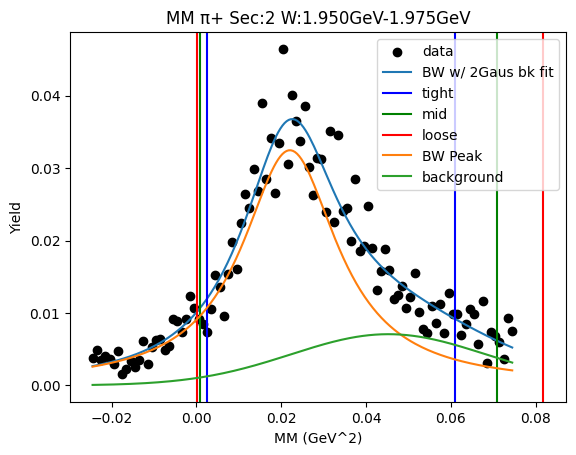

W bin: 23 1.975GeV-2.000GeV
background fit [1.66551381e+00 1.50263151e+02 3.20959191e+00 2.45475412e-03
 5.88338221e-02 7.96356301e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.002654552515974483 0.04726426017948254
Breit-Wigner Peak [0.00432955 0.1493481  0.09121295]
Gaus2 [  6.63749378 171.22395776  33.89385786]
Gaus3 [0.00964697 0.04016295 0.02066022]
Cut Bounds [[0.00273665 0.00108281 0.00018222]
 [0.06070466 0.07064441 0.08133743]]
Cut Bounds Err [[1.26691727e-04 9.56294125e-05 4.57681049e-05]
 [5.96690697e-04 7.72422387e-04 9.66953993e-04]]


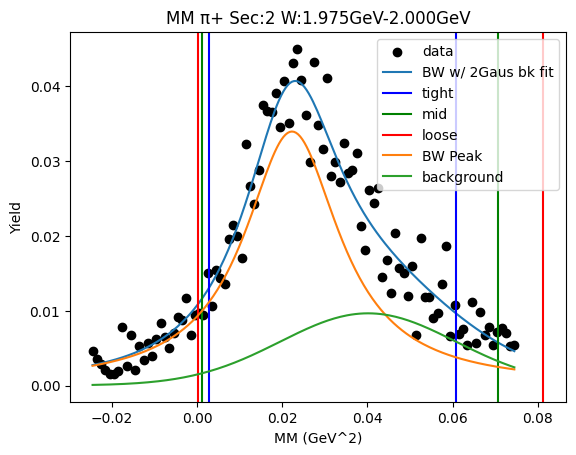

W bin: 24 2.000GeV-2.025GeV
background fit [4.09260527e+00 3.91293695e+02 3.97343390e+01 3.59155838e-03
 5.67889484e-02 8.04231675e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.0013984261504126731 0.04513663920303154
Breit-Wigner Peak [0.00520328 0.14788207 0.08806727]
Gaus2 [259.53008937 901.80095898  64.99618535]
Gaus3 [0.00727586 0.04834847 0.02267805]
Cut Bounds [[0.00293693 0.00125711 0.00027949]
 [0.05835638 0.06776045 0.07786672]]
Cut Bounds Err [[1.02655896e-05 8.05832701e-06 4.43255537e-06]
 [4.57594725e-05 5.91624499e-05 7.39851432e-05]]


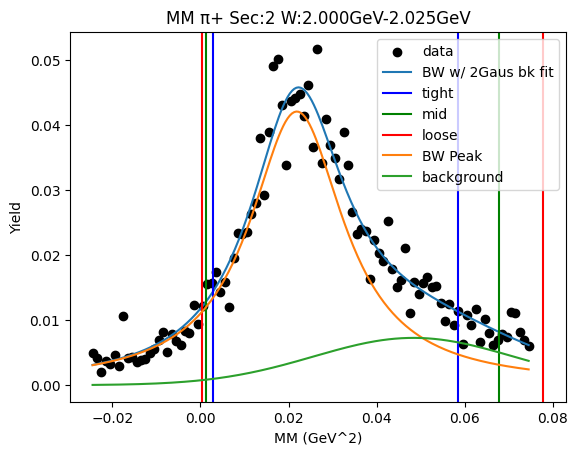

W bin: 25 2.025GeV-2.050GeV
background fit [1.93791746e+02 1.07847644e+03 1.02228573e+02 3.39762690e-03
 6.23699926e-02 1.30724704e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0027224661030211088 0.04030815994740529
Breit-Wigner Peak [0.00451317 0.14668099 0.07914722]
Gaus2 [ 193.52071218 1078.39827299  102.38578128]
Gaus3 [0.0125681  0.0389317  0.02405217]
Cut Bounds [[0.00390398 0.00208319 0.00082956]
 [0.05330565 0.0613652  0.0699919 ]]
Cut Bounds Err [[3.16528692e-05 2.77452932e-05 2.04261703e-05]
 [1.16962332e-04 1.50586428e-04 1.87622918e-04]]


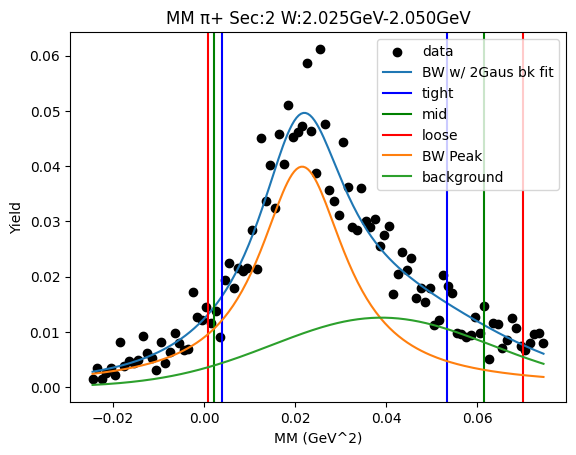

W bin: 26 2.050GeV-2.075GeV
background fit [1.93400709e+02 7.22353134e+02 1.11522278e+02 3.25498683e-03
 6.21583280e-02 1.07442700e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.0061103613575388335 0.04928090624806783
Breit-Wigner Peak [0.00546688 0.14691927 0.09608266]
Gaus2 [2266.50829678 5196.34889831  111.77082449]
Gaus3 [0.00813462 0.04648698 0.02128074]
Cut Bounds [[1.99841847e-03 5.88574502e-04 1.45728089e-05]
 [6.20681833e-02 7.26722923e-02 8.41122436e-02]]
Cut Bounds Err [[3.96220295e-06 2.57676466e-06 4.72638879e-07]
 [2.20814718e-05 2.86324469e-05 3.59076859e-05]]


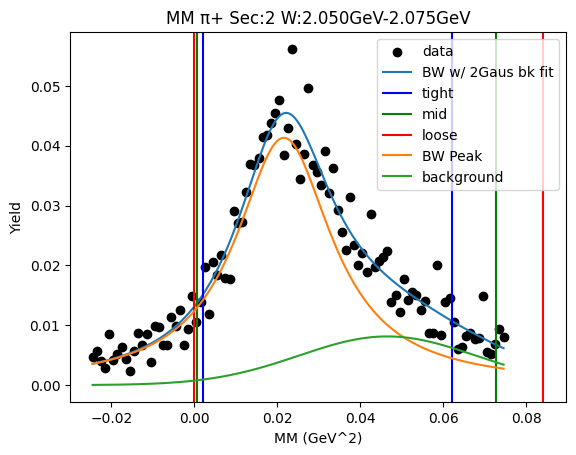

W bin: 27 2.075GeV-2.100GeV
background fit [1.22162625e+03 1.21371368e+04 3.37661505e+02 3.21177960e-03
 5.97345362e-02 1.06871027e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.00899881531345942 0.03529092381624621
Breit-Wigner Peak [0.00350722 0.14881152 0.06619681]
Gaus2 [ 1226.47825795 12124.99284738   341.87969402]
Gaus3 [0.01780013 0.03312532 0.02581472]
Cut Bounds [[0.0061449  0.00413513 0.0025221 ]
 [0.0480634  0.05443733 0.06120801]]
Cut Bounds Err [[1.82069919e-05 1.79212741e-05 1.63278773e-05]
 [5.09199777e-05 6.50238789e-05 8.04363953e-05]]


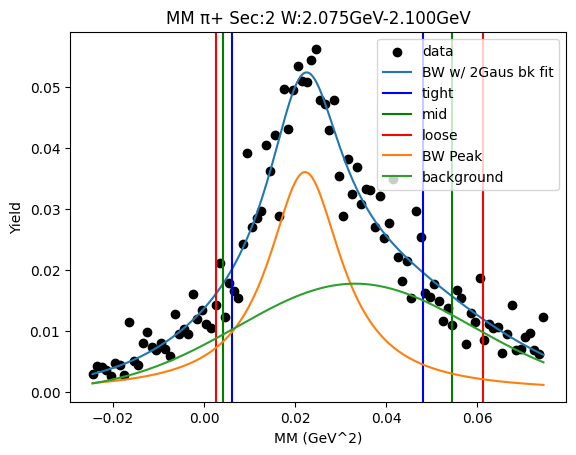

W bin: 28 2.100GeV-2.125GeV
background fit [4.93429919e-01 6.69956988e+03 3.31310697e+02 5.47802670e-03
 5.23795451e-02 6.47923574e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.014242317042481066 0.02639912629301263
Breit-Wigner Peak [0.00248087 0.14255077 0.04501261]
Gaus2 [2.49278865e+08 2.04262236e+01 2.89523607e+00]
Gaus3 [0.02310548 0.03       0.01915044]
Cut Bounds [[0.00896147 0.00723994 0.00570187]
 [0.03626607 0.04000547 0.04392831]]
Cut Bounds Err [[1.30632631e-05 1.40880991e-05 1.45849443e-05]
 [2.62792160e-05 3.31165018e-05 4.04826057e-05]]


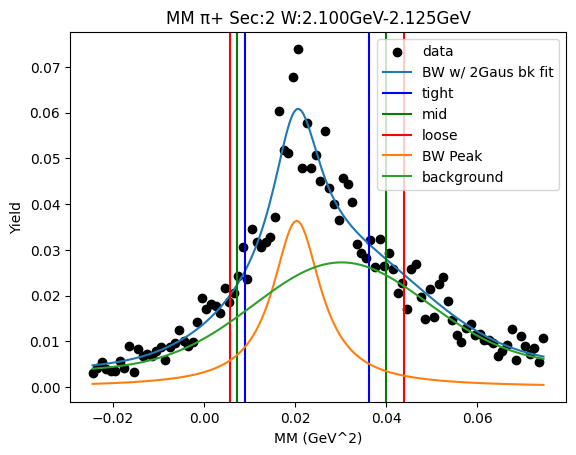

Value Error1.1
	Just skip it for now


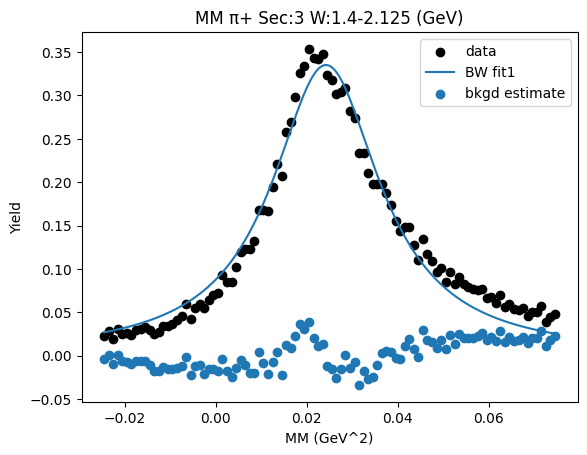

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.00026887 0.00043017 0.0006292 ]
 [0.00073089 0.00098459 0.00127601]]
Cut Bounds Err [[0.30799077 0.46748327 0.65960721]
 [0.50779546 0.70724889 0.93933377]]


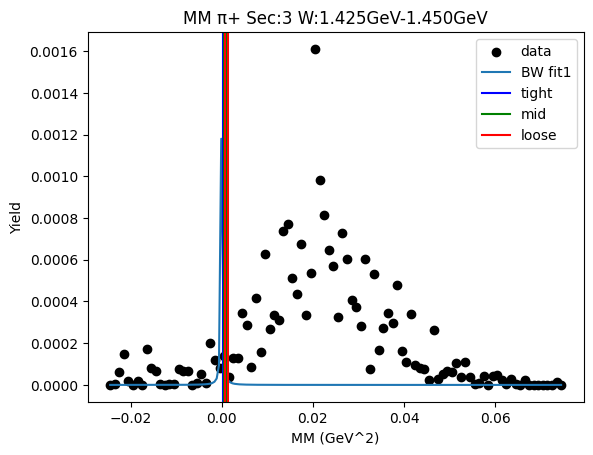

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[6.45818195e-05 1.06950616e-04 1.59949259e-04]
 [2.25535371e-04 3.00094878e-04 3.85284230e-04]]
Cut Bounds Err [[ 4.07473395  6.29240998  8.97766242]
 [ 7.61467638 10.54034089 13.93358182]]


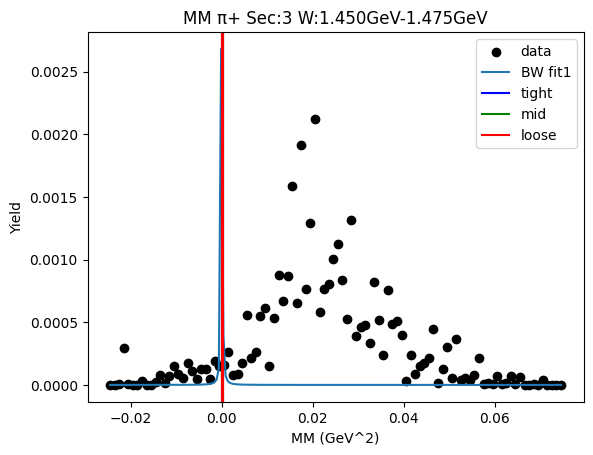

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.00095809 0.00094956 0.00094106]
 [0.00104551 0.00105447 0.00106346]]
Cut Bounds Err [[0.78548119 0.93837088 1.08985839]
 [0.82053574 0.98884943 1.15856531]]


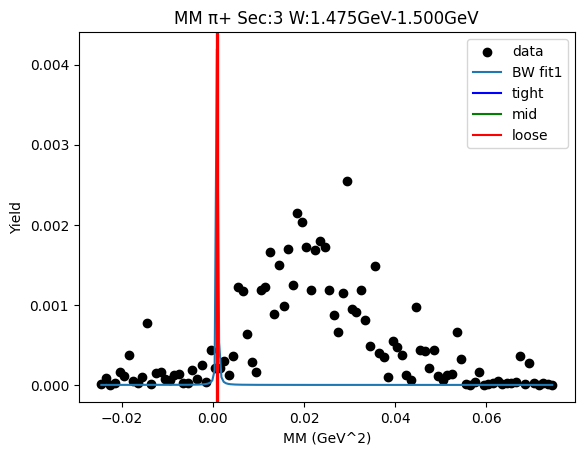

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.00023905 0.00034591 0.00047247]
 [0.00025325 0.00036295 0.00049234]]
Cut Bounds Err [[ 708851.0208905  1023234.3942654  1395155.49070591]
 [ 729592.05574956 1048123.63609628 1424192.9395086 ]]


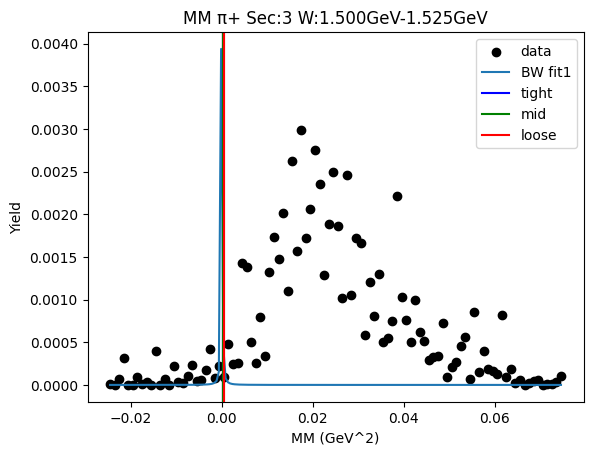

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.00640187 0.00423065 0.00250753]
 [0.05275932 0.05985959 0.06740796]]
Cut Bounds Err [[5.98886961e-06 5.83137890e-06 5.23179294e-06]
 [1.71925756e-05 2.19348361e-05 2.71258288e-05]]


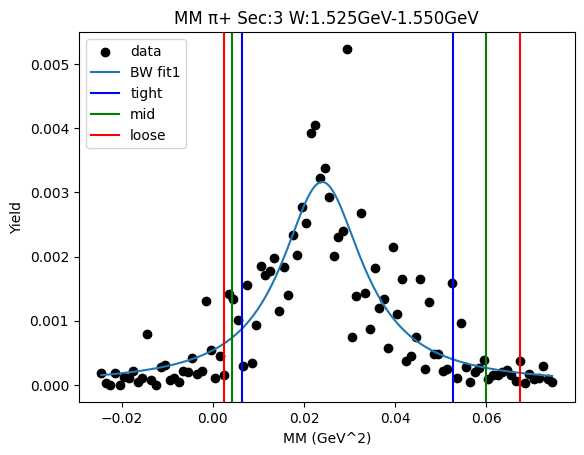

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.00329028 0.00160239 0.00051523]
 [0.05320957 0.06150554 0.07040224]]
Cut Bounds Err [[5.38134260e-06 4.49852257e-06 2.97282235e-06]
 [2.16406052e-05 2.78704163e-05 3.47505045e-05]]


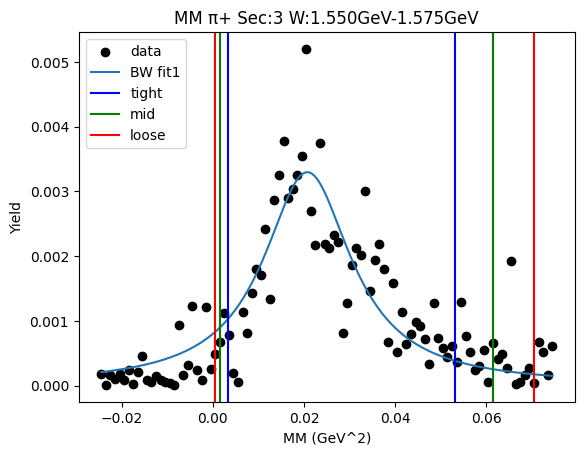

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.00607118 0.00401103 0.00237633]
 [0.05007227 0.05681234 0.06397787]]
Cut Bounds Err [[4.56491933e-06 4.44420532e-06 3.98635112e-06]
 [1.31097774e-05 1.67258226e-05 2.06841100e-05]]


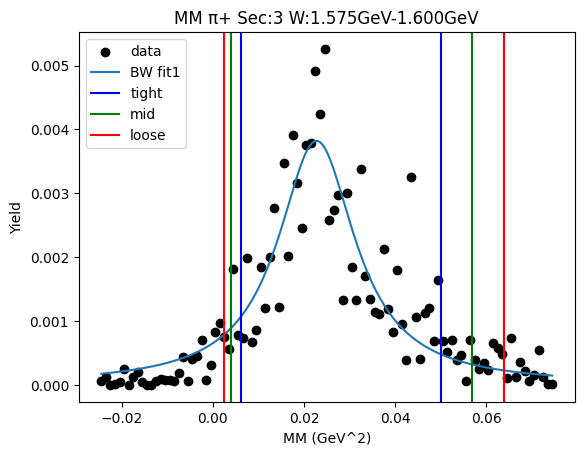

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.00343415 0.0014783  0.00033474]
 [0.06766809 0.07855902 0.09026224]]
Cut Bounds Err [[8.07178801e-06 6.34472354e-06 3.51883797e-06]
 [3.58304259e-05 4.62518391e-05 5.77831748e-05]]


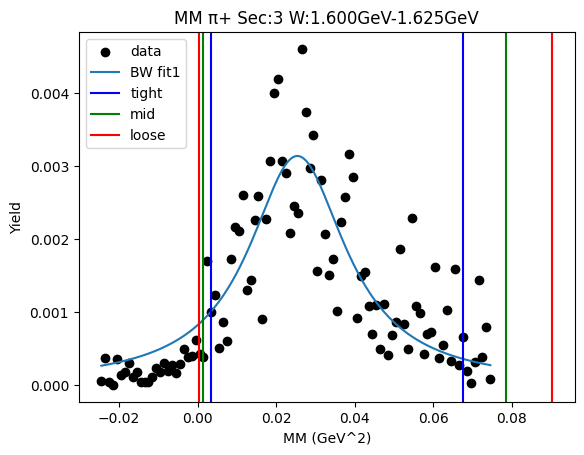

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.00041619 0.0006131  0.00084804]
 [0.00053828 0.00075961 0.00101896]]
Cut Bounds Err [[166.58216971 242.62203932 332.90305415]
 [189.44646084 270.05918867 364.91306172]]


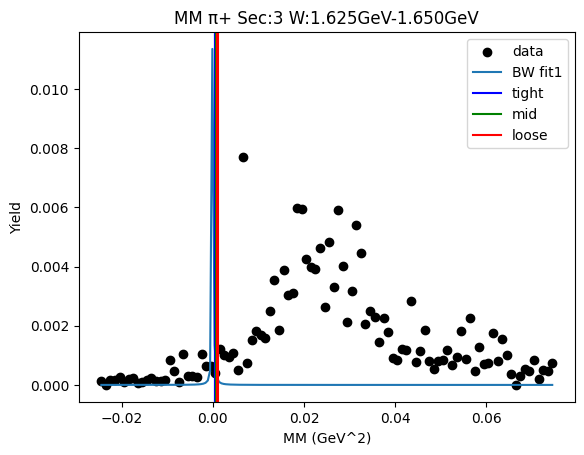

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.00661356 0.00452828 0.00283676]
 [0.04912266 0.0555392  0.0623495 ]]
Cut Bounds Err [[3.28295065e-06 3.25368363e-06 3.00103569e-06]
 [8.94721147e-06 1.13948415e-05 1.40694163e-05]]


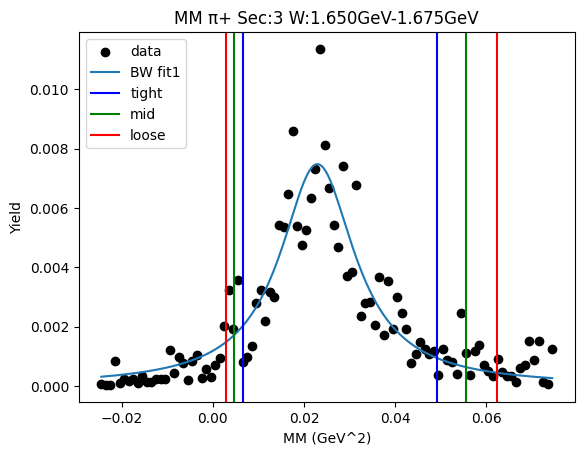

W bin: 11 1.675GeV-1.700GeV
Cut Bounds [[0.0038226  0.00200424 0.00076786]
 [0.05401506 0.06223519 0.07103731]]
Cut Bounds Err [[4.63340292e-06 4.01886292e-06 2.89900343e-06]
 [1.74171948e-05 2.23947593e-05 2.78837122e-05]]


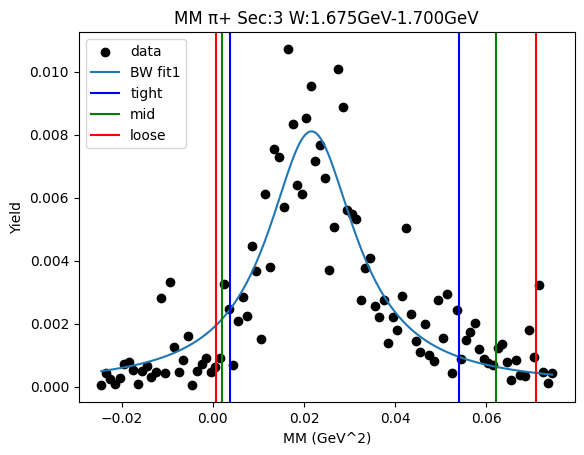

W bin: 12 1.700GeV-1.725GeV
Cut Bounds [[0.00484277 0.00276815 0.00126995]
 [0.05729251 0.06570783 0.07469958]]
Cut Bounds Err [[3.32760336e-06 3.01361374e-06 2.37884145e-06]
 [1.14454662e-05 1.46825557e-05 1.82444889e-05]]


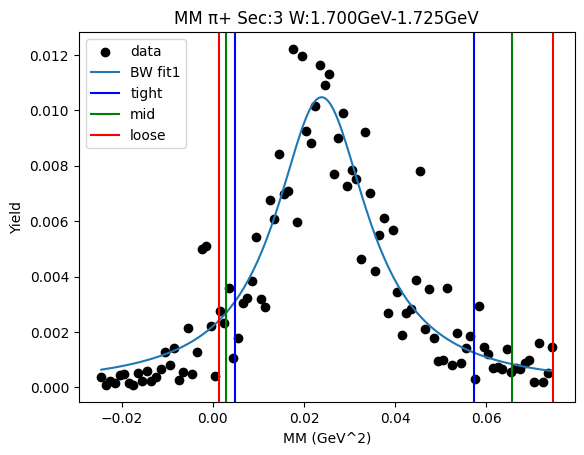

W bin: 13 1.725GeV-1.750GeV
Cut Bounds [[0.00607827 0.00383393 0.00210444]
 [0.05683864 0.06474638 0.07316897]]
Cut Bounds Err [[2.55877454e-06 2.43421411e-06 2.10172742e-06]
 [7.82463118e-06 1.00033270e-05 1.23928541e-05]]


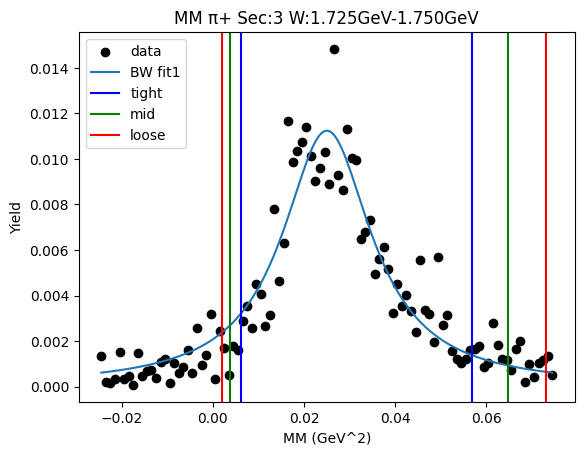

W bin: 14 1.750GeV-1.775GeV
Cut Bounds [[0.00683562 0.00455188 0.00273084]
 [0.05512147 0.0624949  0.07033104]]
Cut Bounds Err [[3.39962571e-06 3.32291379e-06 2.99940366e-06]
 [9.65389674e-06 1.23124951e-05 1.52216044e-05]]


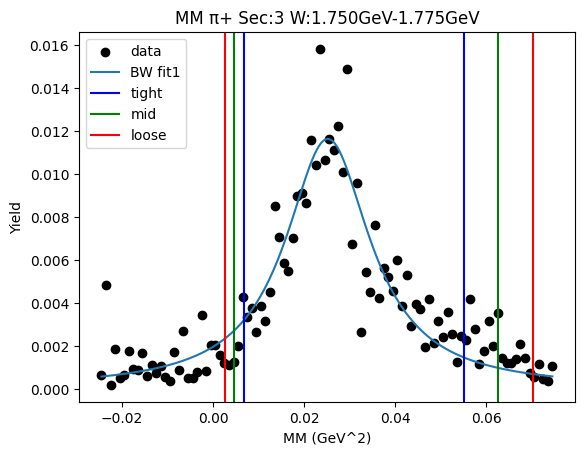

W bin: 15 1.775GeV-1.800GeV
Cut Bounds [[0.00382226 0.00179113 0.00052071]
 [0.06597238 0.07637127 0.08753087]]
Cut Bounds Err [[3.19379530e-06 2.61920242e-06 1.64593983e-06]
 [1.32686892e-05 1.71029139e-05 2.13400455e-05]]


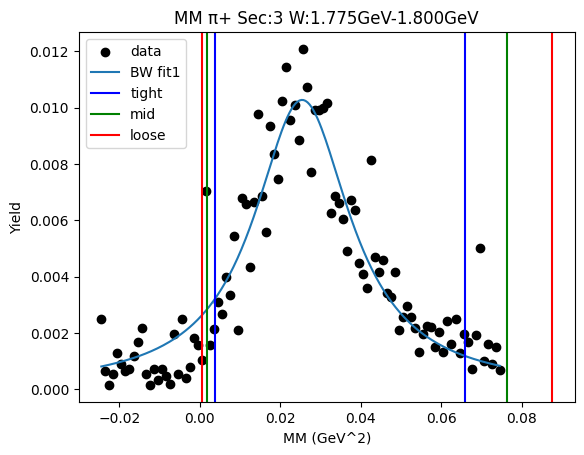

W bin: 16 1.800GeV-1.825GeV
Cut Bounds [[0.00398593 0.00202876 0.00072626]
 [0.05956507 0.06872371 0.07853704]]
Cut Bounds Err [[2.74522030e-06 2.34614528e-06 1.63597594e-06]
 [1.06122607e-05 1.36550449e-05 1.70125048e-05]]


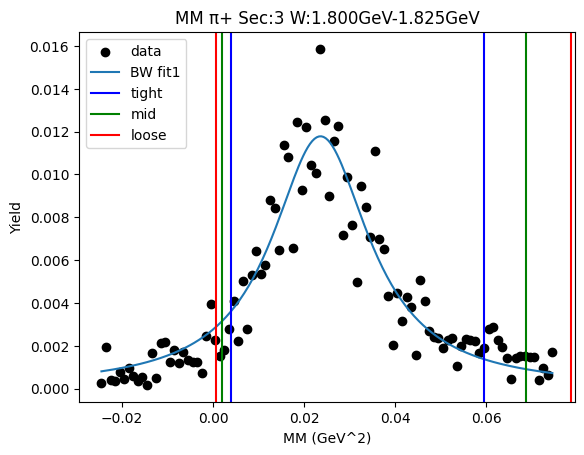

W bin: 17 1.825GeV-1.850GeV
Cut Bounds [[0.00311046 0.00125839 0.00023031]
 [0.06695095 0.07786698 0.089607  ]]
Cut Bounds Err [[4.05520469e-06 3.09015111e-06 1.54080892e-06]
 [1.88138989e-05 2.43079876e-05 3.03921400e-05]]


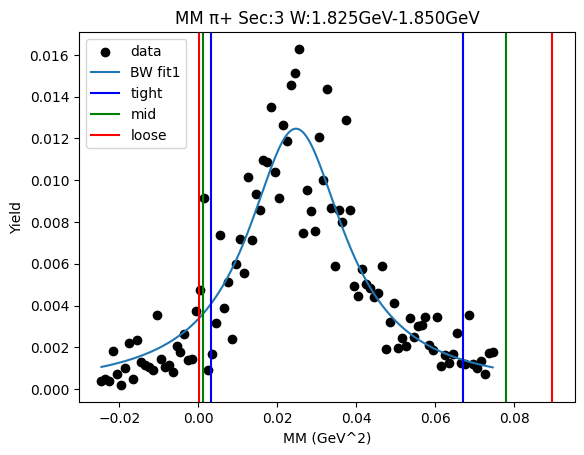

W bin: 18 1.850GeV-1.875GeV
Cut Bounds [[0.00371799 0.00169918 0.00046083]
 [0.06683123 0.07743507 0.08881937]]
Cut Bounds Err [[3.68804986e-06 2.98693631e-06 1.81296273e-06]
 [1.56362375e-05 2.01639124e-05 2.51693851e-05]]


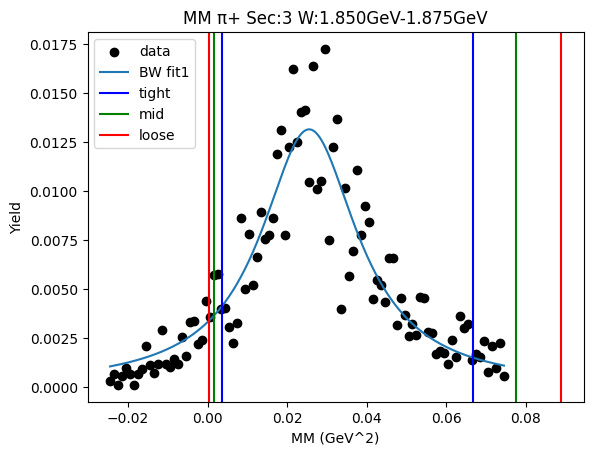

W bin: 19 1.875GeV-1.900GeV
Cut Bounds [[0.00376984 0.00172746 0.00047204]
 [0.06747592 0.07817476 0.08966056]]
Cut Bounds Err [[4.18065919e-06 3.39042204e-06 2.06563707e-06]
 [1.76871550e-05 2.28077644e-05 2.84684905e-05]]


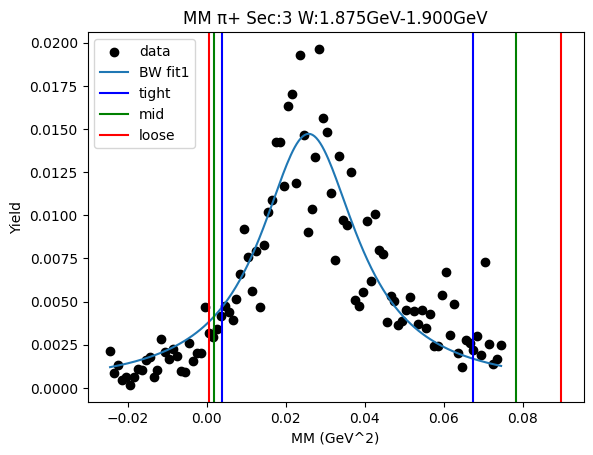

W bin: 20 1.900GeV-1.925GeV
background fit [4.49534329e-03 1.00000000e+00 6.00000000e-02 1.13885098e-03
 1.40000000e+00 2.00000000e-01]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0066624308171835435 0.03879853338106175
Breit-Wigner Peak [0.0019176  0.15076632 0.07318481]
Gaus2 [1.43001249 1.75359368 0.1251279 ]
Gaus3 [0.00289157 0.04920922 0.01298174]
Cut Bounds [[0.00531589 0.00328775 0.00174454]
 [0.05226825 0.05963058 0.06747784]]
Cut Bounds Err [[3.36172346e-06 3.13919084e-06 2.65058636e-06]
 [1.05412735e-05 1.33691235e-05 1.64847532e-05]]


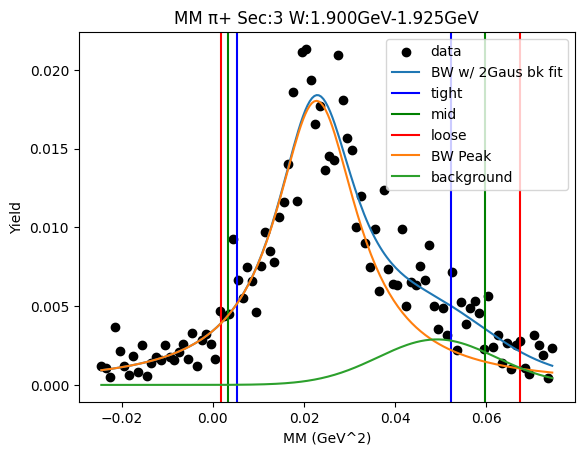

W bin: 21 1.925GeV-1.950GeV
background fit [1.40619429 1.88781505 0.17842585 0.00192425 0.0505802  0.00611237]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.007119788280778241 0.03573954352117163
Breit-Wigner Peak [0.00176669 0.14638875 0.06906489]
Gaus2 [2.01736227e+05 3.39706724e+00 5.46033369e-01]
Gaus3 [0.00431221 0.04190714 0.01002798]
Cut Bounds [[0.00531666 0.00338966 0.00189453]
 [0.04833932 0.05501684 0.06212624]]
Cut Bounds Err [[1.09397573e-05 1.04291481e-05 9.06840844e-06]
 [3.29866576e-05 4.20163650e-05 5.19300082e-05]]


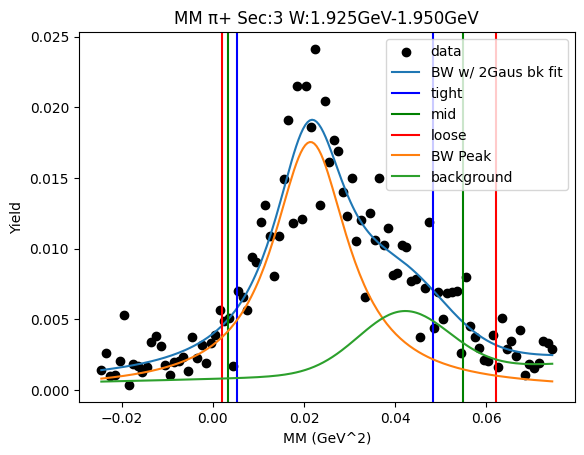

W bin: 22 1.950GeV-1.975GeV
background fit [2.02024743e+05 4.80097628e+02 5.69174866e+01 1.24336852e-03
 5.41237120e-02 9.45485044e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.001061804756261095 0.04309413962540841
Breit-Wigner Peak [0.00201793 0.14858658 0.0836982 ]
Gaus2 [2.02024782e+05 4.80098989e+02 5.63261743e+01]
Gaus3 [0.00498231 0.04186614 0.01749395]
Cut Bounds [[0.00354572 0.00174204 0.00057263]
 [0.0564667  0.06524722 0.074662  ]]
Cut Bounds Err [[3.54503498e-05 2.98107003e-05 1.99370839e-05]
 [1.41470067e-04 1.82441444e-04 2.27653580e-04]]


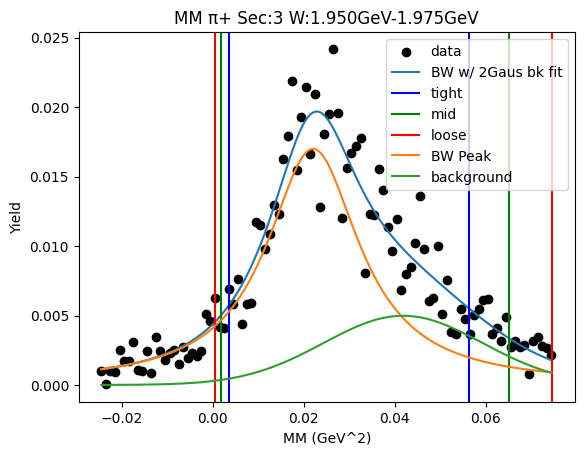

W bin: 23 1.975GeV-2.000GeV
background fit [1.99245974e+05 1.13562838e+03 1.35015630e+02 2.31849935e-03
 6.15068601e-02 8.46515101e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0034404523612674882 0.04374482673886905
Breit-Wigner Peak [0.00241691 0.15359896 0.08195972]
Gaus2 [117747.46938451   7894.39338965    635.72668579]
Gaus3 [0.00381414 0.05510608 0.01938812]
Cut Bounds [[0.00440999 0.00239801 0.00099422]
 [0.0579799  0.0666819  0.07599209]]
Cut Bounds Err [[5.07341476e-06 4.45706500e-06 3.33346777e-06]
 [1.83958652e-05 2.35032025e-05 2.91433003e-05]]


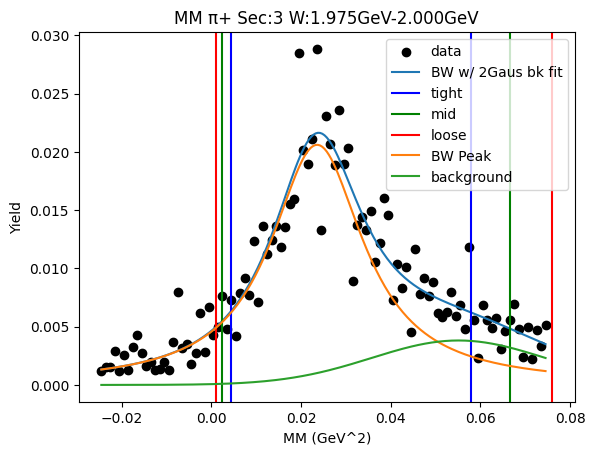

W bin: 24 2.000GeV-2.025GeV
background fit [1.17747469e+05 5.45219271e+04 1.70330451e+03 1.64194621e-03
 6.14907828e-02 1.08272375e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.010435165600997904 0.03305352593530128
Breit-Wigner Peak [0.00138589 0.14745964 0.0613981 ]
Gaus2 [135236.23840418  25327.13609994   4131.55362322]
Gaus3 [0.00776395 0.0324549  0.02060696]
Cut Bounds [[0.00674739 0.00477192 0.00313775]
 [0.04527395 0.05100379 0.05707494]]
Cut Bounds Err [[5.42079548e-05 5.47006399e-05 5.17468244e-05]
 [1.40416857e-04 1.78832750e-04 2.20697270e-04]]


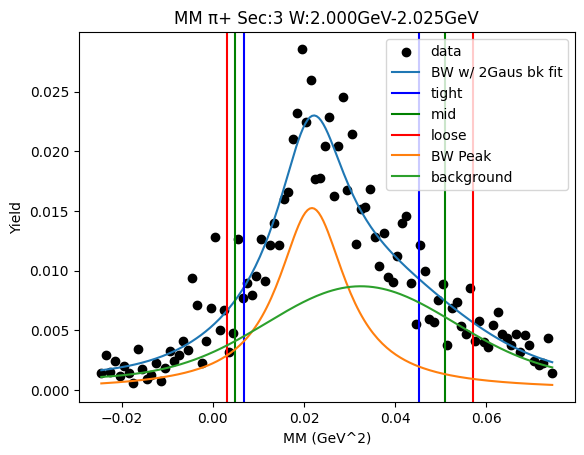

W bin: 25 2.025GeV-2.050GeV
background fit [8.17067915e+04 1.71867876e+04 1.44181341e+02 2.23641473e-03
 6.03473806e-02 7.60620076e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.004931000227704541 0.0408331438398943
Breit-Wigner Peak [0.00267687 0.15126821 0.07735432]
Gaus2 [1037619.51888522  236041.18624917   12364.19456917]
Gaus3 [0.00299785 0.05228605 0.03127476]
Cut Bounds [[0.00475774 0.00275814 0.0013003 ]
 [0.05455029 0.0625092  0.07100987]]
Cut Bounds Err [[1.30441924e-05 1.19171910e-05 9.54584394e-06]
 [4.41687711e-05 5.67332355e-05 7.05427116e-05]]


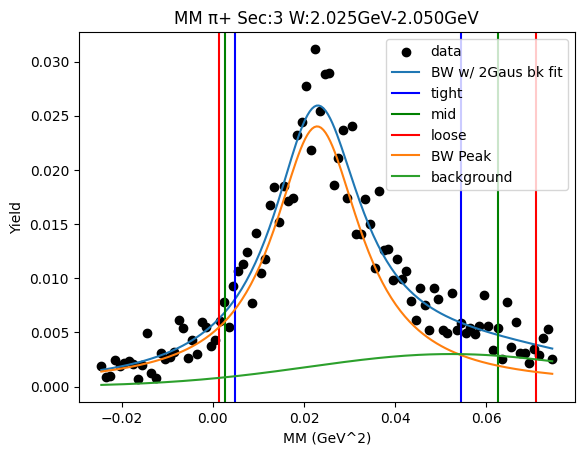

W bin: 26 2.050GeV-2.075GeV
background fit [1.03761952e+06 2.26620590e+05 1.79128323e+04 6.55453164e-03
 9.90549811e-02 2.43091189e-02]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.000893623804087789 0.04696023060394827
Breit-Wigner Peak [0.00337788 0.15176727 0.08930645]
Gaus2 [1037619.51888522  226620.59030953   17912.83230198]
Gaus3 [0.00492512 0.09893583 0.02975514]
Cut Bounds [[0.00322174 0.00142574 0.00035185]
 [0.06089747 0.07063662 0.08109787]]
Cut Bounds Err [[2.65751725e-06 2.11324062e-06 1.22188945e-06]
 [1.15539438e-05 1.48745236e-05 1.85506031e-05]]


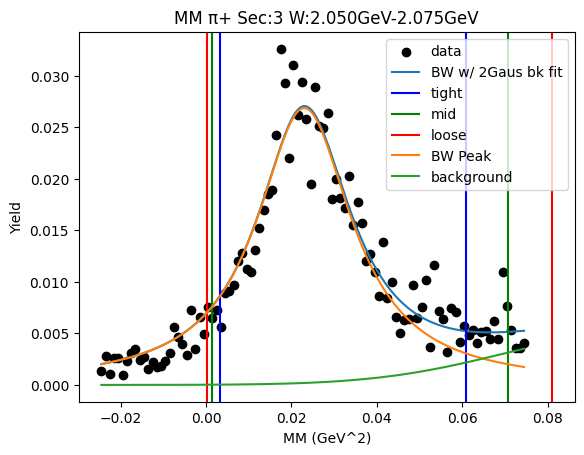

W bin: 27 2.075GeV-2.100GeV
background fit [1.03759502e+06 2.16938852e+05 2.25182894e+04 2.64287056e-03
 5.91269472e-02 9.01322345e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0022979588289611386 0.040318322046191894
Breit-Wigner Peak [0.00294152 0.14597308 0.07960356]
Gaus2 [826107.68848412 217351.39281273  21982.071915  ]
Gaus3 [0.00518644 0.04610669 0.02265528]
Cut Bounds [[0.00375627 0.00196706 0.00075156]
 [0.05320298 0.06130311 0.06997696]]
Cut Bounds Err [[4.35741297e-05 3.78380778e-05 2.72861706e-05]
 [1.63990298e-04 2.11233063e-04 2.63292484e-04]]


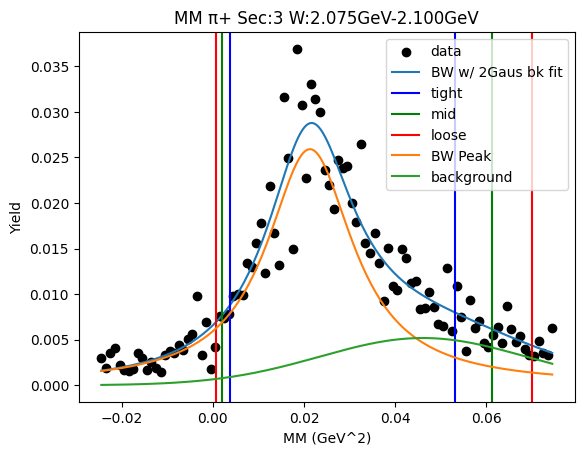

W bin: 28 2.100GeV-2.125GeV
background fit [5.99738645e+05 4.61126711e+05 2.88534370e+04 1.52260770e-03
 6.16962778e-02 9.68293840e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.005064066769723711 0.05060494191586144
Breit-Wigner Peak [0.00338934 0.15089877 0.09632325]
Gaus2 [ 74006.98213642 535108.65973994   8332.65620139]
Gaus3 [0.00367488 0.06639075 0.0343453 ]
Cut Bounds [[2.34519617e-03 7.80247875e-04 5.53329085e-05]
 [6.41965122e-02 7.50018271e-02 8.66471753e-02]]
Cut Bounds Err [[5.50383499e-05 3.80946565e-05 1.18353389e-05]
 [2.87959581e-04 3.73494049e-04 4.68345285e-04]]


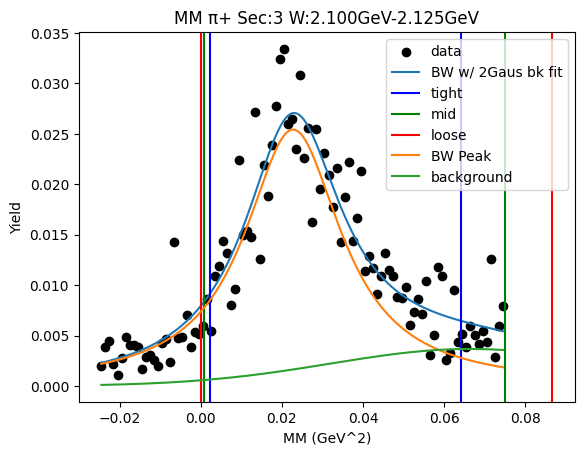

Value Error1.1
	Just skip it for now


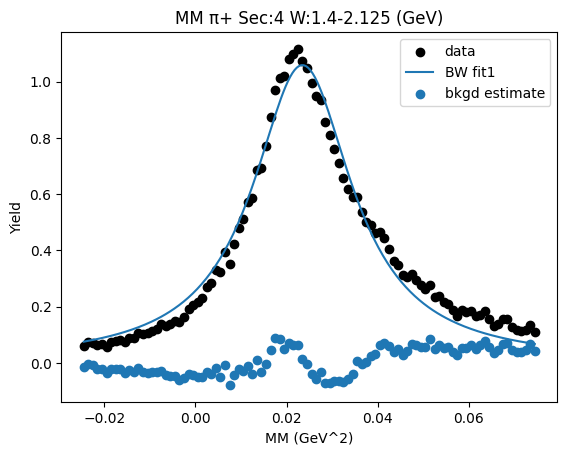

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.00422175 0.00237639 0.00105764]
 [0.0516394  0.05927757 0.06744236]]
Cut Bounds Err [[1.92363809e-06 1.72873896e-06 1.34403486e-06]
 [6.72771778e-06 8.63408241e-06 1.07326750e-05]]


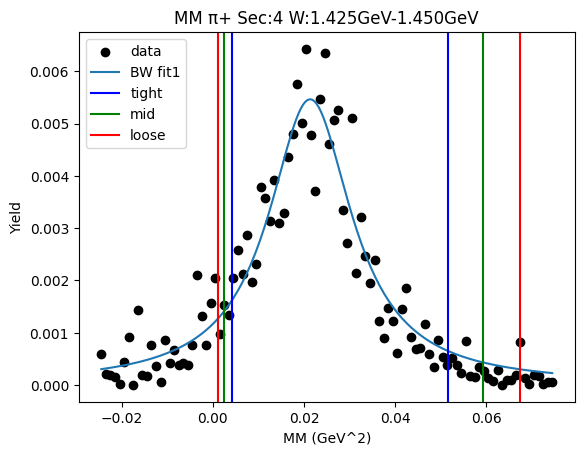

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.00440958 0.00251414 0.00114771]
 [0.05245887 0.06017329 0.0684167 ]]
Cut Bounds Err [[1.55937126e-06 1.41039444e-06 1.11053416e-06]
 [5.37848941e-06 6.89997260e-06 8.57428044e-06]]


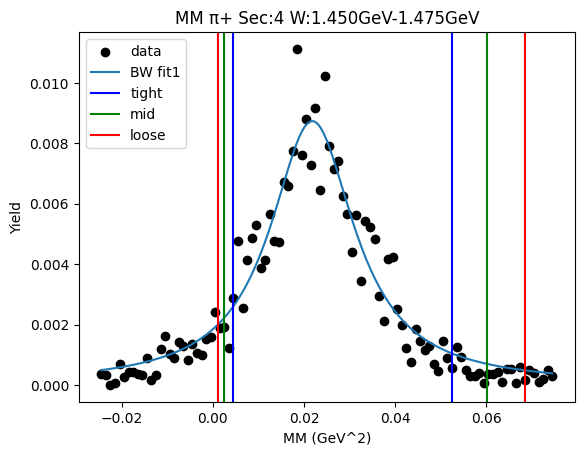

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.00550608 0.00358064 0.00206788]
 [0.04745783 0.05392273 0.06080032]]
Cut Bounds Err [[1.79853793e-06 1.73717864e-06 1.53843910e-06]
 [5.28022138e-06 6.74139787e-06 8.34200716e-06]]


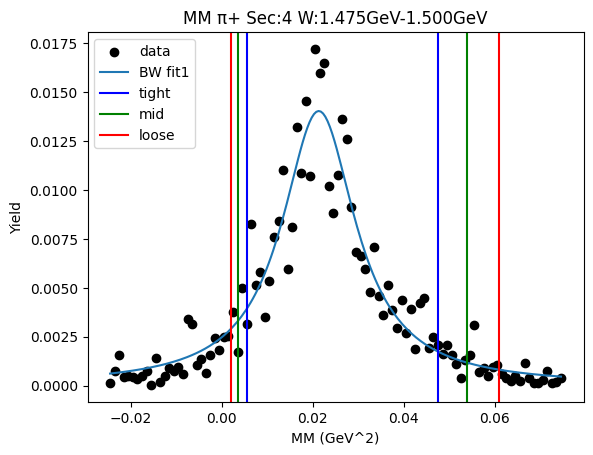

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.00674324 0.00475297 0.00310989]
 [0.04574112 0.05155043 0.05770692]]
Cut Bounds Err [[9.56344328e-07 9.61639671e-07 9.06454333e-07]
 [2.49076806e-06 3.16698400e-06 3.90469950e-06]]


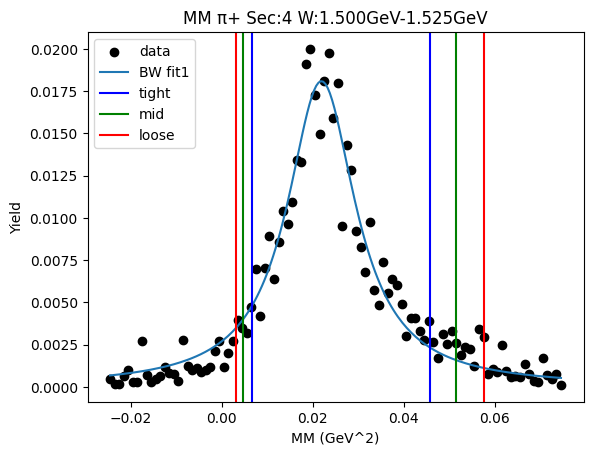

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.00538861 0.00336539 0.00181619]
 [0.05169209 0.05892956 0.06664106]]
Cut Bounds Err [[1.81890659e-06 1.72175442e-06 1.47400040e-06]
 [5.63357228e-06 7.20476651e-06 8.92868234e-06]]


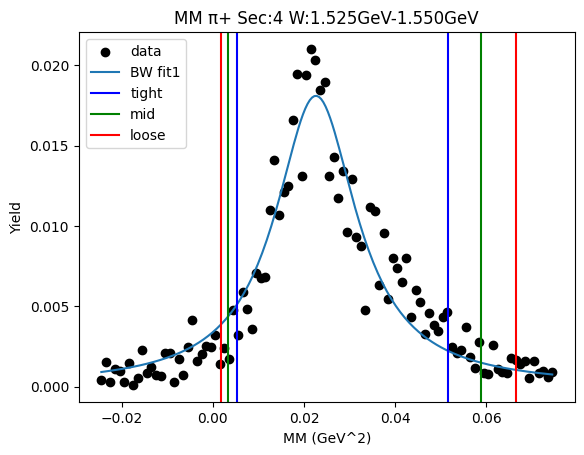

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.00504064 0.0029758  0.00145194]
 [0.05544295 0.06345857 0.07201517]]
Cut Bounds Err [[1.66163116e-06 1.52929973e-06 1.24491174e-06]
 [5.51080524e-06 7.06213669e-06 8.76752026e-06]]


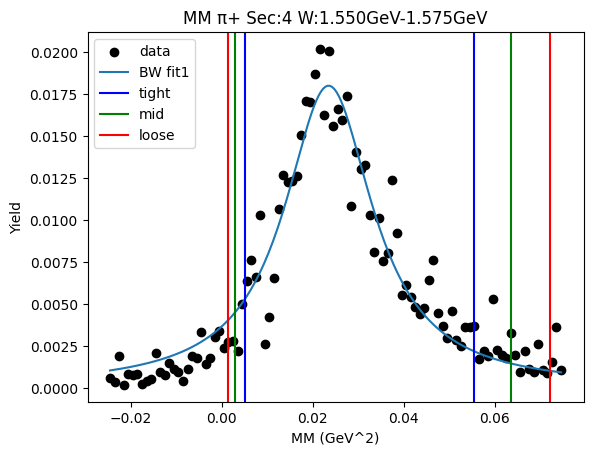

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.00528099 0.00317036 0.00159533]
 [0.05584454 0.06384663 0.07238431]]
Cut Bounds Err [[1.99650570e-06 1.85295896e-06 1.53182689e-06]
 [6.49237228e-06 8.31534466e-06 1.03182668e-05]]


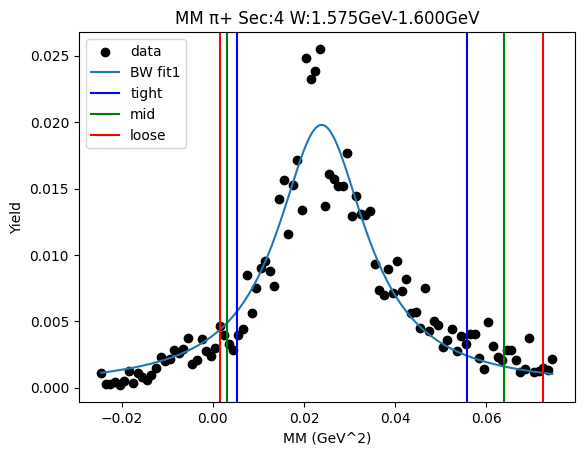

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.00537924 0.00330197 0.00172908]
 [0.05389303 0.06151852 0.06964839]]
Cut Bounds Err [[1.76268593e-06 1.65421012e-06 1.39501855e-06]
 [5.57931318e-06 7.14014554e-06 8.85376068e-06]]


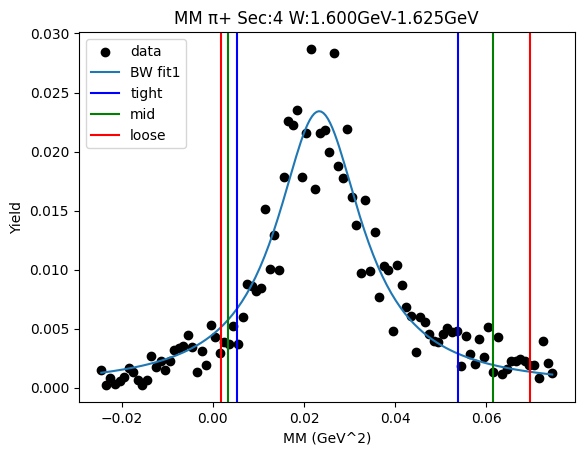

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.00467796 0.00268737 0.00124496]
 [0.05473421 0.06275487 0.07132371]]
Cut Bounds Err [[2.65155804e-06 2.40733547e-06 1.90952719e-06]
 [9.06989806e-06 1.16331380e-05 1.44532202e-05]]


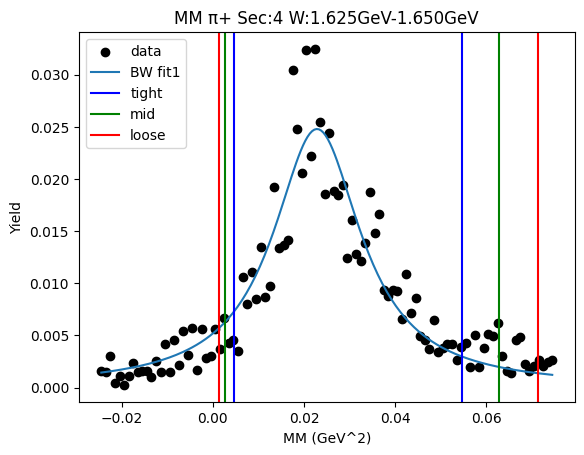

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.00379541 0.00197547 0.0007445 ]
 [0.05438835 0.062687   0.07157462]]
Cut Bounds Err [[2.16159146e-06 1.86805175e-06 1.33649602e-06]
 [8.18271590e-06 1.05230746e-05 1.31042898e-05]]


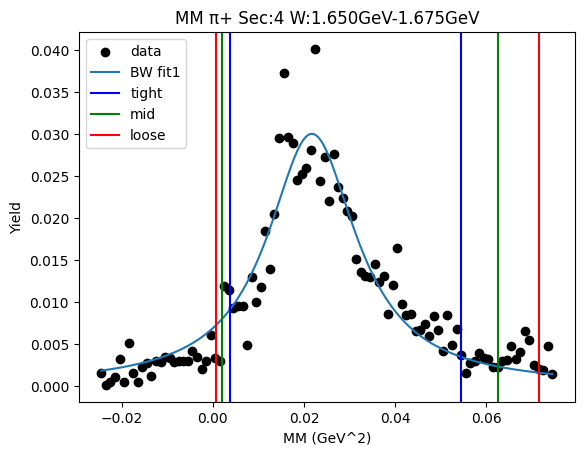

W bin: 11 1.675GeV-1.700GeV
Cut Bounds [[0.00547438 0.00341795 0.00184363]
 [0.05255413 0.05991366 0.06775528]]
Cut Bounds Err [[1.39935366e-06 1.32442350e-06 1.13356095e-06]
 [4.33574291e-06 5.54506681e-06 6.87194969e-06]]


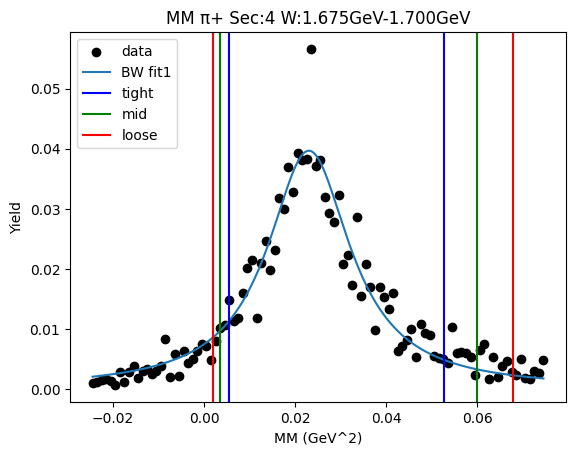

W bin: 12 1.700GeV-1.725GeV
Cut Bounds [[0.00538898 0.00333916 0.00177757]
 [0.05273992 0.06016029 0.06806889]]
Cut Bounds Err [[1.51047464e-06 1.42417748e-06 1.21094549e-06]
 [4.72530417e-06 6.04505531e-06 7.49350654e-06]]


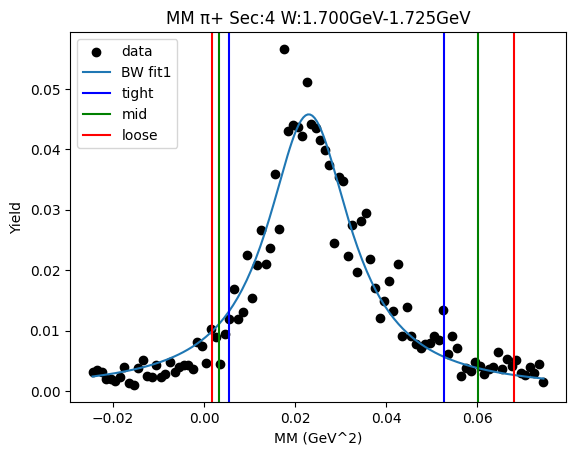

W bin: 13 1.725GeV-1.750GeV
Cut Bounds [[0.00536152 0.00327778 0.00170416]
 [0.05425502 0.06194998 0.07015506]]
Cut Bounds Err [[1.54185890e-06 1.44404941e-06 1.21343362e-06]
 [4.90479307e-06 6.27787369e-06 7.78557203e-06]]


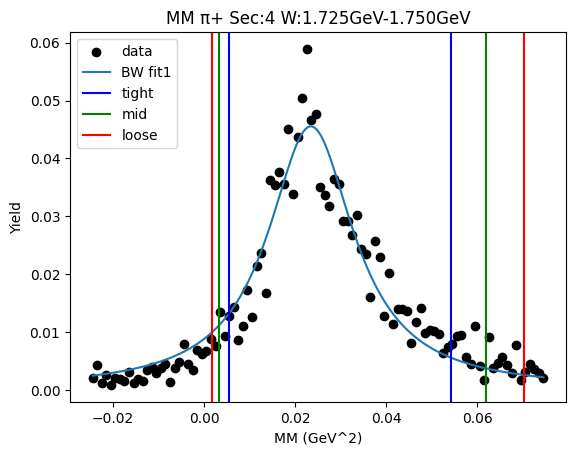

W bin: 14 1.750GeV-1.775GeV
Cut Bounds [[0.00512029 0.00304405 0.00150463]
 [0.05540823 0.06338957 0.07190774]]
Cut Bounds Err [[1.97375960e-06 1.82293309e-06 1.49359581e-06]
 [6.49282897e-06 8.31866921e-06 1.03253787e-05]]


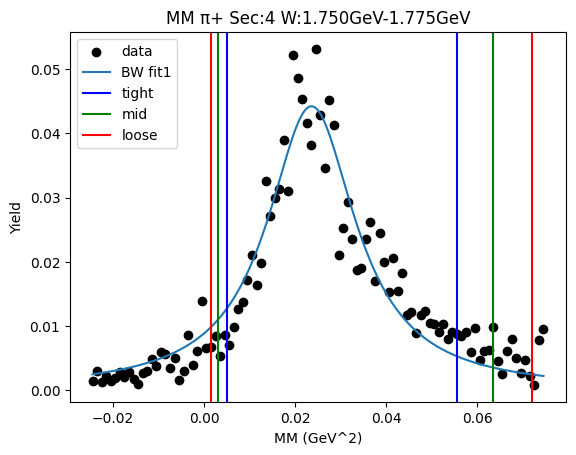

W bin: 15 1.775GeV-1.800GeV
Cut Bounds [[0.00438254 0.00238904 0.0009957 ]
 [0.05732694 0.06592231 0.07511786]]
Cut Bounds Err [[1.31388896e-06 1.16203965e-06 8.74294324e-07]
 [4.75198677e-06 6.10415907e-06 7.59388365e-06]]


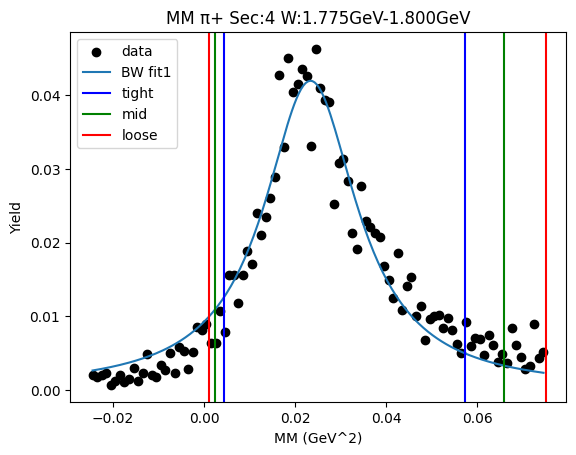

W bin: 16 1.800GeV-1.825GeV
Cut Bounds [[0.00436699 0.00234205 0.00094288]
 [0.05903313 0.06794142 0.07747548]]
Cut Bounds Err [[1.56895279e-06 1.37637992e-06 1.01778322e-06]
 [5.76855126e-06 7.41322427e-06 9.22590595e-06]]


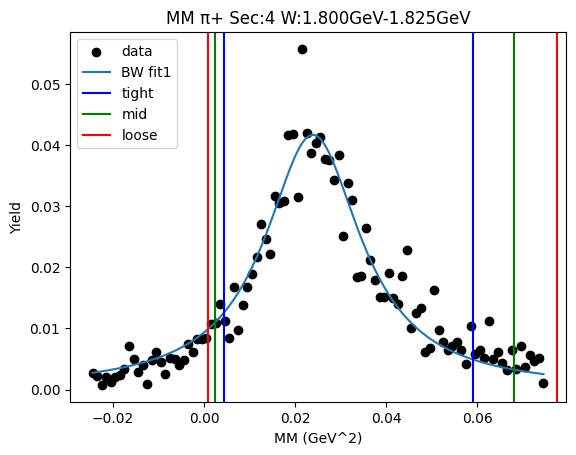

W bin: 17 1.825GeV-1.850GeV
Cut Bounds [[0.00384702 0.00182361 0.00054677]
 [0.0651429  0.07537865 0.08636099]]
Cut Bounds Err [[1.46794870e-06 1.21078798e-06 7.72699628e-07]
 [6.04062560e-06 7.78442552e-06 9.71109668e-06]]


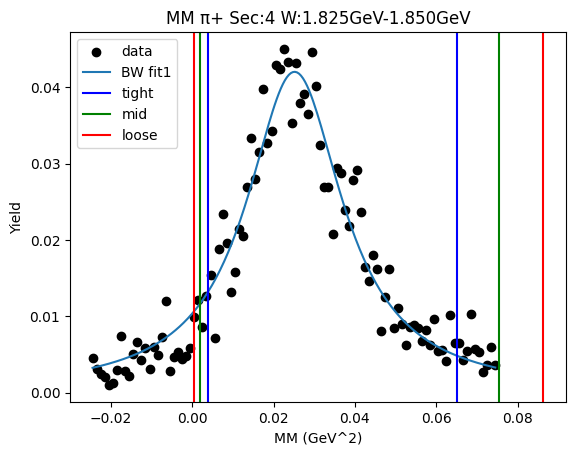

W bin: 18 1.850GeV-1.875GeV
Cut Bounds [[0.00330758 0.00144873 0.00034644]
 [0.06350663 0.07368759 0.0846251 ]]
Cut Bounds Err [[1.45775938e-06 1.15578791e-06 6.58724361e-07]
 [6.38763572e-06 8.24292521e-06 1.02953387e-05]]


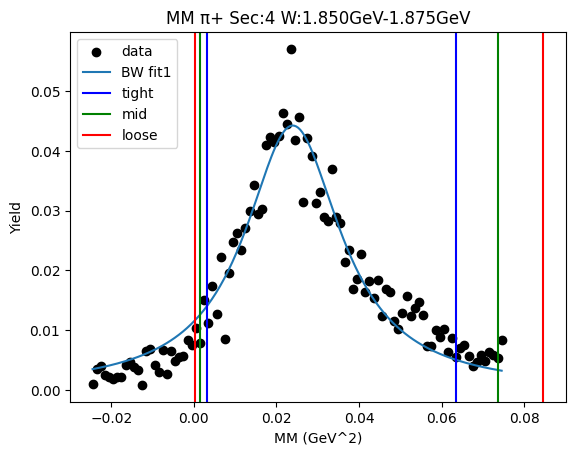

W bin: 19 1.875GeV-1.900GeV
Cut Bounds [[0.00388231 0.00189818 0.00061643]
 [0.06235459 0.07206492 0.08247762]]
Cut Bounds Err [[1.51959271e-06 1.27289286e-06 8.45404938e-07]
 [6.08998368e-06 7.84304764e-06 9.77890435e-06]]


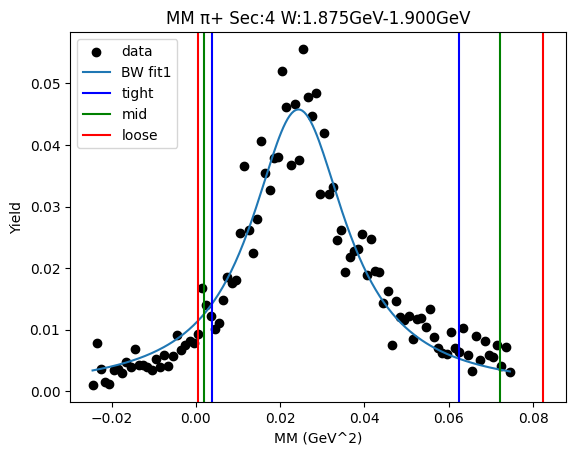

W bin: 20 1.900GeV-1.925GeV
background fit [0.00923006 1.         0.06       0.00351956 1.4        0.2       ]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.010345542307011131 0.031971478644794854
Breit-Wigner Peak [0.00322246 0.14545965 0.06003601]
Gaus2 [0.00665746 0.07425098 0.06435728]
Gaus3 [0.0135571  0.03       0.01361019]
Cut Bounds [[0.00665718 0.00473591 0.00314097]
 [0.04381811 0.04932902 0.05516626]]
Cut Bounds Err [[8.51707858e-05 8.62020089e-05 8.19006806e-05]
 [2.18510470e-04 2.78206317e-04 3.43235907e-04]]


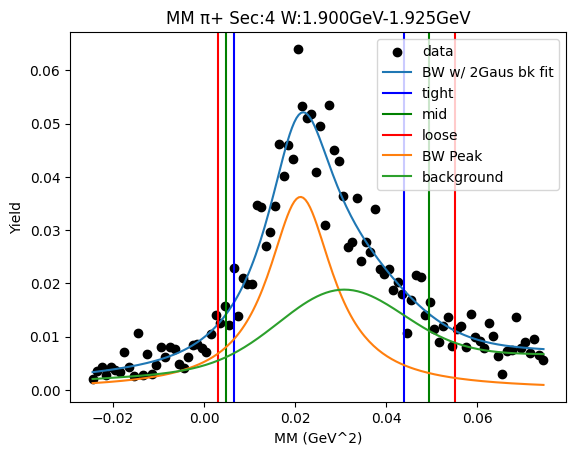

W bin: 21 1.925GeV-1.950GeV
background fit [0.002629   0.05796429 0.00925883 0.01319357 0.05148078 0.00016659]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.010234354022779973 0.03444439252729514
Breit-Wigner Peak [0.00357996 0.14946362 0.0635217 ]
Gaus2 [0.01532348 0.0318145  0.02476597]
Gaus3 [1.31574760e-02 5.15386538e-02 8.26081880e-05]
Cut Bounds [[0.00670554 0.00467474 0.00300927]
 [0.04710632 0.05315568 0.05957036]]
Cut Bounds Err [[1.90104669e-05 1.90457981e-05 1.78268901e-05]
 [5.03866615e-05 6.42236782e-05 7.93158529e-05]]


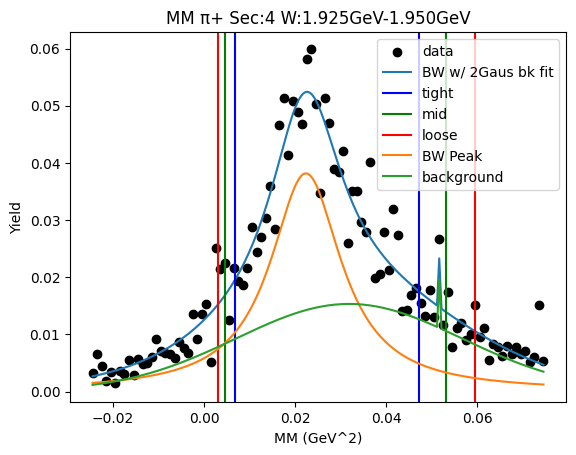

W bin: 22 1.950GeV-1.975GeV
background fit [4.08237257e-03 7.34929914e-02 1.17362334e-02 1.31072229e-02
 5.16301178e-02 8.99160190e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0004610925182559171 0.04817837978890148
Breit-Wigner Peak [0.00656516 0.15594786 0.08917893]
Gaus2 [0.00374728 0.06595779 0.02265307]
Gaus3 [1.31072200e-02 5.16340381e-02 8.77902727e-05]
Cut Bounds [[0.00373036 0.00177261 0.00053491]
 [0.0629102  0.07278843 0.08338669]]
Cut Bounds Err [[2.43798769e-06 2.00125816e-06 1.27656938e-06]
 [1.00119056e-05 1.28241086e-05 1.59386406e-05]]


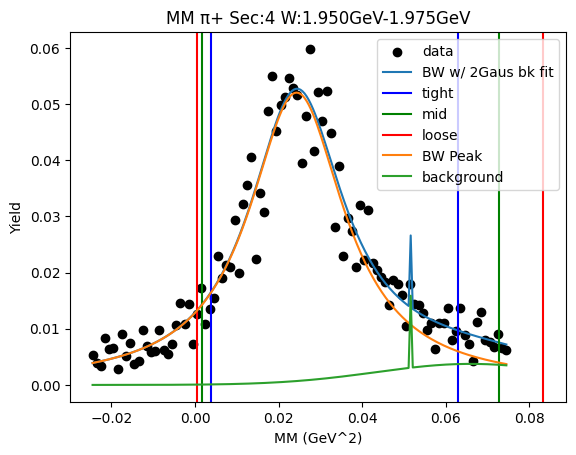

W bin: 23 1.975GeV-2.000GeV
background fit [4.20845723e-03 6.26473290e-02 1.09279116e-02 1.65134270e-01
 9.15707237e-02 4.59848571e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.008901347548381199 0.035125331621339524
Breit-Wigner Peak [0.00419079 0.14836893 0.066111  ]
Gaus2 [0.01312165 0.03452031 0.0276182 ]
Gaus3 [1.65134270e-01 9.15707237e-02 4.59848571e-05]
Cut Bounds [[0.00608994 0.00409241 0.00249058]
 [0.04782959 0.05417999 0.06092609]]
Cut Bounds Err [[1.04316464e-05 1.02606017e-05 9.33800840e-06]
 [2.92344290e-05 3.73338642e-05 4.61854743e-05]]


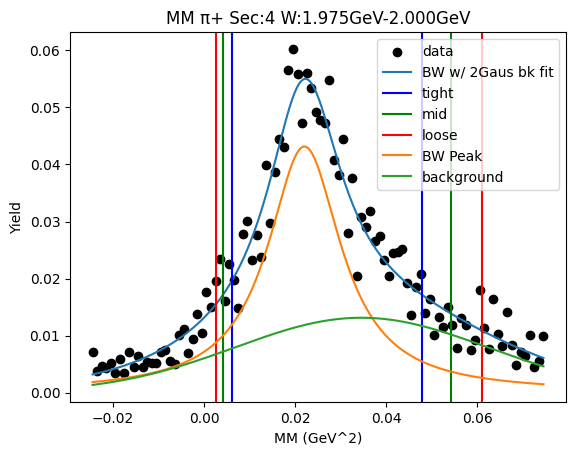

W bin: 24 2.000GeV-2.025GeV
background fit [4.81048492e-03 5.95436522e-02 1.15553686e-02 1.65134270e-01
 9.15707237e-02 4.59848571e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.005734743842023427 0.03746405603147257
Breit-Wigner Peak [0.00508247 0.14696734 0.07272014]
Gaus2 [0.01219798 0.04024043 0.02391891]
Gaus3 [1.65134270e-01 9.15707237e-02 4.59848571e-05]
Cut Bounds [[0.00484492 0.00293039 0.00149465]
 [0.05032359 0.05750479 0.06516478]]
Cut Bounds Err [[2.09684729e-05 1.95680793e-05 1.63038624e-05]
 [6.75785841e-05 8.66836385e-05 1.07653133e-04]]


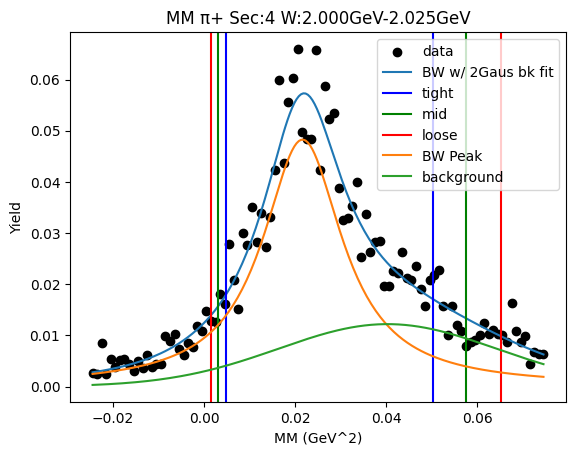

W bin: 25 2.025GeV-2.050GeV
background fit [3.94623015e-03 5.71795336e-02 1.21564956e-02 1.65134270e-01
 9.15707237e-02 4.59848571e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.00555981883798826 0.03747756810065338
Breit-Wigner Peak [0.00549187 0.14669251 0.07293576]
Gaus2 [0.01088667 0.04193282 0.02032199]
Gaus3 [1.65134270e-01 9.15707237e-02 4.59848571e-05]
Cut Bounds [[0.00477499 0.00287114 0.00144893]
 [0.0503032  0.057505   0.06518842]]
Cut Bounds Err [[2.53622548e-05 2.35991675e-05 1.95583117e-05]
 [8.23189013e-05 1.05614164e-04 1.31187722e-04]]


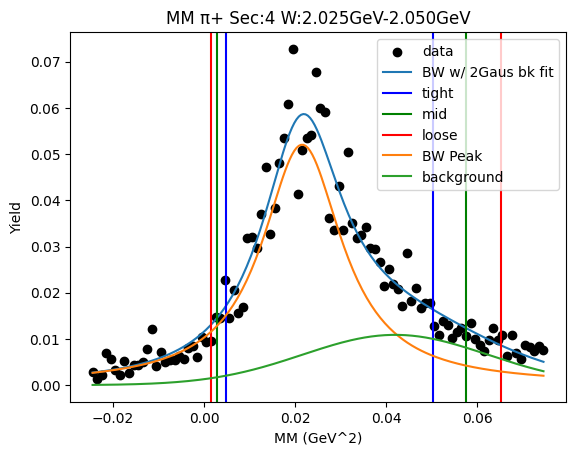

W bin: 26 2.050GeV-2.075GeV
background fit [5.66626588e-03 6.07408506e-02 1.01113759e-02 1.65134270e-01
 9.15707237e-02 4.59848571e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.004329278427491538 0.040045617540792
Breit-Wigner Peak [0.00593381 0.14895452 0.07715389]
Gaus2 [0.01119133 0.04440255 0.02152966]
Gaus3 [1.65134270e-01 9.15707237e-02 4.59848571e-05]
Cut Bounds [[0.00447239 0.00254623 0.00115903]
 [0.05337631 0.06123093 0.06962451]]
Cut Bounds Err [[1.93576359e-05 1.75266781e-05 1.37954588e-05]
 [6.68739360e-05 8.59480852e-05 1.06922901e-04]]


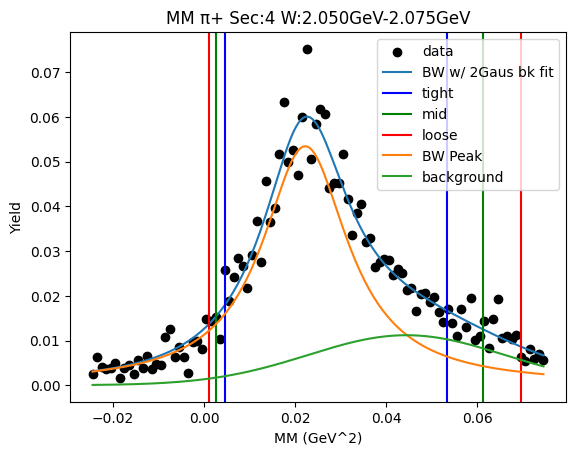

W bin: 27 2.075GeV-2.100GeV
background fit [3.14299773e-03 5.55435214e-02 1.01166543e-02 1.65134270e-01
 9.15707237e-02 4.59848571e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.0021571874302000783 0.0441480674123364
Breit-Wigner Peak [0.00575363 0.14489803 0.08784954]
Gaus2 [0.01380964 0.0380986  0.01954437]
Gaus3 [1.65134270e-01 9.15707237e-02 4.59848571e-05]
Cut Bounds [[0.00264618 0.00107254 0.00019764]
 [0.0568131  0.06607285 0.07603132]]
Cut Bounds Err [[1.85669142e-05 1.41824266e-05 7.10202138e-06]
 [8.60308055e-05 1.11315339e-04 1.39298320e-04]]


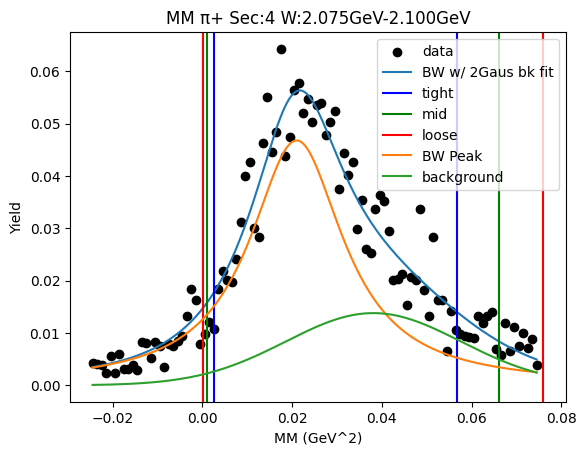

W bin: 28 2.100GeV-2.125GeV
background fit [5.63400462e-03 5.75607617e-02 1.14714154e-02 1.65134270e-01
 9.15707237e-02 4.59848571e-05]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.013060036811017653 0.029509876643825775
Breit-Wigner Peak [0.0043921  0.14589365 0.05236067]
Gaus2 [0.01781449 0.03265661 0.02616536]
Gaus3 [1.65134270e-01 9.15707237e-02 4.59848571e-05]
Cut Bounds [[0.00813438 0.00624894 0.00461172]
 [0.04064115 0.04525706 0.05012119]]
Cut Bounds Err [[5.86427183e-06 6.16684883e-06 6.18008616e-06]
 [1.31079505e-05 1.65959942e-05 2.03738739e-05]]


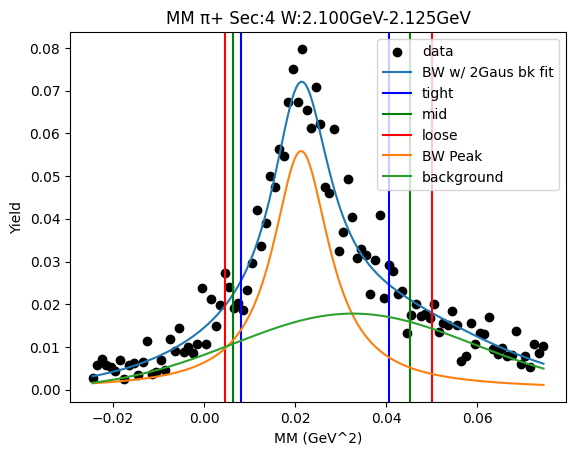

Value Error1.1
	Just skip it for now


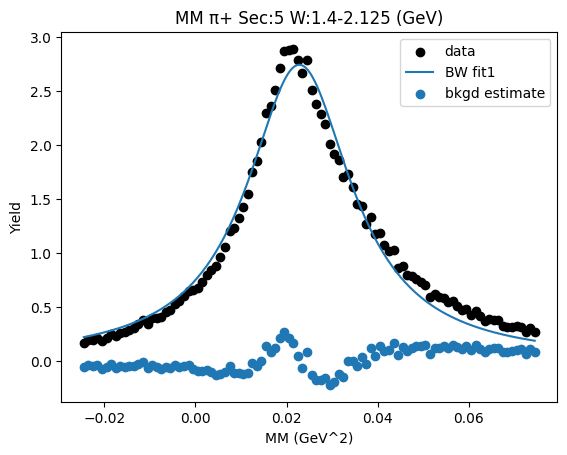

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.00230404 0.00092181 0.00016185]
 [0.05035159 0.05857887 0.06742842]]
Cut Bounds Err [[4.72684513e-07 3.58149327e-07 1.74900041e-07]
 [2.20969898e-06 2.85505553e-06 3.56985502e-06]]


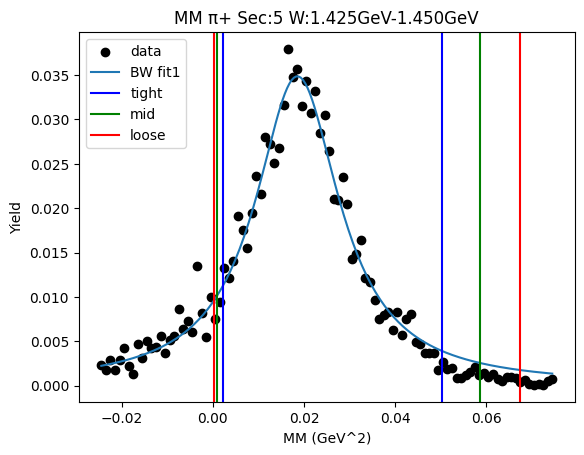

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.00232509 0.0008845  0.00012684]
 [0.05429099 0.06324359 0.0728791 ]]
Cut Bounds Err [[4.70172617e-07 3.47391817e-07 1.53314385e-07]
 [2.27196559e-06 2.93749894e-06 3.67506040e-06]]


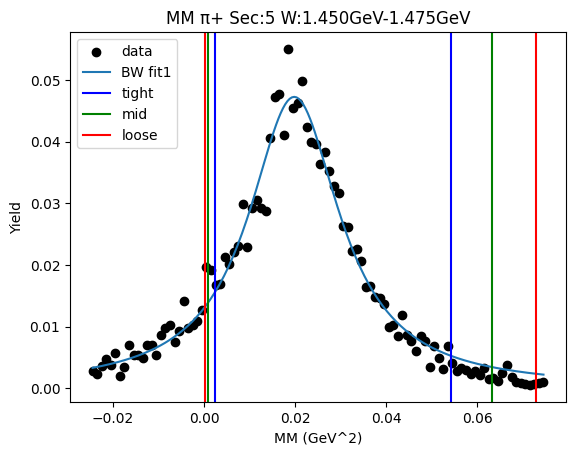

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.00328345 0.00161928 0.00053727]
 [0.0519445  0.06001253 0.06866273]]
Cut Bounds Err [[3.29059585e-07 2.76806838e-07 1.85819148e-07]
 [1.30881701e-06 1.68514531e-06 2.10065955e-06]]


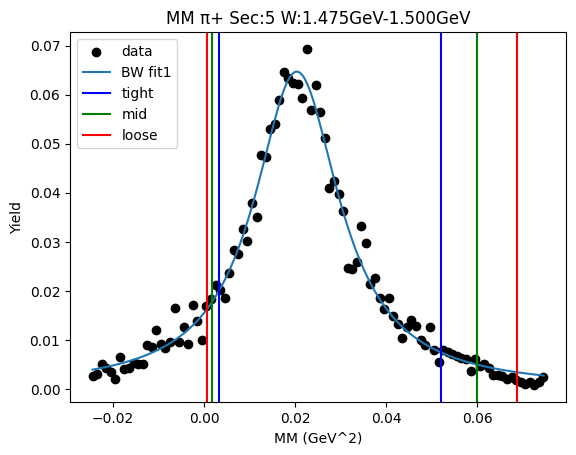

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.00348589 0.00172759 0.0005802 ]
 [0.05466811 0.06314626 0.0722353 ]]
Cut Bounds Err [[4.31172304e-07 3.63604802e-07 2.45572385e-07]
 [1.70750160e-06 2.19827732e-06 2.74010131e-06]]


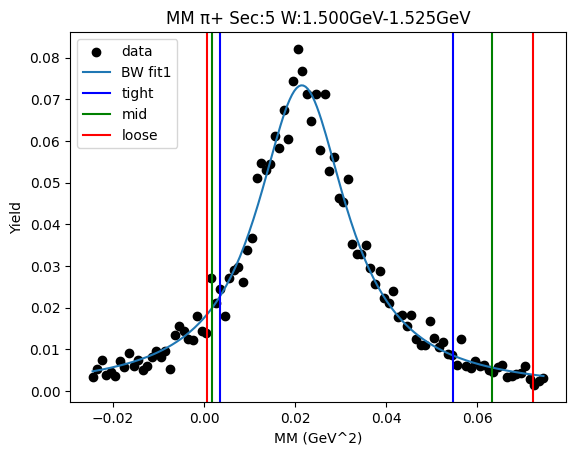

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.00408625 0.00218045 0.00086829]
 [0.05579459 0.06423045 0.07325996]]
Cut Bounds Err [[7.23400209e-07 6.32995110e-07 4.65523106e-07]
 [2.67308128e-06 3.43556198e-06 4.27604011e-06]]


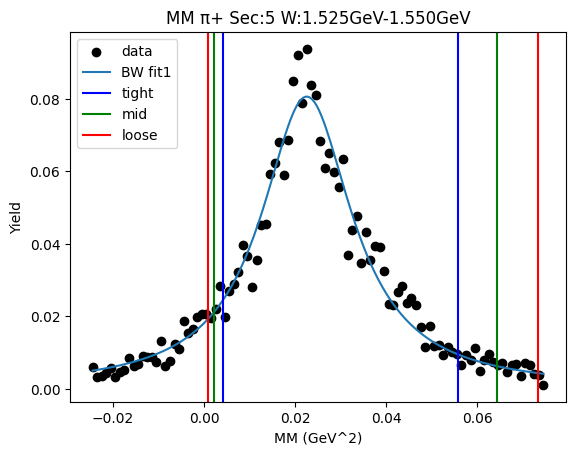

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.00410955 0.00217222 0.0008473 ]
 [0.05716526 0.06583908 0.0751253 ]]
Cut Bounds Err [[8.67385639e-07 7.55411175e-07 5.49837199e-07]
 [3.23505172e-06 4.15885065e-06 5.17736553e-06]]


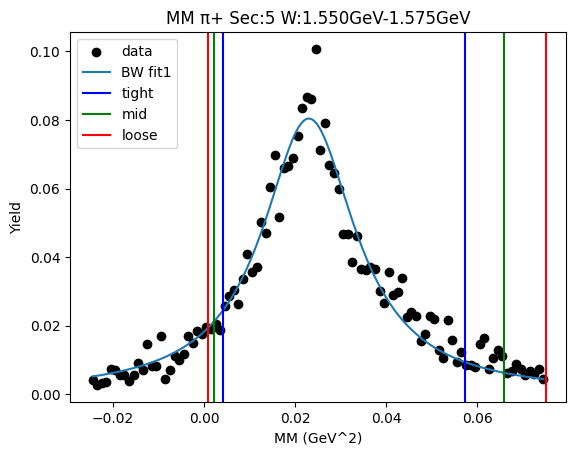

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.0025233  0.00093501 0.00011932]
 [0.06089956 0.07098652 0.08184609]]
Cut Bounds Err [[7.21535095e-07 5.26180217e-07 2.19072267e-07]
 [3.54470546e-06 4.58474666e-06 5.73764476e-06]]


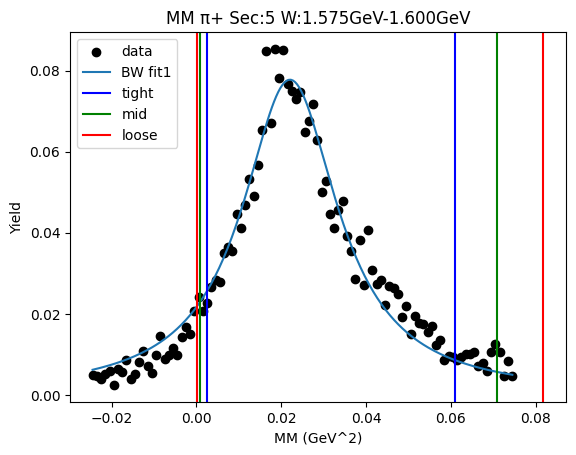

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.00395013 0.00201941 0.00073039]
 [0.05855059 0.06753996 0.07717102]]
Cut Bounds Err [[6.05719140e-07 5.18802180e-07 3.63625460e-07]
 [2.33201354e-06 3.00033513e-06 3.73770808e-06]]


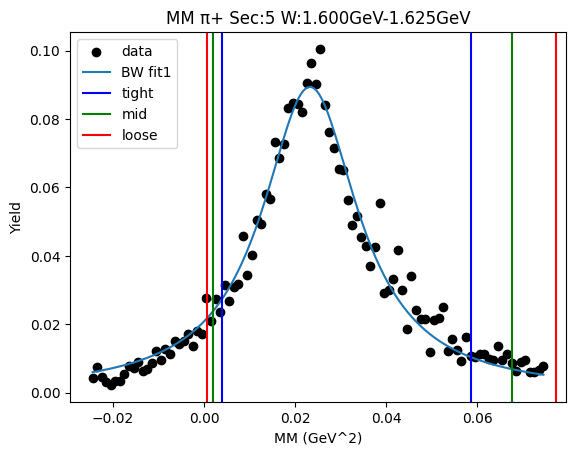

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.00251008 0.00094943 0.00013283]
 [0.05903881 0.06878391 0.07927306]]
Cut Bounds Err [[7.83450078e-07 5.77226492e-07 2.51627416e-07]
 [3.79958948e-06 4.91312932e-06 6.14724249e-06]]


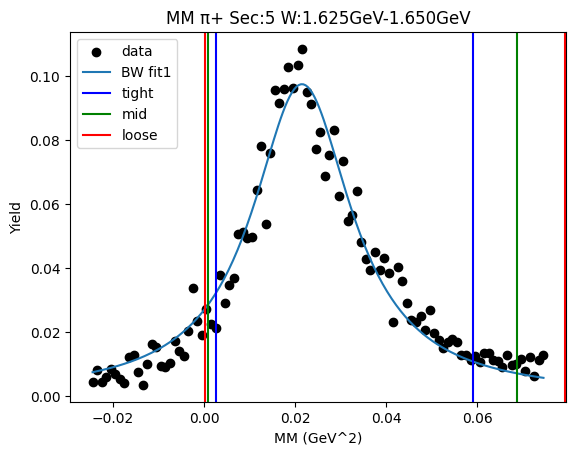

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.0029732  0.00130202 0.00031117]
 [0.05710323 0.06625806 0.07609321]]
Cut Bounds Err [[4.99719056e-07 3.96144551e-07 2.25701537e-07]
 [2.19000154e-06 2.82595334e-06 3.52949118e-06]]


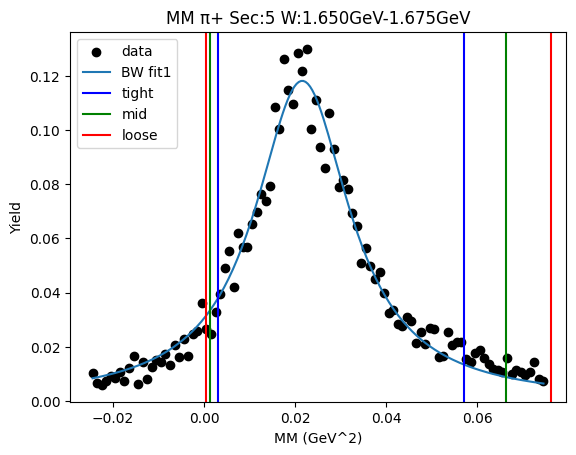

W bin: 11 1.675GeV-1.700GeV
Cut Bounds [[0.00399759 0.0021353  0.00085218]
 [0.05447484 0.062708   0.07152034]]
Cut Bounds Err [[7.43702810e-07 6.51083571e-07 4.79348334e-07]
 [2.74535480e-06 3.52832931e-06 4.39138065e-06]]


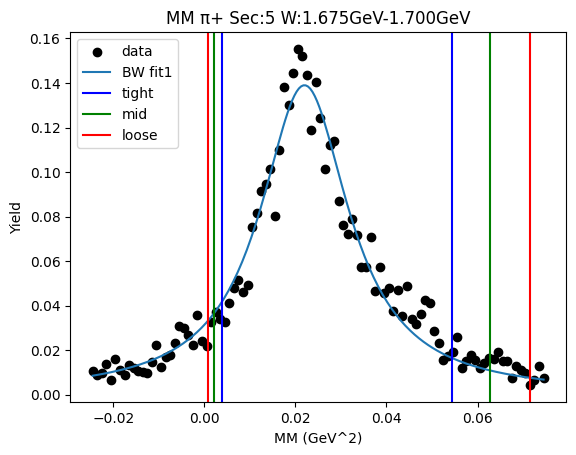

W bin: 12 1.700GeV-1.725GeV
Cut Bounds [[0.00324464 0.00150594 0.00042647]
 [0.05688936 0.0658796  0.07552907]]
Cut Bounds Err [[9.23716398e-07 7.53851609e-07 4.67537672e-07]
 [3.86785901e-06 4.98605714e-06 6.22199094e-06]]


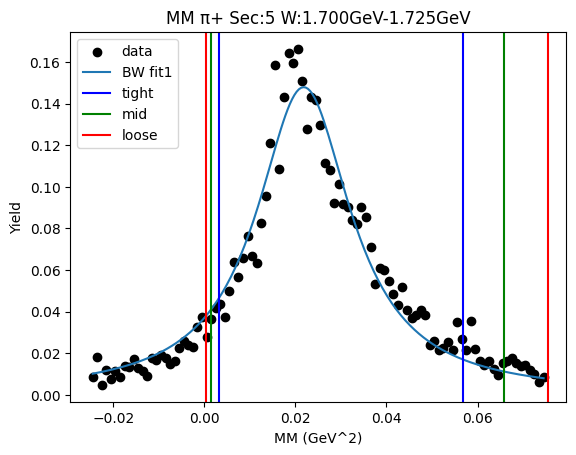

W bin: 13 1.725GeV-1.750GeV
Cut Bounds [[0.00409825 0.00214776 0.00082199]
 [0.05796223 0.06678454 0.07623157]]
Cut Bounds Err [[7.03838879e-07 6.10361365e-07 4.40061600e-07]
 [2.64695616e-06 3.40354806e-06 4.23787011e-06]]


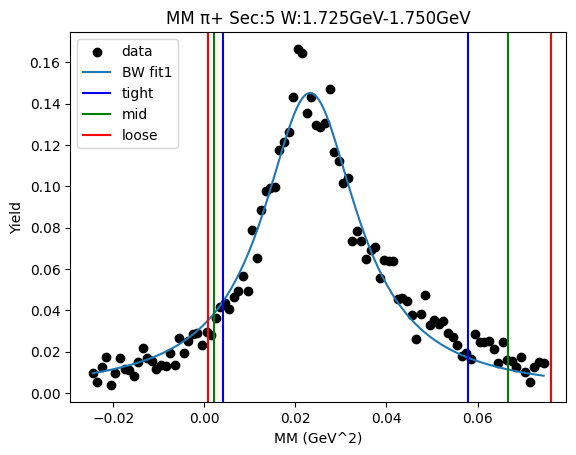

W bin: 14 1.750GeV-1.775GeV
Cut Bounds [[0.00267798 0.00101089 0.00014018]
 [0.06315001 0.07357732 0.08480102]]
Cut Bounds Err [[8.07575980e-07 5.94418536e-07 2.57984102e-07]
 [3.92163019e-06 5.07122962e-06 6.34531792e-06]]


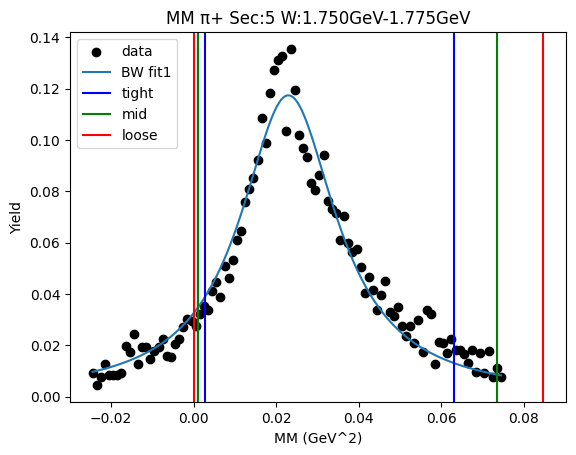

W bin: 15 1.775GeV-1.800GeV
Cut Bounds [[0.00272239 0.00101974 0.00013666]
 [0.06482499 0.07554286 0.0870803 ]]
Cut Bounds Err [[1.21852044e-06 8.93451836e-07 3.81213015e-07]
 [5.94605510e-06 7.68993068e-06 9.62279562e-06]]


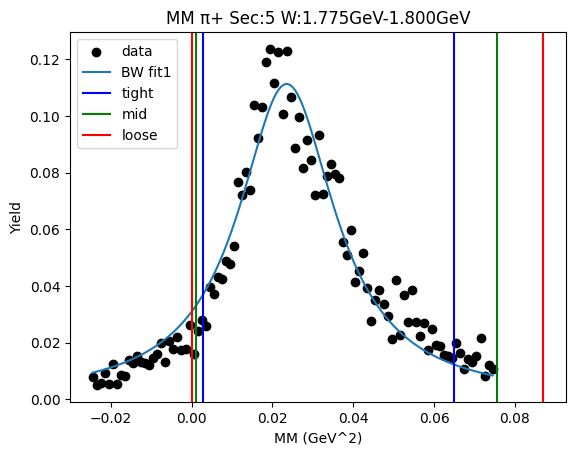

W bin: 16 1.800GeV-1.825GeV
Cut Bounds [[0.00320362 0.00136618 0.0003001 ]
 [0.06400223 0.07432451 0.08541815]]
Cut Bounds Err [[1.15304732e-06 9.02065789e-07 4.92745984e-07]
 [5.15376294e-06 6.65349987e-06 8.31320044e-06]]


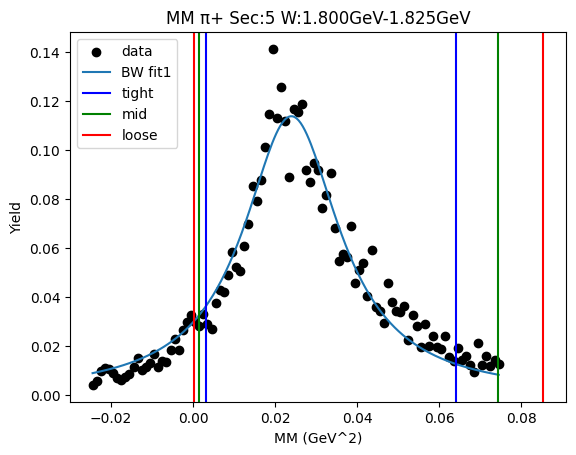

W bin: 17 1.825GeV-1.850GeV
Cut Bounds [[0.00366772 0.00171418 0.00049478]
 [0.06358063 0.07360967 0.08437285]]
Cut Bounds Err [[1.05843618e-06 8.66850319e-07 5.42782466e-07]
 [4.40685756e-06 5.68045574e-06 7.08795999e-06]]


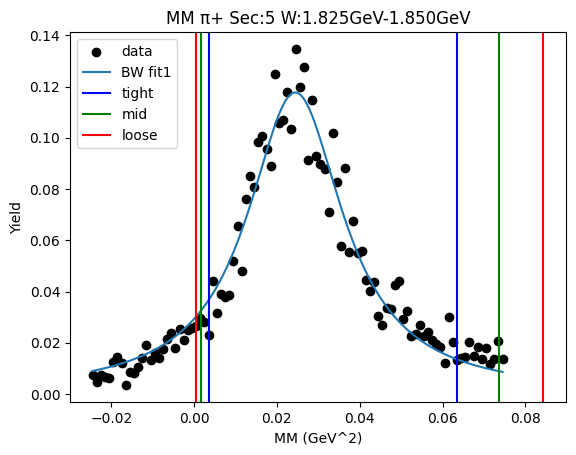

W bin: 18 1.850GeV-1.875GeV
Cut Bounds [[2.23001210e-03 6.70783883e-04 2.09396632e-05]
 [6.78384142e-02 7.94008664e-02 9.18727026e-02]]
Cut Bounds Err [[1.44428691e-06 9.49031972e-07 1.95435342e-07]
 [7.96595241e-06 1.03252875e-05 1.29452817e-05]]


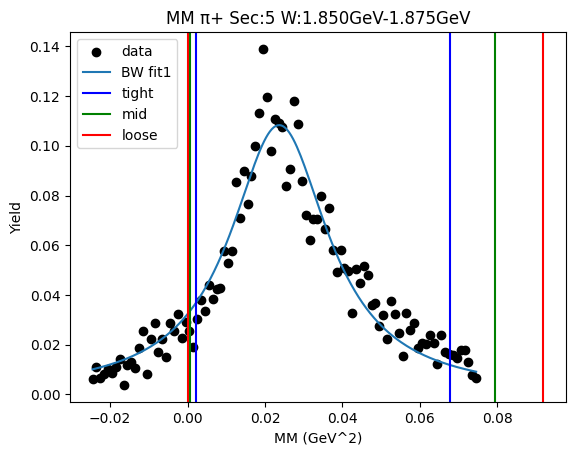

W bin: 19 1.875GeV-1.900GeV
Cut Bounds [[0.00276846 0.00103803 0.00013973]
 [0.06583996 0.07672383 0.08843983]]
Cut Bounds Err [[1.32502028e-06 9.72031658e-07 4.15662475e-07]
 [6.46171685e-06 8.35680197e-06 1.04572342e-05]]


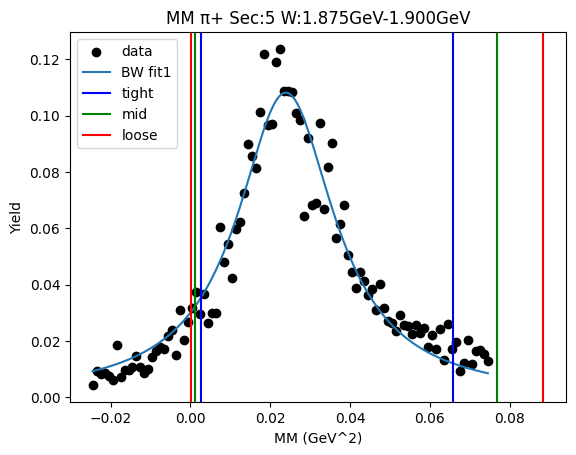

W bin: 20 1.900GeV-1.925GeV
background fit [0.01793184 1.         0.06       0.00423965 1.4        0.2       ]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.007640668612216116 0.03303755150679489
Breit-Wigner Peak [0.00698525 0.14261525 0.06506008]
Gaus2 [0.02746815 0.03485483 0.03053263]
Gaus3 [0.01791847 0.03019459 0.00854744]
Cut Bounds [[0.00538791 0.00354737 0.00209007]
 [0.04487114 0.05092725 0.05736659]]
Cut Bounds Err [[1.15679562e-05 1.12073355e-05 1.00057946e-05]
 [3.33833515e-05 4.24643056e-05 5.24204678e-05]]


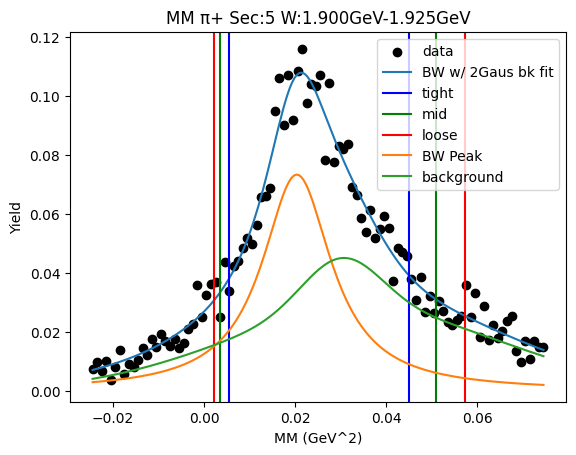

W bin: 21 1.925GeV-1.950GeV
background fit [8.45581739e-03 5.75961634e-02 8.73491008e-03 1.98709437e-06
 3.00000176e-02 3.58427462e-07]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.004856716619798505 0.03733500739146092
Breit-Wigner Peak [0.00860747 0.14524415 0.07357342]
Gaus2 [0.02799692 0.03519276 0.02628961]
Gaus3 [1.98709437e-06 3.00000176e-02 3.58427462e-07]
Cut Bounds [[0.00448559 0.00263381 0.00127211]
 [0.04995839 0.05720117 0.06493404]]
Cut Bounds Err [[8.65677443e-06 7.95949843e-06 6.45331949e-06]
 [2.88901997e-05 3.70933620e-05 4.61058827e-05]]


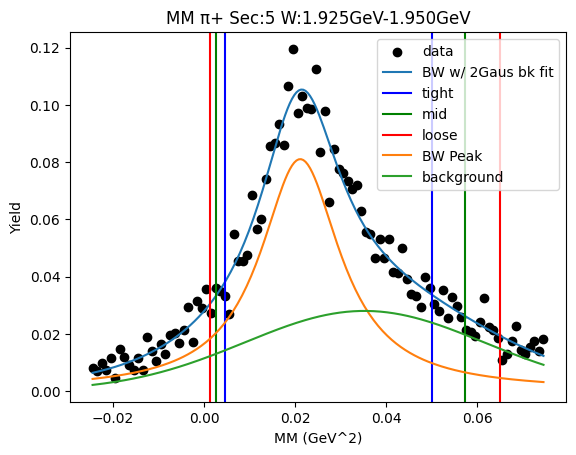

W bin: 22 1.950GeV-1.975GeV
background fit [7.20649155e-03 5.62993422e-02 9.82062627e-03 1.98709437e-06
 3.00000176e-02 3.58427462e-07]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.0005564555051822302 0.04300671495078566
Breit-Wigner Peak [0.0119463  0.14568847 0.08520873]
Gaus2 [0.01691526 0.04622072 0.01724581]
Gaus3 [1.98709437e-06 3.00000176e-02 3.58427462e-07]
Cut Bounds [[0.0030295  0.00136245 0.00035276]
 [0.05585473 0.06475273 0.07430809]]
Cut Bounds Err [[1.06066874e-06 8.45402775e-07 4.98923197e-07]
 [4.55432900e-06 5.82817598e-06 7.24124996e-06]]


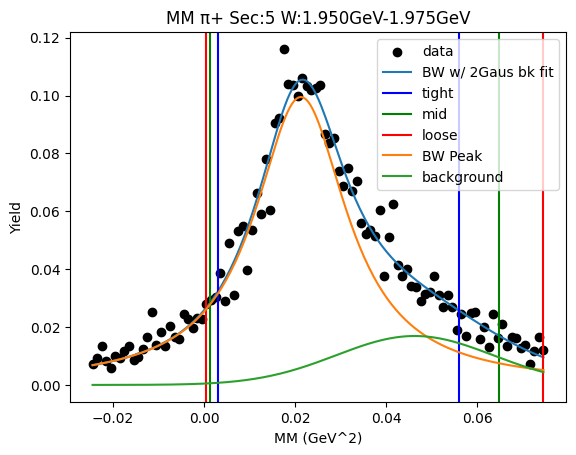

W bin: 23 1.975GeV-2.000GeV
background fit [5.66493510e-03 5.54129030e-02 1.02541125e-02 1.98709437e-06
 3.00000176e-02 3.58427462e-07]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-5.345558460311331e-05 0.04281018426581375
Breit-Wigner Peak [0.01070513 0.14621342 0.08452183]
Gaus2 [0.02036656 0.03963559 0.02021496]
Gaus3 [1.98709437e-06 3.00000176e-02 3.58427462e-07]
Cut Bounds [[0.0031693  0.0014679  0.0004133 ]
 [0.0557575  0.06457374 0.07403678]]
Cut Bounds Err [[1.29492842e-05 1.05745840e-05 6.54601948e-06]
 [5.43144532e-05 7.01362773e-05 8.76126959e-05]]


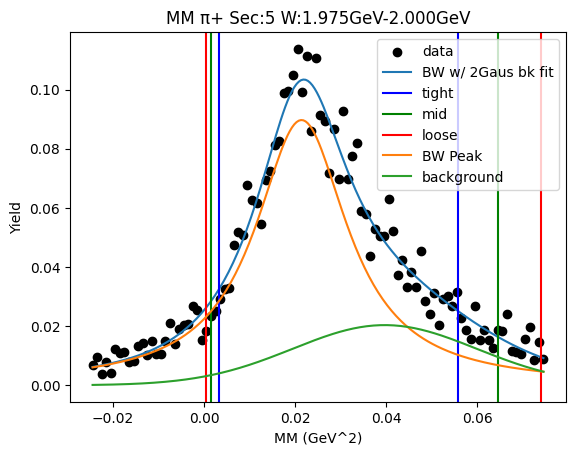

W bin: 24 2.000GeV-2.025GeV
background fit [9.33470287e-03 5.48603010e-02 7.46563811e-03 1.98709437e-06
 3.00000176e-02 3.58427462e-07]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0016531787771224618 0.042942014958230065
Breit-Wigner Peak [0.0115786  0.1493238  0.08295464]
Gaus2 [0.01612489 0.05116254 0.01493816]
Gaus3 [1.98709437e-06 3.00000176e-02 3.58427462e-07]
Cut Bounds [[0.00373006 0.00188567 0.00066432]
 [0.05644113 0.06513895 0.07445982]]
Cut Bounds Err [[1.19829955e-06 1.00911544e-06 6.93177196e-07]
 [4.66128441e-06 5.93101286e-06 7.33867828e-06]]


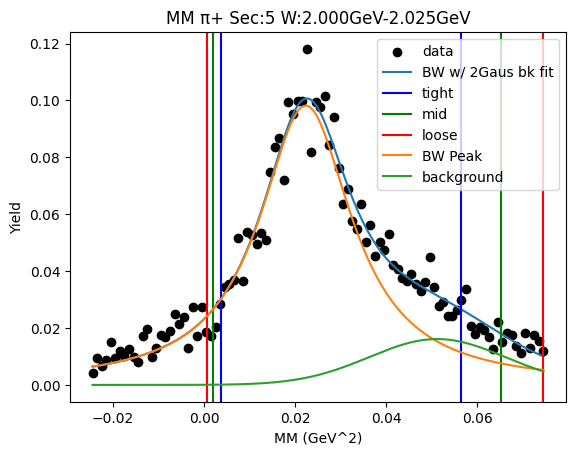

W bin: 25 2.025GeV-2.050GeV
background fit [5.25474592e-03 5.97638858e-02 1.06450691e-02 1.98709437e-06
 3.00000176e-02 3.58427462e-07]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.007721404294728344 0.03612359218532324
Breit-Wigner Peak [0.00738966 0.14806248 0.06880187]
Gaus2 [0.0283228  0.03316887 0.02488238]
Gaus3 [1.98709437e-06 3.00000176e-02 3.58427462e-07]
Cut Bounds [[0.00560537 0.00362769 0.00207859]
 [0.0489542  0.05564629 0.06276696]]
Cut Bounds Err [[1.08735155e-05 1.04961807e-05 9.26889715e-06]
 [3.21338639e-05 4.11087605e-05 5.09341141e-05]]


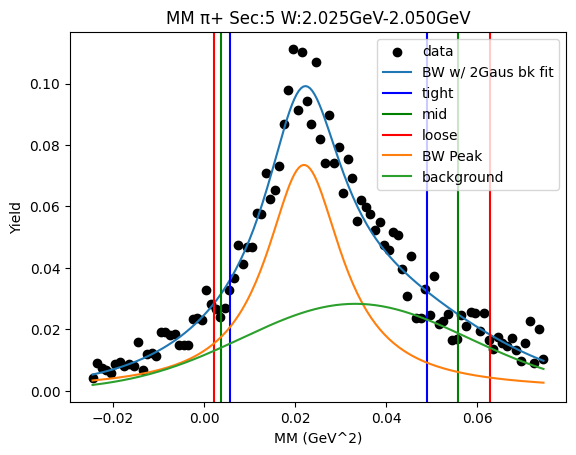

W bin: 26 2.050GeV-2.075GeV
background fit [4.76533810e-03 5.97159294e-02 1.22335780e-02 1.98709437e-06
 3.00000176e-02 3.58427462e-07]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.008962751944253845 0.034755547045484364
Breit-Wigner Peak [0.00649216 0.1478484  0.06556523]
Gaus2 [0.03337042 0.03       0.02473529]
Gaus3 [1.98709437e-06 3.00000176e-02 3.58427462e-07]
Cut Bounds [[0.00609932 0.00411498 0.00251985]
 [0.04734917 0.0536148  0.06026963]]
Cut Bounds Err [[1.16806950e-05 1.15122323e-05 1.05096738e-05]
 [3.25449853e-05 4.15544960e-05 5.13986332e-05]]


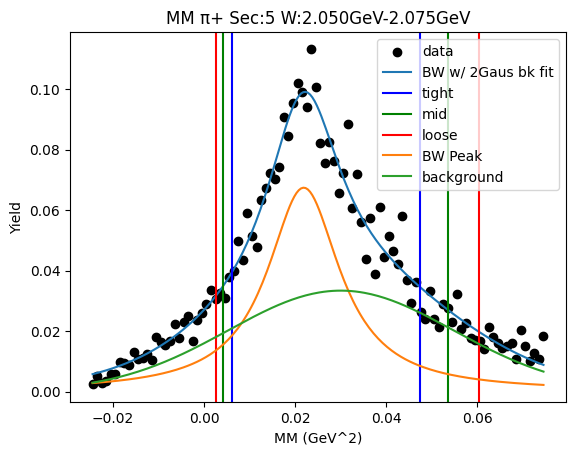

W bin: 27 2.075GeV-2.100GeV
background fit [6.62475697e-03 5.76803926e-02 8.27837735e-03 1.98709437e-06
 3.00000176e-02 3.58427462e-07]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0048006268481445465 0.03853751653442784
Breit-Wigner Peak [0.00767396 0.14720418 0.07498543]
Gaus2 [0.02477877 0.03579764 0.02605132]
Gaus3 [1.98709437e-06 3.00000176e-02 3.58427462e-07]
Cut Bounds [[0.00454714 0.00264999 0.00126194]
 [0.05151807 0.05901511 0.06702124]]
Cut Bounds Err [[1.17906948e-05 1.08005200e-05 8.69500748e-06]
 [3.96871815e-05 5.09687260e-05 6.33661542e-05]]


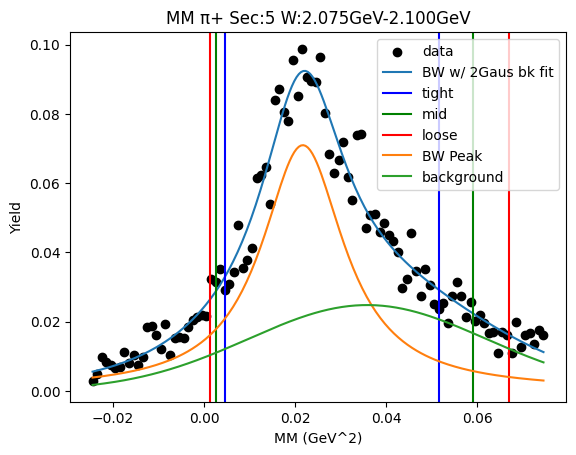

W bin: 28 2.100GeV-2.125GeV
background fit [8.56410089e-03 6.14074105e-02 9.59706178e-03 1.98709437e-06
 3.00000176e-02 3.58427462e-07]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.010219766078421386 0.03376034984620648
Breit-Wigner Peak [0.0070446  0.14829045 0.06263729]
Gaus2 [0.02438742 0.03542492 0.02938913]
Gaus3 [1.98709437e-06 3.00000176e-02 3.58427462e-07]
Cut Bounds [[0.00666754 0.00466871 0.0030251 ]
 [0.04619313 0.05209941 0.05836092]]
Cut Bounds Err [[3.72798255e-06 3.74296015e-06 3.51479300e-06]
 [9.81249870e-06 1.25035470e-05 1.54380089e-05]]


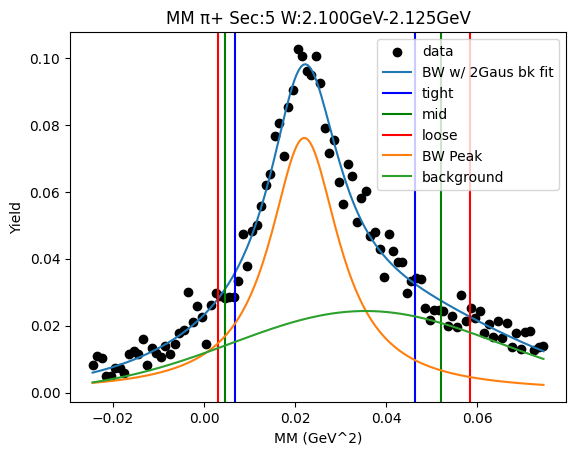

Value Error1.1
	Just skip it for now


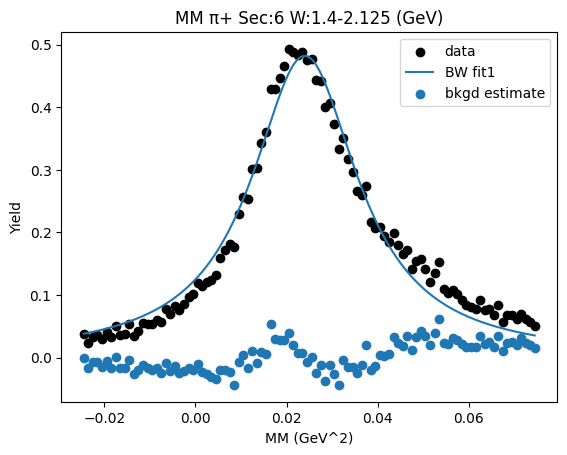

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.00463925 0.00277637 0.00138909]
 [0.04942597 0.05652044 0.06409051]]
Cut Bounds Err [[5.60864445e-06 5.19701618e-06 4.28394501e-06]
 [1.83067675e-05 2.34486605e-05 2.90988009e-05]]


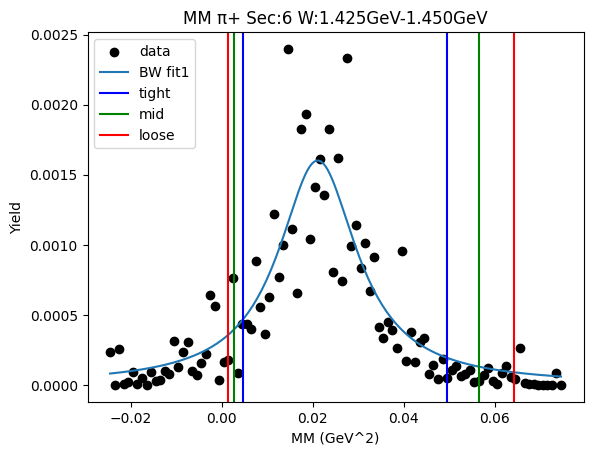

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.0041996  0.00235502 0.00104024]
 [0.05178467 0.0594571  0.06765934]]
Cut Bounds Err [[4.19374651e-06 3.76174892e-06 2.91360070e-06]
 [1.47264733e-05 1.89014288e-05 2.34978288e-05]]


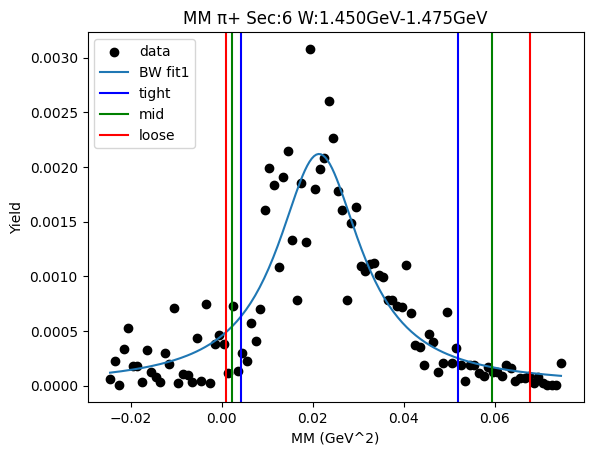

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.00528099 0.00322756 0.00167713]
 [0.05348049 0.06106696 0.06915643]]
Cut Bounds Err [[4.29425485e-06 4.02120659e-06 3.37808600e-06]
 [1.36655719e-05 1.74913119e-05 2.16921843e-05]]


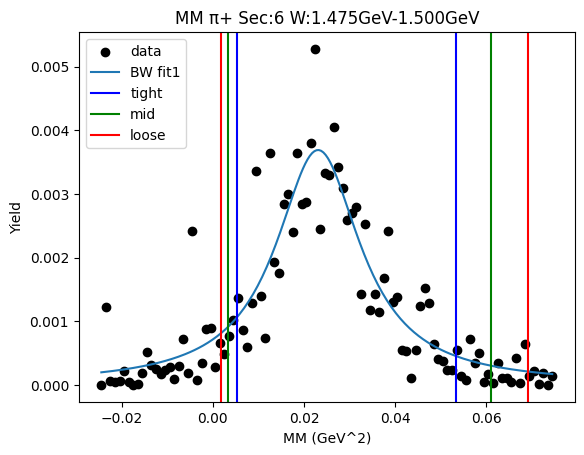

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.00555089 0.0035139  0.00194058]
 [0.05142263 0.05855999 0.06616102]]
Cut Bounds Err [[3.47430729e-06 3.31101105e-06 2.86743428e-06]
 [1.05746022e-05 1.35165649e-05 1.67428167e-05]]


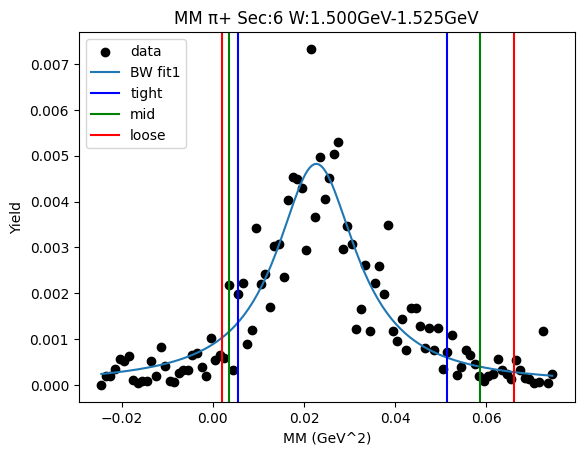

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.00669856 0.00452277 0.0027729 ]
 [0.05188233 0.05874329 0.06603017]]
Cut Bounds Err [[4.50480426e-06 4.43361351e-06 4.04556425e-06]
 [1.25370345e-05 1.59784542e-05 1.97416452e-05]]


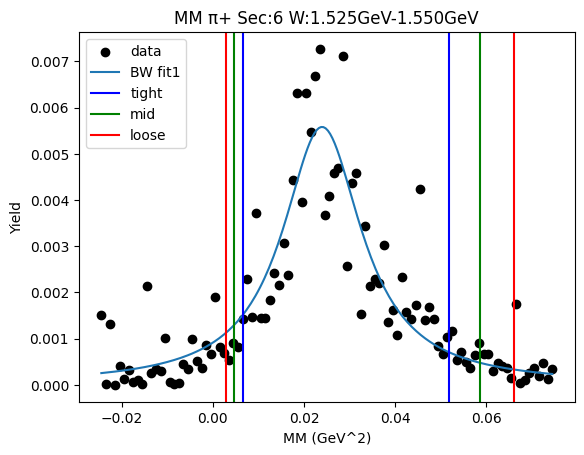

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.00442444 0.00241218 0.00100562]
 [0.05786011 0.06653499 0.07581556]]
Cut Bounds Err [[4.51645411e-06 3.99474427e-06 3.00596706e-06]
 [1.63327082e-05 2.09801732e-05 2.61003861e-05]]


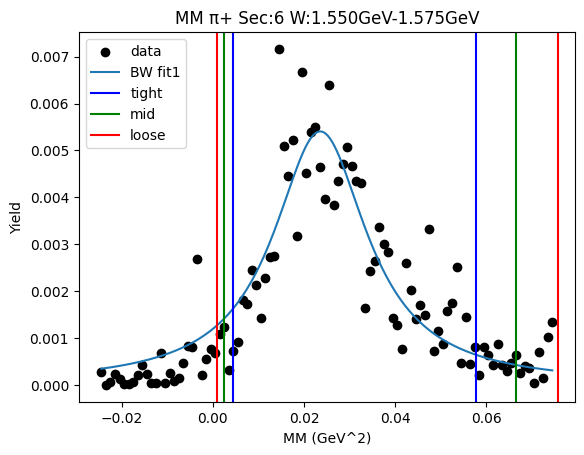

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.00489613 0.00288198 0.00139845]
 [0.0542213  0.06207219 0.07045369]]
Cut Bounds Err [[3.16670544e-06 2.91019996e-06 2.36250407e-06]
 [1.05381970e-05 1.35059691e-05 1.67687602e-05]]


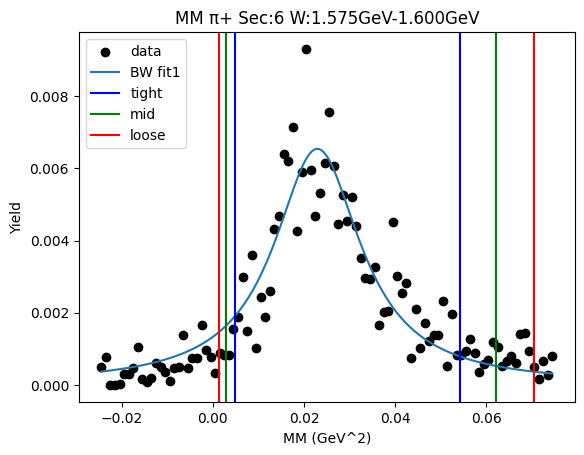

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.00575832 0.00370257 0.00209892]
 [0.0511807  0.05820943 0.06569025]]
Cut Bounds Err [[3.81878887e-06 3.66780210e-06 3.21819235e-06]
 [1.13849456e-05 1.45428888e-05 1.80038078e-05]]


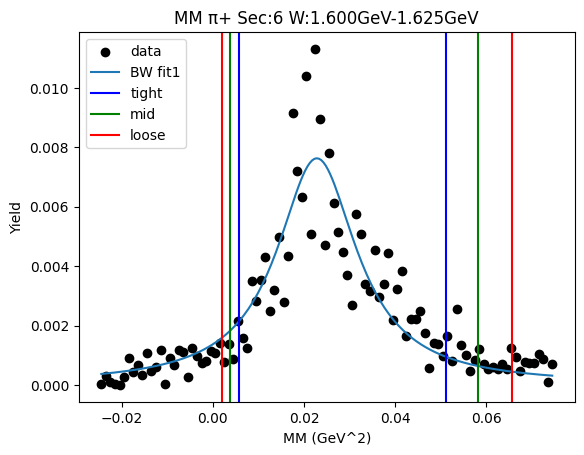

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.00446682 0.00246585 0.00105498]
 [0.05693172 0.06542373 0.07450583]]
Cut Bounds Err [[4.01228300e-06 3.57097579e-06 2.72211152e-06]
 [1.43241707e-05 1.83937885e-05 2.28759867e-05]]


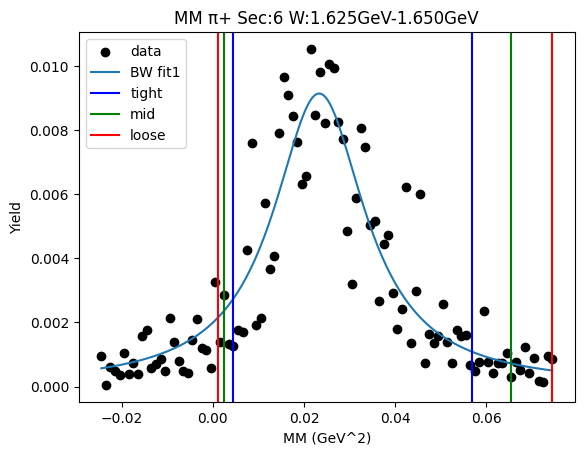

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.00561445 0.00360424 0.0020377 ]
 [0.05011915 0.05700987 0.06434428]]
Cut Bounds Err [[2.54530808e-06 2.44268294e-06 2.14037350e-06]
 [7.60481465e-06 9.71483852e-06 1.20274613e-05]]


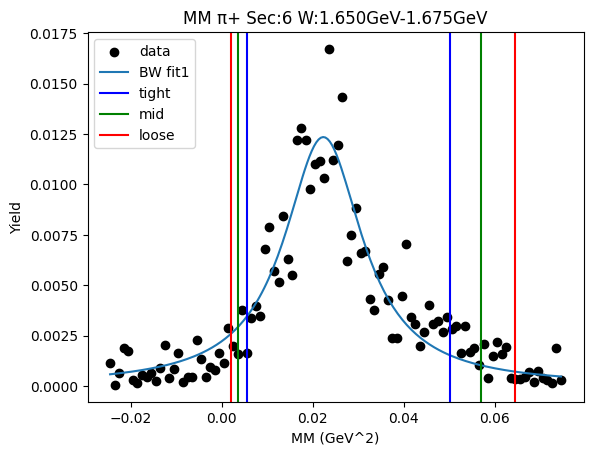

W bin: 11 1.675GeV-1.700GeV
Cut Bounds [[0.00471384 0.00274831 0.00130981]
 [0.05335546 0.06111826 0.06940808]]
Cut Bounds Err [[2.29192716e-06 2.09623957e-06 1.68648630e-06]
 [7.71086373e-06 9.88538599e-06 1.22767729e-05]]


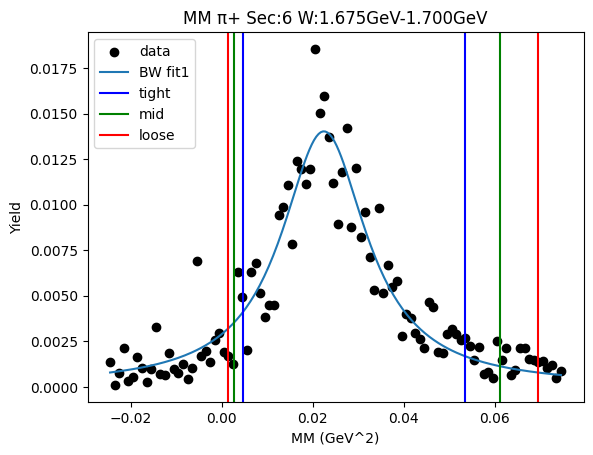

W bin: 12 1.700GeV-1.725GeV
Cut Bounds [[0.00453469 0.00259806 0.00119732]
 [0.05337462 0.06120597 0.06957321]]
Cut Bounds Err [[2.78409125e-06 2.52424187e-06 1.99702256e-06]
 [9.55161615e-06 1.22518870e-05 1.52229707e-05]]


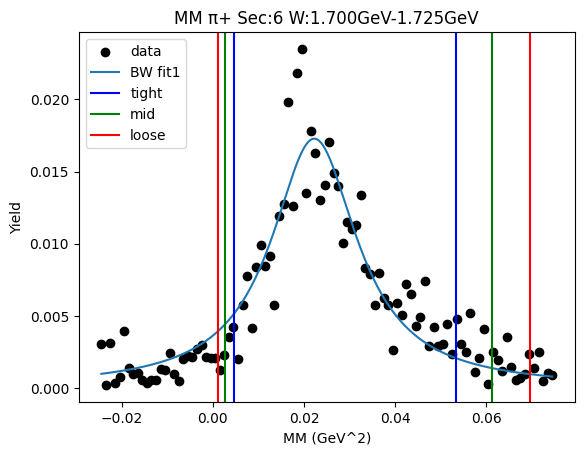

W bin: 13 1.725GeV-1.750GeV
Cut Bounds [[0.00443696 0.00238507 0.00096496]
 [0.05970419 0.06870574 0.07833908]]
Cut Bounds Err [[3.28042846e-06 2.88111695e-06 2.13576188e-06]
 [1.20334496e-05 1.54634801e-05 1.92436857e-05]]


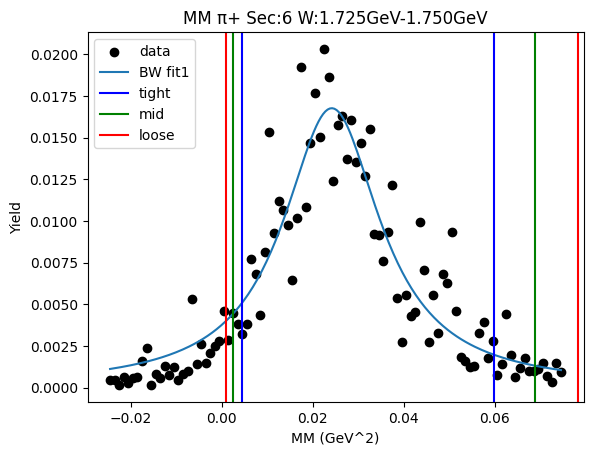

W bin: 14 1.750GeV-1.775GeV
Cut Bounds [[0.00488142 0.00269611 0.00115471]
 [0.06214937 0.07141765 0.08132983]]
Cut Bounds Err [[4.17868896e-06 3.72018706e-06 2.83742478e-06]
 [1.49102620e-05 1.91469018e-05 2.38129129e-05]]


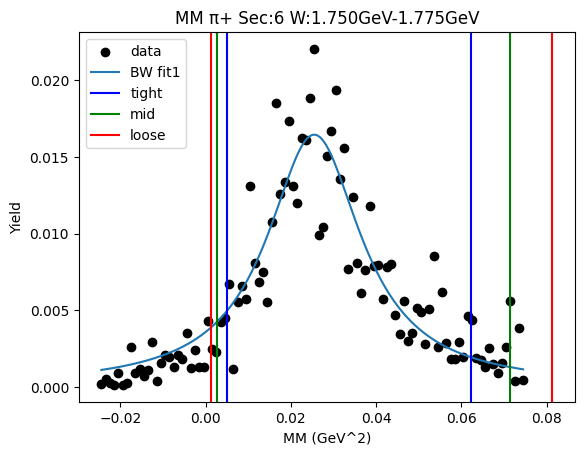

W bin: 15 1.775GeV-1.800GeV
Cut Bounds [[0.00473947 0.00261429 0.00111665]
 [0.06050667 0.06953493 0.07919074]]
Cut Bounds Err [[3.15258151e-06 2.80479448e-06 2.13634823e-06]
 [1.12642710e-05 1.44652538e-05 1.79907849e-05]]


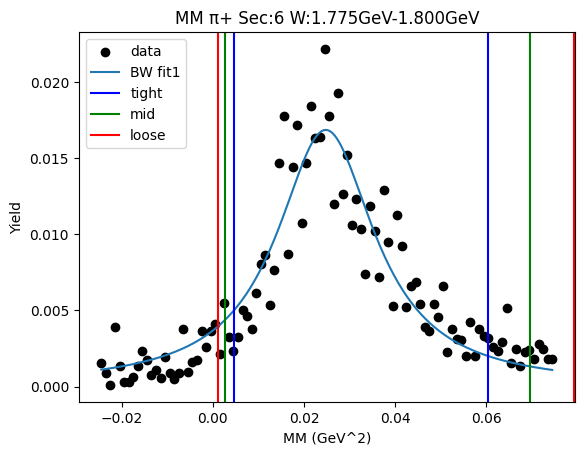

W bin: 16 1.800GeV-1.825GeV
Cut Bounds [[0.00315766 0.00131534 0.00026707]
 [0.06525351 0.07583036 0.08720126]]
Cut Bounds Err [[4.14166924e-06 3.20239602e-06 1.68181423e-06]
 [1.88275864e-05 2.43151945e-05 3.03899798e-05]]


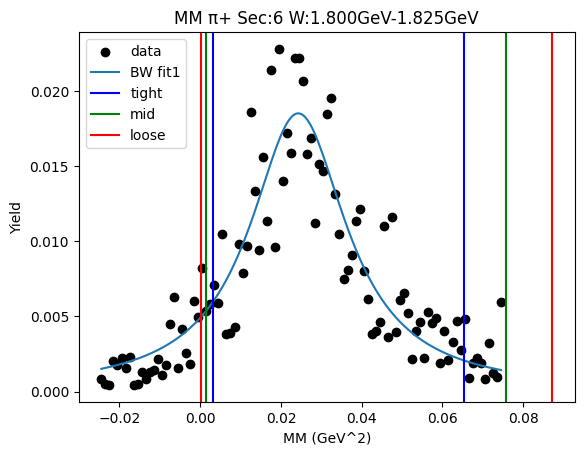

W bin: 17 1.825GeV-1.850GeV
Cut Bounds [[0.00389586 0.0018945  0.00060688]
 [0.06316484 0.07301728 0.08358345]]
Cut Bounds Err [[3.16610792e-06 2.64494109e-06 1.74470136e-06]
 [1.27485849e-05 1.64203169e-05 2.04752952e-05]]


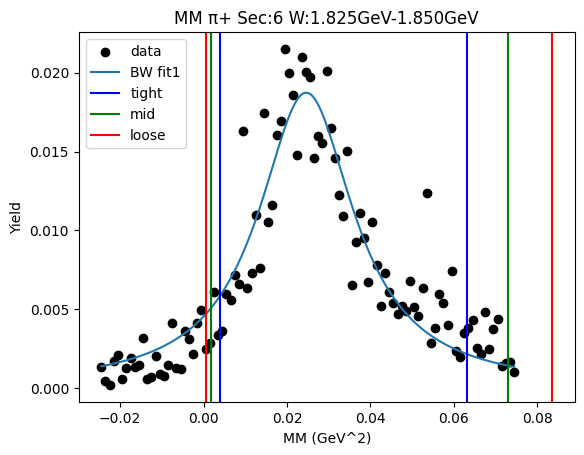

W bin: 18 1.850GeV-1.875GeV
Cut Bounds [[0.00369609 0.00175932 0.00053329]
 [0.06215417 0.07190902 0.08237461]]
Cut Bounds Err [[2.34464220e-06 1.93785149e-06 1.24345398e-06]
 [9.61480755e-06 1.23890957e-05 1.54541351e-05]]


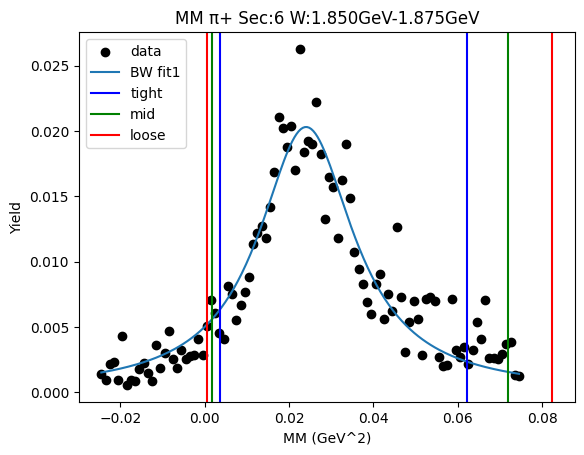

W bin: 19 1.875GeV-1.900GeV
Cut Bounds [[0.00264874 0.00099367 0.00013408]
 [0.06295086 0.07335621 0.08455704]]
Cut Bounds Err [[3.27788626e-06 2.40522635e-06 1.02972571e-06]
 [1.59799258e-05 2.06658527e-05 2.58595579e-05]]


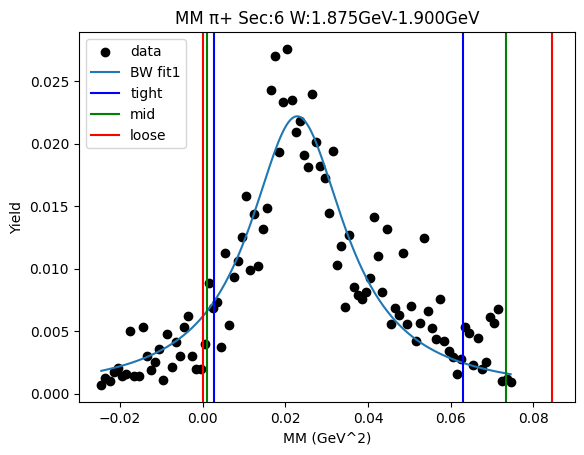

W bin: 20 1.900GeV-1.925GeV
Value Error2.2
	Just skip it for now
Cut Bounds [[0.00316433 0.00130403 0.00025506]
 [0.06638966 0.07717443 0.08877052]]
Cut Bounds Err [[0.20140891 0.24169082 0.28197273]
 [0.2014102  0.24169211 0.28197402]]


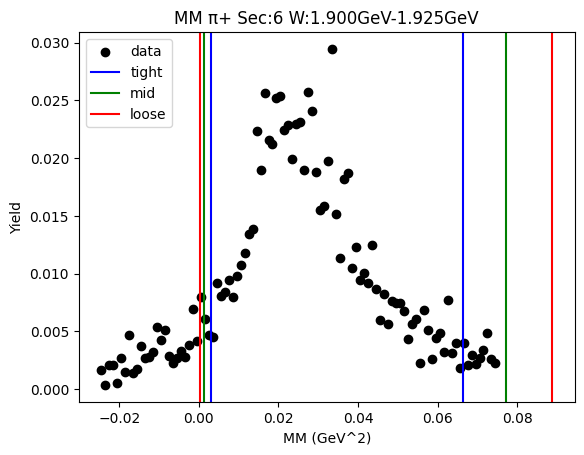

W bin: 21 1.925GeV-1.950GeV
background fit [6.20141707e-03 1.00000000e+00 6.00000000e-02 6.24902244e-04
 1.40000000e+00 2.00000000e-01]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0009906497954760562 0.046366067624814475
Breit-Wigner Peak [0.00291641 0.15387774 0.08696304]
Gaus2 [0.18811992 1.00138351 0.06505582]
Gaus3 [0.00300123 0.04927462 0.02164282]
Cut Bounds [[0.00376552 0.00183707 0.00059333]
 [0.06070882 0.07016903 0.08031395]]
Cut Bounds Err [[1.40738684e-05 1.17896010e-05 7.81414468e-06]
 [5.65101744e-05 7.28632543e-05 9.09137410e-05]]


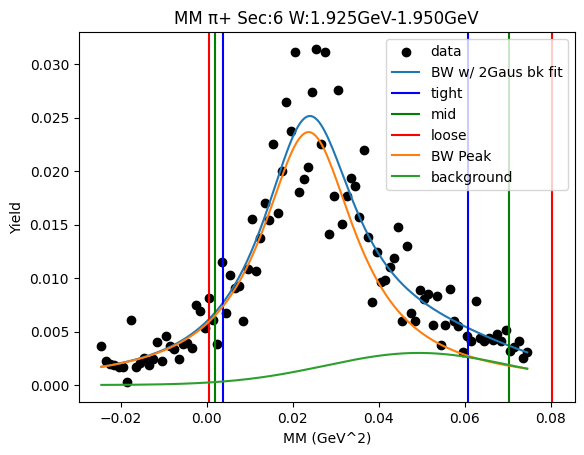

W bin: 22 1.950GeV-1.975GeV
background fit [0.17733033 1.33878047 0.14351258 0.00193971 0.05670111 0.00880076]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.009585158052809043 0.03485854897041142
Breit-Wigner Peak [0.00214196 0.14906996 0.06490171]
Gaus2 [0.29386077 0.90514384 0.28066989]
Gaus3 [0.00700952 0.03       0.01594205]
Cut Bounds [[0.0064041  0.00438465 0.00274658]
 [0.04757386 0.05378837 0.06038426]]
Cut Bounds Err [[9.63207145e-05 9.56359840e-05 8.83050793e-05]
 [2.62527627e-04 3.34963818e-04 4.14048548e-04]]


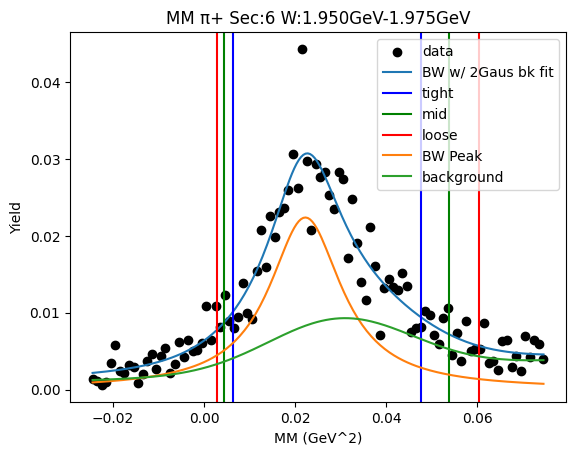

W bin: 23 1.975GeV-2.000GeV
background fit [3.01349622e-01 9.55324718e+02 2.56873994e-01 3.09776995e-03
 5.68267619e-02 7.83308657e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0020340308730774706 0.04160149581818883
Breit-Wigner Peak [0.00309195 0.14770837 0.081207  ]
Gaus2 [ 298.27143902 1365.17357295   17.21851588]
Gaus3 [0.00545157 0.04789357 0.02204044]
Cut Bounds [[0.00375989 0.00193951 0.00071619]
 [0.05480225 0.06319034 0.0721755 ]]
Cut Bounds Err [[2.41032721e-05 2.07714910e-05 1.47249736e-05]
 [9.20211419e-05 1.18562437e-04 1.47820464e-04]]


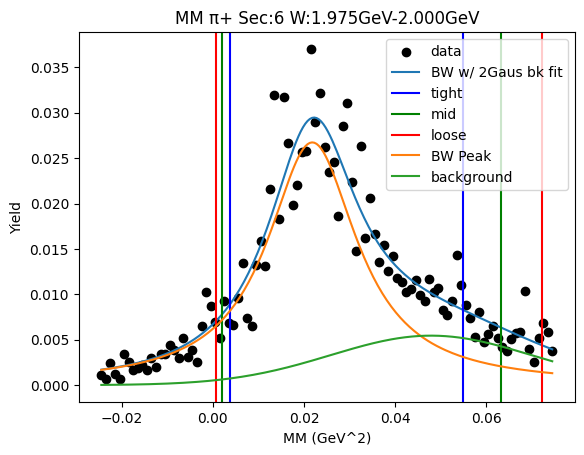

W bin: 24 2.000GeV-2.025GeV
background fit [1.62110927e+02 1.89736853e+03 2.98297483e+02 1.89255199e-03
 5.84237675e-02 9.77764440e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0024475281644263033 0.04301942530138349
Breit-Wigner Peak [0.00279714 0.15077625 0.08223128]
Gaus2 [1471.37339335 3703.96751008  330.12958295]
Gaus3 [0.00679057 0.03917952 0.0232239 ]
Cut Bounds [[0.0040064  0.00209765 0.00080112]
 [0.05676608 0.06540926 0.07466467]]
Cut Bounds Err [[5.76466020e-05 5.00532173e-05 3.60872877e-05]
 [2.16990517e-04 2.79501876e-04 3.48387007e-04]]


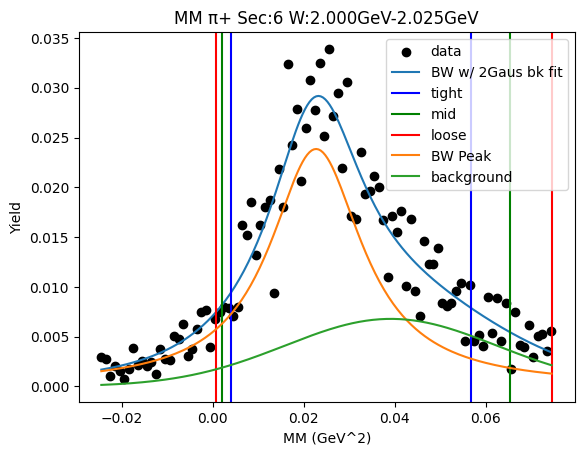

W bin: 25 2.025GeV-2.050GeV
background fit [1.47137339e+03 1.90035870e+03 9.35212354e+01 2.24385200e-03
 5.89340559e-02 8.55174007e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0019267400132379937 0.04187214600979808
Breit-Wigner Peak [0.00328391 0.1479846  0.08159392]
Gaus2 [ 705.87847181 4172.10269121  288.91838541]
Gaus3 [0.00656425 0.04116357 0.02004038]
Cut Bounds [[0.00374331 0.00192038 0.00070022]
 [0.05512477 0.06357814 0.07263427]]
Cut Bounds Err [[2.47026453e-05 2.12300900e-05 1.49554648e-05]
 [9.47958213e-05 1.22155216e-04 1.52318349e-04]]


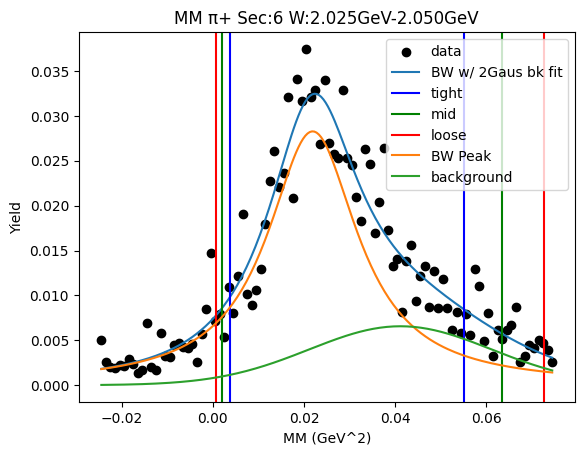

W bin: 26 2.050GeV-2.075GeV
background fit [7.05866585e+02 5.95049942e+03 8.19277027e+02 2.59780266e-03
 5.71841693e-02 8.71249589e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.0009143292856873958 0.045068126884906114
Breit-Wigner Peak [0.00358813 0.15162859 0.08578442]
Gaus2 [ 2820.01518106 17236.31938684  1147.97273846]
Gaus3 [0.00528374 0.05034774 0.01487379]
Cut Bounds [[0.00364436 0.0017738  0.00056952]
 [0.05899487 0.06819442 0.07806023]]
Cut Bounds Err [[2.36325320e-06 1.94264227e-06 1.26971984e-06]
 [9.50837987e-06 1.20452083e-05 1.48651532e-05]]


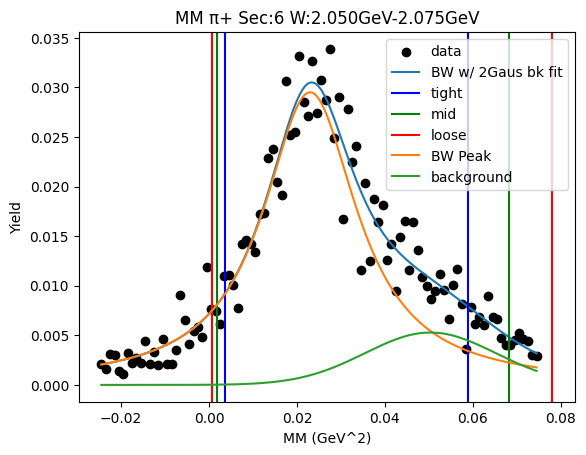

W bin: 27 2.075GeV-2.100GeV
background fit [1.26061618e+02 6.89307970e+04 4.64659398e+03 4.08145404e-03
 5.13409016e-02 3.47535275e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
-0.008649189943722949 0.05683941881561612
Breit-Wigner Peak [0.00449775 0.15522601 0.10447377]
Gaus2 [  126.0616178  68930.79699373  4646.59397517]
Gaus3 [0.00408145 0.0513409  0.00347535]
Cut Bounds [[1.94337303e-03 4.77651673e-04 1.39291369e-07]
 [7.09520802e-02 8.32881003e-02 9.66123293e-02]]
Cut Bounds Err [[2.80274592e-06 1.66513087e-06 3.31468726e-08]
 [1.69351173e-05 2.19879225e-05 2.76055709e-05]]


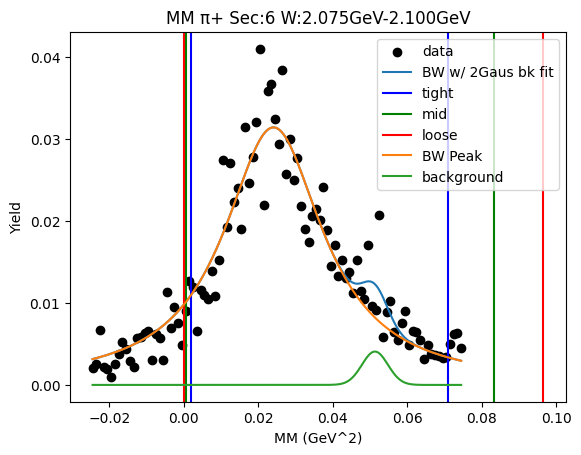

W bin: 28 2.100GeV-2.125GeV
background fit [3.87317219e+00 3.33744663e+04 8.14012405e+03 4.12276965e-03
 5.28648383e-02 2.35296818e-03]
[[0.0, 0.0, 0.0, 0.0, 0.03, 0.0, 0.0, 0.03, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.002614426243675347 0.04098561860639971
Breit-Wigner Peak [0.00393772 0.14764831 0.07996999]
Gaus2 [5.80704562e+02 7.65040136e+04 2.14452158e+01]
Gaus3 [0.00670792 0.04298044 0.02020237]
Cut Bounds [[0.00391549 0.00207562 0.00081476]
 [0.05415988 0.06236889 0.07115692]]
Cut Bounds Err [[1.49944773e-05 1.30991922e-05 9.57423007e-06]
 [5.57670013e-05 7.18050047e-05 8.94739283e-05]]


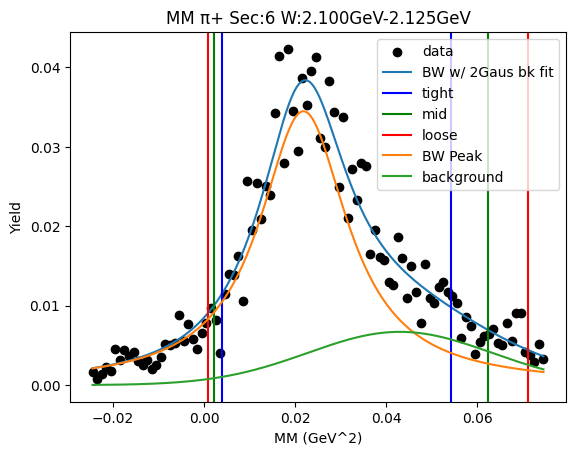

In [14]:
bkgd=True
Wlow_bin = 0
Wbin_bkgd = 20

tight = 2.5
mid = 3
loose = 3.5

a_ini=148
m_ini=0.149
g_ini=0.08
bw_ini = [a_ini,m_ini,g_ini]


gaus2_ini = [0.04,  0.3, 0.06287]
gaus3_ini = [.04, 0.4, 0.2417]
 
bw_ini_w = [0.65, 0.15, 0.035]
gaus2_ini_w = [0.04, 0.3, 0.06742853]
gaus3_ini_w = [0.04, 0.4, 0.10165907]




# bw_ini_w = [1.01801152, 0.94626145, 0.039624]
# gaus2_ini_w = [3.07211428, 1.01332019, 0.06742853]
# gaus3_ini_w = [2.78458923, 1.26687645, 0.10165907]

bw_bounds = [[0.0,0.0,0.0],[np.inf,np.inf,np.inf]]
full_bounds = [[0.0,0.0,0.0,0.0,0.03,0.0,0.0,0.03,0.0],[np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf]]

bkgd_bounds = [[0.0,0.03,0.0,0.0,0.03,0.0],[np.inf,np.inf,np.inf,np.inf,np.inf,np.inf]]

bw_pars = np.zeros((6,_W_bins_+1,3))
gaus2_pars = np.zeros((6,_W_bins_+1,3))
gaus3_pars = np.zeros((6,_W_bins_+1,3))

bkgd_guess_pars = np.zeros((6,_W_bins_+1,6))


ini_pars= np.zeros(9)
for i in range(3):
    ini_pars[i] = bw_ini[i]
    ini_pars[i+3] = gaus2_ini[i]
    ini_pars[i+6] = gaus3_ini[i]

    #sec W low, high, tight, mid, loose
cut_bounds = np.zeros((6,_W_bins_+1,2,3))
cut_bounds_err = np.zeros((6,_W_bins_+1,2,3))

bw_ini_w1 = np.zeros(3)
    
for sec in range(6):
    x_r=Center_Xbins(hist_name[sec][1])
    y_r=Values_1d(hist_name[sec][1])
    plt.scatter(x_r,y_r,color='k',label='data')
    plt.title("MM {} Sec:{} W:{}-{} (GeV)".format(Particle,sec+1,_W_min_,_W_max_))
    plt.xlabel("MM (GeV^2)")
    plt.ylabel("Yield")
   
    try:
        bw_ini[0] = np.max(y_r)
        bw_ini[1] = x_r[np.argmax(y_r)]
        pars_r1, pars_cov_r1 = op.curve_fit(BW_e2,x_r,y_r,p0=bw_ini,maxfev=5000,bounds=bw_bounds)
        tmp_x1 = np.linspace(x_r[0],x_r[len(x_r)-1],200)
        plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_r1),label="BW fit1")
        tmp_y_r = [y_r[i]-BW_e2(x_r[i],*pars_r1) for i in range(len(y_r))]
        plt.scatter(x_r,tmp_y_r,label="bkgd estimate")
        
        try:
            bkgd_guess_pars[sec][_W_bins_][0] = tmp_y_r[50]
            bkgd_guess_pars[sec][_W_bins_][1] = x_r[50]
            bkgd_guess_pars[sec][_W_bins_][2] = 0.05
            bkgd_guess_pars[sec][_W_bins_][3] = tmp_y_r[90]
            bkgd_guess_pars[sec][_W_bins_][4] = x_r[90]
            bkgd_guess_pars[sec][_W_bins_][5] = 0.3
            
            bkgd_full_pars, bkgd_full_pars_cov = op.curve_fit(Gaus2,x_r,tmp_y_r,p0=bkgd_guess_pars[sec][_W_bins_],maxfev=5000,bounds=bkgd_bounds)
            
            plt.plot(tmp_x1,Gaus2(tmp_x1,*bkgd_full_pars),label="bkgd fit")
            try:
                r1_ini_pars = np.zeros(9)

                for i in range(3):
                    r1_ini_pars[i] = pars_r1[i]
                    r1_ini_pars[i+3] = gaus2_ini[i]
                    r1_ini_pars[i+6] = gaus3_ini[i]
                #r1_ini[0] = np.max(y_r)
                #r1_ini[1] - x_r[np.argmax(y_r)]
                pars_r2, pars_cov_r2 = op.curve_fit(BW_e2_Gaus2,x_r,y_r,p0=r1_ini_pars,maxfev=5000)
                plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*pars_r2),label="BW w/ 2Gaus bk fit")
                r1_bkgd_pars = np.zeros(6)
                for i in range(3):
                    bw_pars[sec][_W_bins_][i] = pars_r2[i]
                    r1_bkgd_pars[i] = pars_r2[i+3]
                    r1_bkgd_pars[i+3] = pars_r2[i+6]
                    gaus2_pars[sec][_W_bins_][i] = pars_r2[i+3]
                    gaus3_pars[sec][_W_bins_][i] = pars_r2[i+6]
                for i in range(3):
                    for j in range(2):
                        cut_bounds[sec][_W_bins_][j][i] = (pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35)*(pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35)
                        cut_bounds_err[sec][_W_bins_][j][i] = np.sqrt((2*(pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35))**2 + ((2*sign2[j]*cut_sig[i]/2.35)*(pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35))**2)
                        if j==0:
                            plt.axvline(x=cut_bounds[sec][_W_bins_][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                        else:
                            plt.axvline(x=cut_bounds[sec][_W_bins_][j][i],color=color_order[i])

    #                 cut_bounds[sec][_W_bins_][0][0] = (pars_r2[1]-tight*pars_r2[2]/2.35)*(pars_r2[1]-tight*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][0][1] = (pars_r2[1]-mid*pars_r2[2]/2.35)*(pars_r2[1]-mid*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][0][2] = (pars_r2[1]-loose*pars_r2[2]/2.35)*(pars_r2[1]-loose*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][1][0] = (pars_r2[1]+tight*pars_r2[2]/2.35)*(pars_r2[1]+tight*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][1][1] = (pars_r2[1]+mid*pars_r2[2]/2.35)*(pars_r2[1]+mid*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][1][2] = (pars_r2[1]+loose*pars_r2[2]/2.35)*(pars_r2[1]+loose*pars_r2[2]/2.35)
                plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][_W_bins_]),label="BW Peak")
                plt.plot(tmp_x1,Gaus2(tmp_x1,*r1_bkgd_pars),label="background")

    #             plt.axvline(x=cut_bounds[sec][_W_bins_][0][0],label="tight -{}\u03C3".format(tight))
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][1][0],label="tight +{}\u03C3".format(tight))
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][0][1],label="mid -{}\u03C3".format(mid),color='g')
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][1][1],label="mid +{}\u03C3".format(mid),color='g')
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][0][2],label="loose -{}\u03C3".format(loose),color='r')
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][1][2],label="loose +{}\u03C3".format(loose),color='r')
                print(pars_r2[1]*pars_r2[1]-3*pars_r2[2]*pars_r2[2],pars_r2[1]*pars_r2[1]+3*pars_r2[2]*pars_r2[2])
                print("Breit-Wigner Peak",bw_pars[sec][_W_bins_])
                print("Gaus2",gaus2_pars[sec][_W_bins_])
                print("Gaus3",gaus3_pars[sec][_W_bins_])
            except RuntimeError:
                print("Runtime Error1.2\n\tJust skip it for now")
            except ValueError:
                print("Value Error1.2\n\tJust skip it for now")
        except RuntimeError:
            print("Runtime Error1.1\n\tJust skip it for now")
        except ValueError:
            print("Value Error1.1\n\tJust skip it for now")
    except RuntimeError:
        print("Runtime Error1.0\n\tJust skip it for now")
    except ValueError:
        print("Value Error1.0\n\tJust skip it for now")
    plt.legend()
    plt.show()
    for Wbin in range(_W_bins_):
        if Wbin > Wlow_bin:
            print("W bin:",Wbin,W_Bin_PlotName[Wbin])
            x_w=Center_Xbins(hist_name[sec][0][Wbin])
            y_w=Values_1d(hist_name[sec][0][Wbin])
            plt.scatter(x_w,y_w,color='k',label='data')
            plt.title("MM {} Sec:{} W:{}".format(Particle,sec+1,W_Bin_PlotName[Wbin]))
            plt.xlabel("MM (GeV^2)")
            plt.ylabel("Yield")
            try:
                for j in range(3):
                    if Wbin > 0 and bw_pars[sec][Wbin-1][j]!=0:
                        for i in range(3):
                            bw_ini_w1[i] = bw_pars[sec][Wbin-1][i]
                    else:
                        for i in range(3):
                            bw_ini_w1[i] = bw_ini_w[i]
                bw_ini_w1[0] = np.max(y_w)
                bw_ini_w1[1] = x_r[np.argmax(y_w)]
                pars_w1, pars_cov_w1 = op.curve_fit(BW_e2,x_w,y_w,p0=bw_ini_w1,maxfev=5000,bounds=bw_bounds)
                #tmp_x_w1 = np.linspace(x_w[0],x_w[len(x_w)-1],200)
                #plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_w1),label="BW fit1")
                #print("initial bw fit: ",pars_w1)
                if Wbin >= Wbin_bkgd:
                    tmp_y_w = [y_w[i]-BW_e2(x_w[i],*pars_w1) for i in range(len(y_w))]
                    bkgd_fit_x = Bounds_on_Y(x_w,0.03,0.07)
                    bkgd_fit_y = Bounds_on_X_From_Y(tmp_y_w,x_w,0.03,0.07)
                    #plt.scatter(bkgd_fit_x,bkgd_fit_y,label="bkgd estimate")
                    if gaus2_pars[sec][Wbin-1][0] ==0:
                        bkgd_guess_pars[sec][Wbin][0] = np.max(bkgd_fit_y)
                        bkgd_guess_pars[sec][Wbin][1] = 1.0
                        bkgd_guess_pars[sec][Wbin][2] = 0.06
                        bkgd_guess_pars[sec][Wbin][3] = tmp_y_w[80]
                        bkgd_guess_pars[sec][Wbin][4] = 1.4
                        bkgd_guess_pars[sec][Wbin][5] = 0.2
                    else:
                        bkgd_guess_pars[sec][Wbin][0] = gaus2_pars[sec][Wbin-1][0]
                        bkgd_guess_pars[sec][Wbin][1] = gaus2_pars[sec][Wbin-1][1]
                        bkgd_guess_pars[sec][Wbin][2] = gaus2_pars[sec][Wbin-1][2]
                        bkgd_guess_pars[sec][Wbin][3] = gaus3_pars[sec][Wbin-1][0]
                        bkgd_guess_pars[sec][Wbin][4] = gaus3_pars[sec][Wbin-1][1]
                        bkgd_guess_pars[sec][Wbin][5] = gaus3_pars[sec][Wbin-1][2]
                    
                    
                    
                    #plt.plot(tmp_x1,Gaus2(tmp_x1,*bkgd_guess_pars[sec][Wbin]),label="bkgd guess")
                    try:
                        
                        
                        
                        
                        
                        
                        
                        bkgd_pars_w, bkgd_pars_cov_w = op.curve_fit(Gaus2,bkgd_fit_x,bkgd_fit_y,p0=bkgd_guess_pars[sec][Wbin],bounds=bkgd_bounds)
                        #plt.plot(tmp_x1,Gaus2(tmp_x1,*bkgd_pars_w),label="bkgd fit1")
                        print("background fit",bkgd_pars_w)
                        try:
                            w1_ini_pars = np.zeros(9)

                            for i in range(3):
                                w1_ini_pars[i] = pars_w1[i]
                                if Wbin > 0:
                                    if gaus2_pars[sec][Wbin-1][i] != 0.0:
                                        w1_ini_pars[i+3] = gaus2_pars[sec][Wbin-1][i]
                                        w1_ini_pars[i+6] = gaus3_pars[sec][Wbin-1][i]
                                    else:
                                        w1_ini_pars[i+3] = gaus2_ini_w[i]
                                        w1_ini_pars[i+6] = gaus3_ini_w[i]
                                else:
                                    w1_ini_pars[i+3] = gaus2_ini_w[i]
                                    w1_ini_pars[i+6] = gaus3_ini_w[i]
                           # print("w1_ini_pars:",w1_ini_pars)
                            #w1_ini_pars[0] = np.max(y_w)
                            #w1_ini_pars[1] = x_r[np.argmax(y_w)]
                            for i in range(6):
                                w1_ini_pars[i+3] = bkgd_pars_w[i]
#                             w1_ini_pars[4] = x_w[50]
#                             w1_ini_pars[6] = y_w[90]
#                             w1_ini_pars[7] = x_w[90]
                            #print("post W1_ini_pars",w1_ini_pars)
#                             print(x_w)
#                             print(y_w)
                            #plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*w1_ini_pars),label="Guess on the 2 gaus bkgd")
                            #plt.scatter(x_w,y_w,color='c',label='data again')
                            print(full_bounds)
                            pars_w2, pars_cov_w2 = op.curve_fit(BW_e2_Gaus2,x_w,y_w,p0=w1_ini_pars,maxfev=50000,bounds=full_bounds)
                            plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*pars_w2),label="BW w/ 2Gaus bk fit")
                            
                            w1_bkgd_pars = np.zeros(6)
                            for i in range(3):
                                bw_pars[sec][Wbin][i] = pars_w2[i]
                                w1_bkgd_pars[i] = pars_w2[i+3]
                                w1_bkgd_pars[i+3] = pars_w2[i+6]
                                gaus2_pars[sec][Wbin][i] = pars_w2[i+3]
                                gaus3_pars[sec][Wbin][i] = pars_w2[i+6]
                            for i in range(3):
                                for j in range(2):
                                    cut_bounds[sec][Wbin][j][i] = (pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35)*(pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35)
                                    cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w2[1][1]*2*(pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35))**2 + (pars_cov_w2[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35))**2)
                                    if j==0:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                    else:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
    #                             cut_bounds[sec][Wbin][0][0] = (pars_w2[1]-tight*pars_w2[2]/2.35)*(pars_w2[1]-tight*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][0][1] = (pars_w2[1]-mid*pars_w2[2]/2.35)*(pars_w2[1]-mid*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][0][2] = (pars_w2[1]-loose*pars_w2[2]/2.35)*(pars_r2[1]-loose*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][1][0] = (pars_w2[1]+tight*pars_w2[2]/2.35)*(pars_r2[1]+tight*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][1][1] = (pars_w2[1]+mid*pars_w2[2]/2.35)*(pars_r2[1]+mid*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][1][2] = (pars_w2[1]+loose*pars_w2[2]/2.35)*(pars_r2[1]+loose*pars_w2[2]/2.35)
                            plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][Wbin]),label="BW Peak")
                            plt.plot(tmp_x1,Gaus2(tmp_x1,*w1_bkgd_pars),label="background")

                            print(pars_w2[1]*pars_w2[1]-3*pars_w2[2]*pars_w2[2],pars_w2[1]*pars_w2[1]+3*pars_w2[2]*pars_w2[2])
                            print("Breit-Wigner Peak",bw_pars[sec][Wbin])
                            print("Gaus2",gaus2_pars[sec][Wbin])
                            print("Gaus3",gaus3_pars[sec][Wbin])
                        except RuntimeError:
                            print("Runtime Error2.1\n\tJust skip it for now")
                            for i in range(3):
                                bw_pars[sec][Wbin][i] = pars_w1[i]
                            for i in range(3):
                                for j in range(2):
                                    cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                    cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                    if j==0:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                    else:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                        except ValueError:
                            print("Value Error2.1\n\tJust skip it for now")
                            for i in range(3):
                                bw_pars[sec][Wbin][i] = pars_w1[i]
                            for i in range(3):
                                for j in range(2):
                                    cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                    cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*2*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                    if j==0:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                    else:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                    except RuntimeError:
                        print("Runtime Error2.2\n\tJust skip it for now")
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w1[i]
                        for i in range(3):
                            for j in range(2):
                                cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*2*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                if j==0:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                else:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                    except ValueError:
                        print("Value Error2.2\n\tJust skip it for now")
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w1[i]
                        for i in range(3):
                            for j in range(2):
                                cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                cut_bounds_err[sec][Wbin][j][i] = np.sqrt((2*(pars_cov_w1[1][1]*pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                if j==0:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                else:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                else:
                    plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_w1),label="BW fit1")
                    for i in range(3):
                        bw_pars[sec][Wbin][i] = pars_w1[i]
                    for i in range(3):
                        for j in range(2):
                            cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                            cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*2*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)

                            if j==0:
                                plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                            else:
                                plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
#                         cut_bounds[sec][Wbin][0][0] = (pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][0][1] = (pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][0][2] = (pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2]/2.35)*(pars_w1[1]+tight*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2]/2.35)*(pars_w1[1]+mid*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2]/2.35)*(pars_w1[1]+loose*pars_w1[2]/2.35)
#                 plt.axvline(x=cut_bounds[sec][Wbin][0][0],label="tight -{}\u03C3".format(tight))
#                 plt.axvline(x=cut_bounds[sec][Wbin][1][0],label="tight +{}\u03C3".format(tight))
#                 plt.axvline(x=cut_bounds[sec][Wbin][0][1],label="mid -{}\u03C3".format(mid),color='g')
#                 plt.axvline(x=cut_bounds[sec][Wbin][1][1],label="mid +{}\u03C3".format(mid),color='g')
#                 plt.axvline(x=cut_bounds[sec][Wbin][0][2],label="loose -{}\u03C3".format(loose),color='r')
#                 plt.axvline(x=cut_bounds[sec][Wbin][1][2],label="loose +{}\u03C3".format(loose),color='r')
            except RuntimeError:
                print("Runtime Error2.0\n\tJust skip it for now")
                
            except ValueError:
                print("Value Error2.0\n\tJust skip it for now")
            print("Cut Bounds",cut_bounds[sec][Wbin])
            print("Cut Bounds Err",cut_bounds_err[sec][Wbin])
            plt.legend()
            plt.show()
            
            

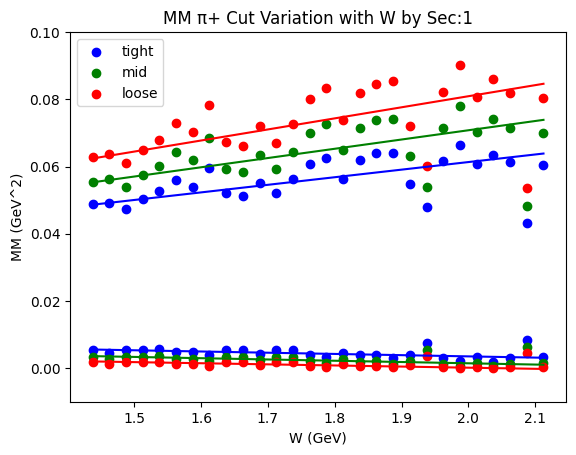

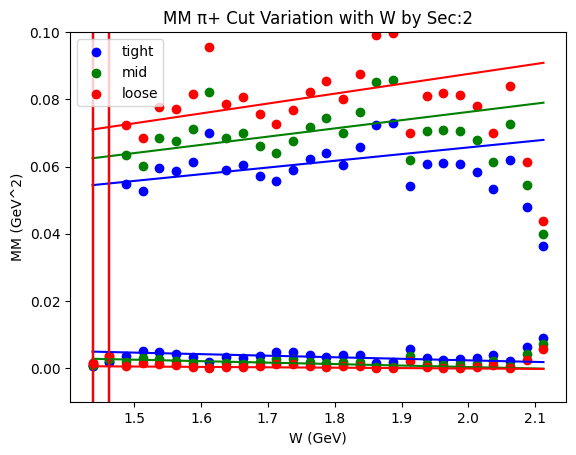

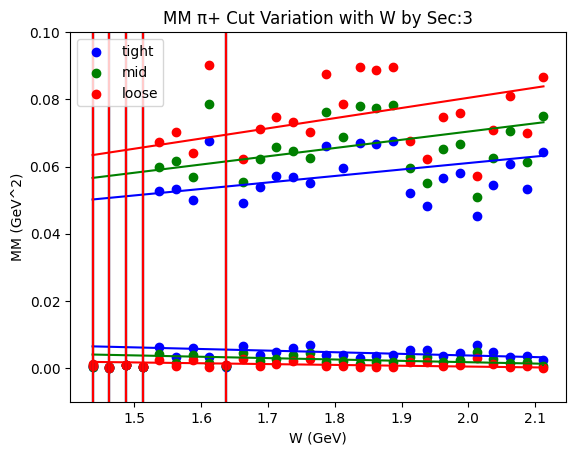

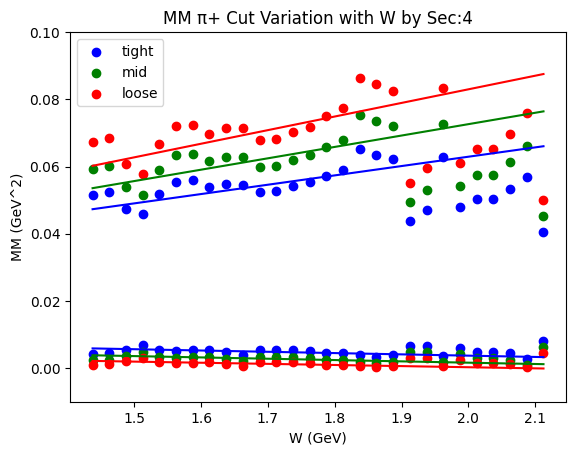

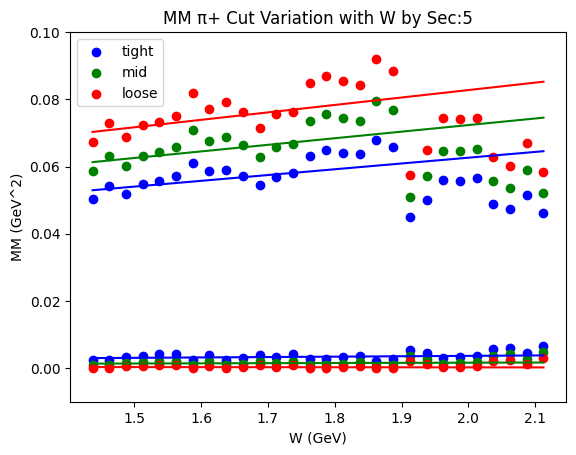

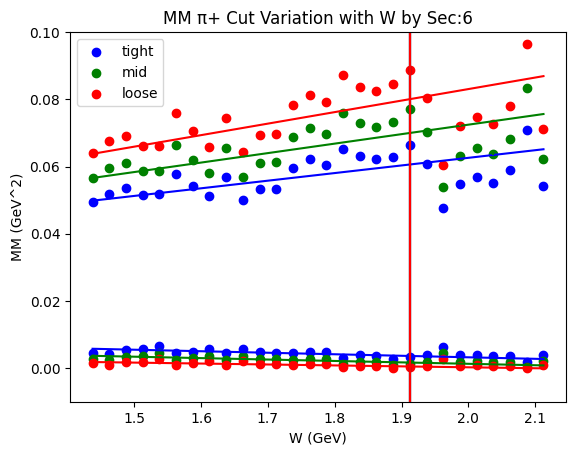

In [21]:
W_bins = [W_center(i) for i in range(_W_bins_)]

def Linear(x_,a_,b_):
    return a_ + b_*x_

lin_fit = np.zeros((6,2,3,2))

for sec in range(6):
#     y_tight_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
#     y_tight_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][0] for Wbin in range(_W_bins_)])
#     y_mid_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
#     y_mid_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][1] for Wbin in range(_W_bins_)])
#     y_loose_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
#     y_loose_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][2] for Wbin in range(_W_bins_)])
#     #x_tight = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
#     x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
    for i in range(3):
        for j in range(2):
            x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][j][i] for Wbin in range(_W_bins_)])
            y = Remove_Zeros_Y([cut_bounds[sec][Wbin][j][i] for Wbin in range(_W_bins_)])
            if j ==0:
                plt.scatter(x,y,color=color_order[i],label=cut_names[i])
                plt.errorbar(x,y,color=color_order[i],yerr=Remove_Zeros_Y([cut_bounds_err[sec][Wbin][j][i] for Wbin in range(_W_bins_)]),ls='')
            else:
                plt.scatter(x,y,color=color_order[i])
                plt.errorbar(x,y,color=color_order[i],yerr=Remove_Zeros_Y([cut_bounds_err[sec][Wbin][j][i] for Wbin in range(_W_bins_)]),ls='')
            try:
                pars, pars_cov = op.curve_fit(Linear,x,y,sigma=Remove_Zeros_Y([cut_bounds_err[sec][Wbin][j][i] for Wbin in range(_W_bins_)]),maxfev=5000)
                cont_x = np.linspace(np.min(x),np.max(x),200)
                plt.plot(cont_x,Linear(cont_x,*pars),color=color_order[i])
                lin_fit[sec][j][i][0] = pars[1]
                lin_fit[sec][j][i][1] = pars[0]
            except RuntimeError:
                print("runtime error")
            except ValueError:
                print("Value error")
#     plt.scatter(x,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
#     plt.scatter(x,y_tight_w2,color='b',)
#     plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
#     plt.scatter(x,y_mid_w2,color='g')
#     plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
#     plt.scatter(x,y_loose_w2,color='r')
#     plt.errorbar(x,y_tight_w1,color='b',yerr=cut_bounds[sec][_W_bins_][0][0])
#     plt.scatter(x,y_tight_w2,color='b',)
#     plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
#     plt.scatter(x,y_mid_w2,color='g')
#     plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
#     plt.scatter(x,y_loose_w2,color='r')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][0],_W_min_,_W_max_,color='b',label="W range tight +-{}\u03C3".format(tight))
#     plt.hlines(cut_bounds[sec][_W_bins_][1][0],_W_min_,_W_max_,color='b')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][1],_W_min_,_W_max_,color='g',label="W range mid +-{}\u03C3".format(mid))
#     plt.hlines(cut_bounds[sec][_W_bins_][1][1],_W_min_,_W_max_,color='g')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][2],_W_min_,_W_max_,color='r',label="W range loose +-{}\u03C3".format(loose))
#     plt.hlines(cut_bounds[sec][_W_bins_][1][2],_W_min_,_W_max_,color='r')
    plt.legend()
    plt.ylim([-0.01,0.1])
    plt.title("MM {} Cut Variation with W by Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM (GeV^2)")
    plt.show()
    
    
    
    

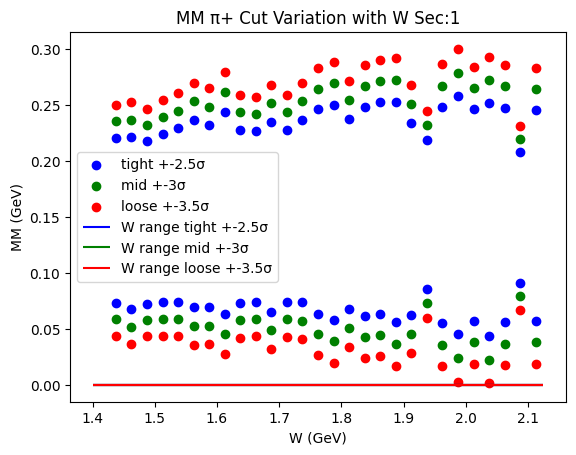

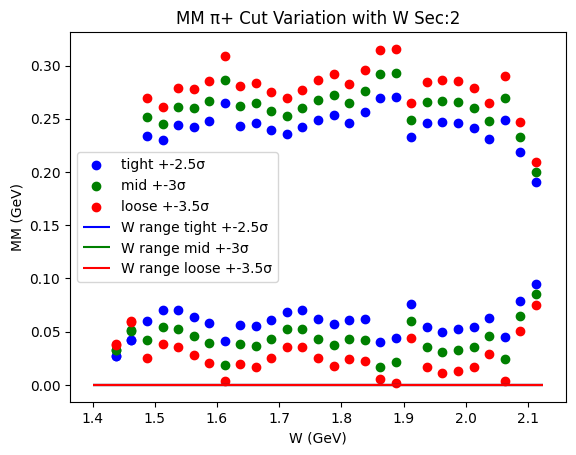

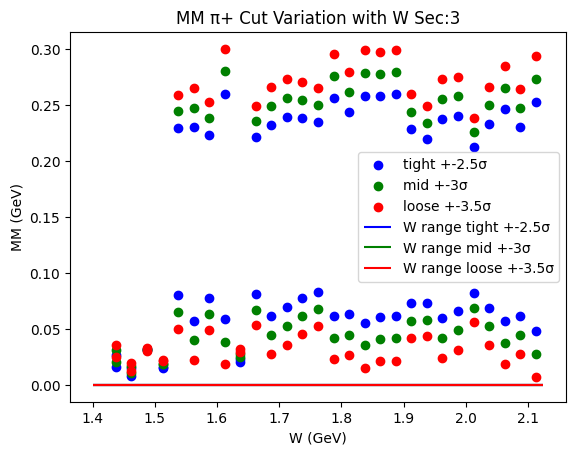

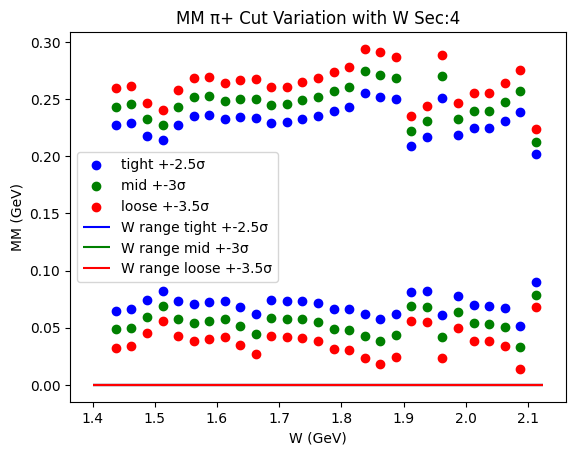

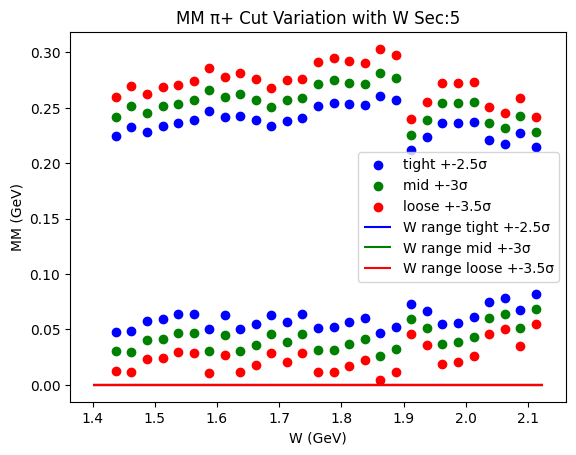

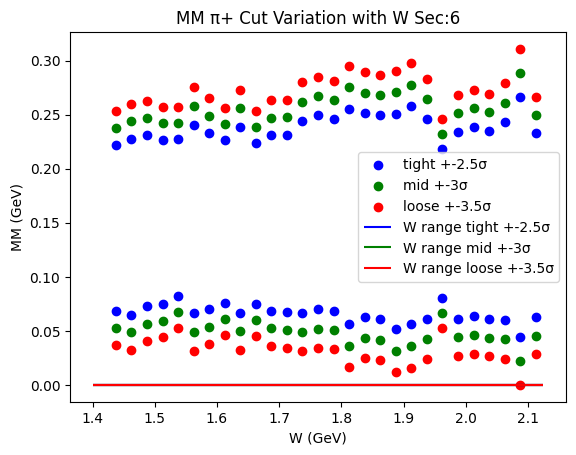

In [17]:
for sec in range(6):
    y_tight_w1 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][0])*math.sqrt(sign(cut_bounds[sec][Wbin][0][0])*cut_bounds[sec][Wbin][0][0]) for Wbin in range(_W_bins_)])
    y_tight_w2 = Remove_Zeros_Y([math.sqrt(cut_bounds[sec][Wbin][1][0]) for Wbin in range(_W_bins_)])
    y_mid_w1 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][1])*math.sqrt(sign(cut_bounds[sec][Wbin][0][1])*cut_bounds[sec][Wbin][0][1]) for Wbin in range(_W_bins_)])
    y_mid_w2 = Remove_Zeros_Y([math.sqrt(cut_bounds[sec][Wbin][1][1]) for Wbin in range(_W_bins_)])
    y_loose_w1 = Remove_Zeros_Y([math.sqrt(sign(cut_bounds[sec][Wbin][0][2])*cut_bounds[sec][Wbin][0][2]) for Wbin in range(_W_bins_)])
    y_loose_w2 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][2])*math.sqrt(cut_bounds[sec][Wbin][1][2]) for Wbin in range(_W_bins_)])
    #x_tight = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
    x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
    #x_loose = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
    plt.scatter(x,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
    plt.scatter(x,y_tight_w2,color='b',)
    plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
    plt.scatter(x,y_mid_w2,color='g')
    plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
    plt.scatter(x,y_loose_w2,color='r')
    plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][0][0]),_W_min_,_W_max_,color='b',label="W range tight +-{}\u03C3".format(tight))
    plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][1][0]),_W_min_,_W_max_,color='b')
    plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][0][1]),_W_min_,_W_max_,color='g',label="W range mid +-{}\u03C3".format(mid))
    plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][1][1]),_W_min_,_W_max_,color='g')
    plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][0][2]),_W_min_,_W_max_,color='r',label="W range loose +-{}\u03C3".format(loose))
    plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][1][2]),_W_min_,_W_max_,color='r')
    plt.legend()
    plt.title("MM {} Cut Variation with W Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM (GeV)")
    plt.show()

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_77362/3464511370.py:5: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(2)*2*m_*g_*bw_gamma(m_,g_)*sign(m_)/(np.pi*np.sqrt(m_*m_+bw_gamma(m_,g_)))


<function matplotlib.pyplot.show(close=None, block=None)>

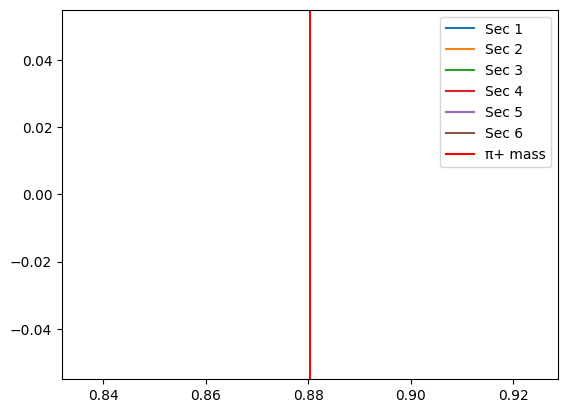

In [18]:
Wbin = _W_bins_
m_par = 0.938272088
for sec in range(6):
    plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][Wbin]),label="Sec {}".format(sec+1))
plt.axvline(x=m_par*m_par,label="{} mass".format(Particle),color='r')
plt.legend()
plt.show

In [19]:
print("MM^2 "+Particle+" Cut Bounds [sec][low/high][tight/mid/loose][slope,intercept]")
for sec in range(6):
    for side in range(2):
        for t in range(3):
            for p in range(2):
                if p ==0:
                    if t == 0:
                        if side ==0:
                            if sec==0:
                                print("{\t{\t{\t{",lin_fit[sec][side][t][p],end=",")
                            else:
                                print("\t{\t{\t{",lin_fit[sec][side][t][p],end=",")
                        else:
                            print("\t\t{\t{",lin_fit[sec][side][t][p],end=",")
                    else:
                        print("{",lin_fit[sec][side][t][p],end=",")
                elif p==1:
                    if t == 2:
                        if side == 1:
                            if sec == 5:
                                print(lin_fit[sec][side][t][p],"}}}}")
                            else:
                                print(lin_fit[sec][side][t][p],"}}},")
                        else: 
                            print(lin_fit[sec][side][t][p],"}},")
                    else:
                        print(lin_fit[sec][side][t][p],end="},")
                else: 
                     print(lin_fit[sec][side][t][p],end=",")


MM^2 π+ Cut Bounds [sec][low/high][tight/mid/loose][slope,intercept]
{	{	{	{ -0.0036337523984343143,0.010763440829318838},{ -0.0037874719866568527,0.009014973197921758},{ -0.003311365578021572,0.006752086133982562 }},
		{	{ 0.022559198000190107,0.016207155237434052},{ 0.02753693566733566,0.01571532372893655},{ 0.03293916900080083,0.015041840889473591 }}},
	{	{	{ -0.00461578051840559,0.011543235478605971},{ -0.00435969852907925,0.009049567803662659},{ -0.001171083056823511,0.0022361467977117765 }},
		{	{ 0.019938441305171726,0.025805750133541444},{ 0.02449421697665535,0.027255343215314264},{ 0.029393893113346378,0.028773320760930258 }}},
	{	{	{ -0.004819273742161091,0.0134029444667568},{ -0.004058299524431498,0.009876683786693364},{ -0.0024615047478383084,0.005387496361901662 }},
		{	{ 0.019286862434916462,0.022462830155182825},{ 0.024522490736244063,0.021362254267874428},{ 0.03029517517557203,0.019859372548182503 }}},
	{	{	{ -0.003834290519336409,0.01138024836021329},{ -0.0039206611719

In [20]:
# print("MM^2 "+Particle+" Cut Bounds [sec][low/high][tight/mid/loose]")
# for sec in range(6):
#     for side in range(2):
#         for t in range(3):
#             if t == 0:
#                 if side ==0:
#                     if sec==0:
#                         print("{\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                     else:
#                         print("\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                 else:
#                     print("\t\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#             elif t == 2:
#                 if side == 1:
#                     if sec == 5:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}}}")
#                     else:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}},")
#                 else: 
#                     print(cut_bounds[sec][_W_bins_][side][t],"},")
#             else: 
#                 print(cut_bounds[sec][_W_bins_][side][t],end=",")



In [14]:
# print("MM^2 "+Particle+" Linear Cut Bounds [sec][low/high][tight/mid/loose]")
# for sec in range(6):
#     for side in range(2):
#         for t in range(3):
#             if t == 0:
#                 if side ==0:
#                     if sec==0:
#                         print("{\t{\t{","\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")
#                     else:
#                         print("\t{\t{","\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")
#                 else:
#                     print("\t{","\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")
#             elif t == 2:
#                 if side == 1:
#                     if sec == 5:
#                         print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}","}}}")
#                     else:
#                         print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}","}},")
#                 else: 
#                     print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}","},")
#             else: 
#                 print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")